In [1]:
import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
%matplotlib inline
import collections
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.sparse as sp_sparse
import tables
import gc
from scipy.sparse import coo_matrix
from sklearn.preprocessing import normalize
import gzip

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss

import statsmodels.api as sm
from scipy import stats
import math

import pickle


/Users/bill/anaconda/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
def cosine_corr(a,b):
    return np.abs(a.dot(b)/(np.linalg.norm(a)*np.linalg.norm(b)))

## load data

In [3]:
TPMs=pd.read_csv('/Users/bill/WoRk_R/TRAP/trap_tpms.csv',index_col=0)

X=np.array(TPMs)
sample_names=np.array(TPMs.columns)
tx_names=np.array(TPMs.index)

cell_labels=np.array(pd.read_csv('/Users/bill/WoRk_R/TRAP/trap_labels.csv',dtype=int)["x"])
cell_ptime=np.array(pd.read_csv('/Users/bill/WoRk_R/TRAP/trap_ptime.csv',dtype=float)["x"])

ENST_idx=np.array([i for i in range(len(tx_names)) if tx_names[i][:4]=='ENST'])
X=X[ENST_idx,:].T
tx_names=tx_names[ENST_idx]
tx_names=np.array([t.split('.')[0] for t in tx_names])
print X.shape

TX_SET=set([int(tx_names[tx_cnt][4:]) for tx_cnt in range(len(tx_names))])

(222, 216331)


In [4]:
path_to_ref='/Users/bill/Downloads/Homo_sapiens.GRCh38.84.cdna.all.fa.gz'

def readENS_ids(path_to_ref):
    TX_to_ENSG={}
    ENSG_isoforms={}
    line_cnt=0;
    tx_cnt=0;
    with gzip.open(path_to_ref) as f:
        for line in f:
            if line[0]=='>':
                s=line.split("ENST",1)[1][:11]
#                 print int(line.split("ENST",1)[1][:11])
#                 return [TX_to_ENSG,ENSG_isoforms]
                if int(s) in TX_SET:
                    TX_to_ENSG['ENST'+s] = 'ENSG'+line.split("ENSG",1)[1][:11]
                    ENSG_isoforms[TX_to_ENSG['ENST'+s]] = ENSG_isoforms.get(TX_to_ENSG['ENST'+s], [])
                    ENSG_isoforms[TX_to_ENSG['ENST'+s]].append('ENST'+s)
                    tx_cnt+=1 
                    if tx_cnt==len(TX_SET): return [TX_to_ENSG,ENSG_isoforms]
                line_cnt+=1
    return [TX_to_ENSG,ENSG_isoforms]


[TX_to_ENSG,ENSG_isoforms]=readENS_ids(path_to_ref)       

In [5]:
all_genes_ids = np.unique(TX_to_ENSG.values())
print "NUM_OF_GENE_IDs =", len(all_genes_ids)

NUM_OF_GENE_IDs = 38694


In [6]:
len(ENSG_isoforms.keys())

38694

In [7]:
len(TX_to_ENSG.keys())

176241

In [8]:
len(tx_names)

216331

In [9]:
txset=set(TX_to_ENSG.keys())
noncodingTX=[i for i in tx_names if i not in txset]

#### gene names

In [10]:
# #gene ids to gene names (requires "pip install mygene")
# import mygene
# mg = mygene.MyGeneInfo()
# ginfo = mg.querymany(all_genes_ids, scopes='ensembl.gene',returnall=True)

# with open('ginfo_TRAP.pickle', 'wb') as handle:
#     pickle.dump(ginfo, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('ginfo_TRAP.pickle', 'rb') as handle:
    ginfo = pickle.load(handle)

In [11]:
missing_names=ginfo['missing']
duplicate_names=ginfo['dup']

In [12]:
#ENSG to Gene-Names
all_gene_id_to_names={} #missing are mapped to their ENSG id, Duplicates to a list of names
count_exept=0
for g in ginfo['out']:
    try:
        ensg_id=str(g['query'])
        all_gene_id_to_names[ensg_id] = all_gene_id_to_names.get(ensg_id, [])
        all_gene_id_to_names[ ensg_id].append(str(g['symbol']))                
    except KeyError:
        count_exept=count_exept+1
        all_gene_id_to_names[ str(g['query']) ] = [str(g['query'])]
        
#Gene-Names to ENSG
all_gene_names_to_id={} #missing are mapped to their ENSG id, Duplicates to a list of names
count_exept=0
for g in ginfo['out']:
    try:
        gene_name=str(g['symbol'])
        all_gene_names_to_id[gene_name] = all_gene_names_to_id.get(gene_name, [])
        all_gene_names_to_id[ gene_name].append(str(g['query']))                
    except KeyError:
        count_exept=count_exept+1
        all_gene_names_to_id[ str(g['query']) ] = [str(g['query'])]

In [13]:
#example
print all_gene_id_to_names["ENSG00000126353"] #CCR7 
print all_gene_names_to_id["MYOG"]

['CCR7']
['ENSG00000122180']


In [14]:
def search_gene(starting_letters):
    print "SEARCHING: ",starting_letters,"..."
    for gene in all_genes_ids:
        if all_gene_id_to_names[gene][0][:len(starting_letters)] == starting_letters:
            print gene,all_gene_id_to_names[gene]
    print "DONE"

##### gene to idx

In [15]:
def gene_to_iso_IDX(ensg):
    iso = ENSG_isoforms[ensg]
    return np.array([np.where(tx_names==t)[0][0] for t in iso])
    

In [16]:
#example
gene_to_iso_IDX(all_gene_names_to_id["MYOG"][0])

array([70277])

In [18]:

X1=X[np.squeeze(cell_labels==1),:]
X2=X[np.squeeze(cell_labels==2),:]

print X1.shape
print X2.shape

N1=X1.shape[0]
N2=X2.shape[0]

(85, 216331)
(97, 216331)


# Example GENES

['ENST00000308162' 'ENST00000531413']
(182, 2)
216.70538136
score 0.584793161003
llf -106.432355303
llnull -125.756895331
LLR 19.3245400288
p-val 4.0500361953e-09


/Users/bill/anaconda/lib/python2.7/site-packages/numpy/ma/core.py:6385: MaskedArrayFutureWarning: In the future the default for ma.maximum.reduce will be axis=0, not the current None, to match np.maximum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)
/Users/bill/anaconda/lib/python2.7/site-packages/numpy/ma/core.py:6385: MaskedArrayFutureWarning: In the future the default for ma.minimum.reduce will be axis=0, not the current None, to match np.minimum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)
/Users/bill/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:650: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors_original != str('face'):
/Users/bill/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future wil

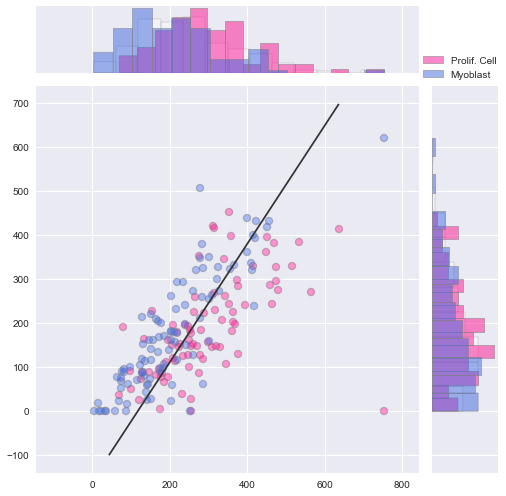

/Users/bill/anaconda/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/Users/bill/anaconda/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


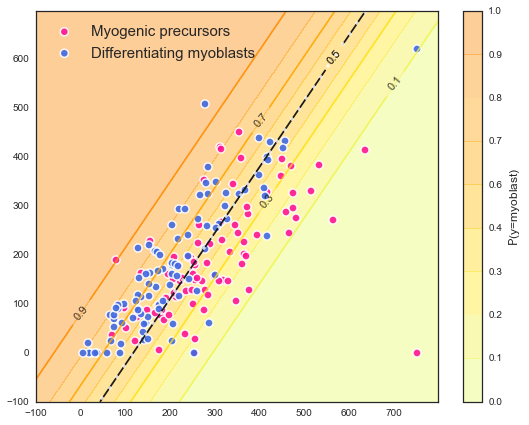

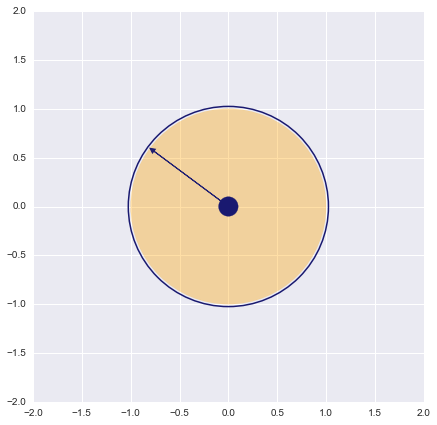

In [19]:
gn="CFL1"
if len(ENSG_isoforms[all_gene_names_to_id[gn][0]])>1:
    total_exp=X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])].sum(axis=0)
#     total_exp=np.std(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)/np.mean(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)

    argsrt=np.argsort(total_exp)
    idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])[argsrt][::-1][:2]
    print tx_names[idx]
    k=2
    c1=X1[:,idx]
    c2=X2[:,idx]
    
else:
    idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])
    print tx_names[idx]
    k=2
    c1=np.concatenate((X1[:,idx],np.zeros((N1,1))),axis=1)
    c2=np.concatenate((X2[:,idx],np.zeros((N2,1))),axis=1)
    
    
c=np.concatenate([c1,c2])
# c=c-np.mean(c,axis=0)
print c.shape
print np.mean(c)
labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)

logr = LogisticRegression()
logr.fit(c,labels)
pred=np.array(logr.predict_proba(c)[:,1])
gene_score=log_loss(labels,pred)

llf=-gene_score*(N1+N2)
p_of_1=N1/float(N1+N2)
llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
llr=llf-llnull
llr_pval = 1-stats.chi2.cdf(2*llr,k)

w=logr.coef_[0]
w0=logr.intercept_[0]
print "score",gene_score
print "llf",llf
print "llnull",llnull
print "LLR",llr
print "p-val",llr_pval

a=sns.jointplot(x=c[:,0], y=c[:,1], color='white',size=7,marginal_kws=dict(norm_hist=True),stat_func=None,label='_nolegend_');

a.ax_joint.scatter(c[:N1,0],c[:N1,1],color='deeppink',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Prolif. Cell')
a.ax_marg_x.hist(c[:N1,0],bins=15,normed=1,alpha=0.5,color='deeppink',edgecolor="gray", linewidth=1,)
a.ax_marg_y.hist(c[:N1,1],bins=15,normed=1,alpha=0.5,color='deeppink',orientation='horizontal',edgecolor="gray", linewidth=1,label='Prolif. Cell')

a.ax_joint.scatter(c[N1:,0],c[N1:,1],color='royalblue',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Myoblast')
a.ax_marg_x.hist(c[N1:,0],bins=15,normed=1,alpha=0.5,color='royalblue',edgecolor="gray", linewidth=1,)
a.ax_marg_y.hist(c[N1:,1],bins=15,normed=1,alpha=0.5,color='royalblue',orientation='horizontal',edgecolor="gray", linewidth=1,label='Myoblast')

plt.legend(bbox_to_anchor=(0.1, 1, 1., .102))
# a.ax_joint.set_xlim([-40,40])
# a.ax_joint.set_ylim([-40,40])
ylim=a.ax_joint.get_ylim()
xlim=a.ax_joint.get_xlim()
xx, yy = np.mgrid[xlim[0]:xlim[1]:(xlim[1]-xlim[0])/500., ylim[0]:ylim[1]:(ylim[1]-ylim[0])/500.]
grid = np.c_[xx.ravel(), yy.ravel()]
probs = logr.predict_proba(grid)[:, 1].reshape(xx.shape)
a.ax_joint.contour(xx, yy, probs, levels=[.5], cmap="Greys", vmin=0, vmax=.6)
plt.show()    
    
    
    
############
cmapo='Wistia'

sns.set_style("white")

f, ax = plt.subplots(figsize=(9,7))

cs = ax.contourf(xx, yy, 1-probs,[0,0.1,0.2,0.3,0.4,0.6,0.7,0.8,0.9,1], cmap=cmapo, alpha=.4)
cs2 = ax.contour(xx, yy, 1-probs,[0,0.1,0.3,0.7,0.9,1]
                 , cmap=cmapo, alpha=.75)
cs3=ax.contour(xx, yy, probs, [.5], cmap="Greys", vmin=0, vmax=.55,alpha=1)


showPTS=1000
showalpha=0.9
showSZ=65
showLW=1.5
ax.scatter(c1[:showPTS,0], c1[:showPTS,1], c='deeppink', s=showSZ,
           edgecolor="white", linewidth=showLW,alpha=showalpha,label='Myogenic precursors')
ax.scatter(c2[:showPTS,0], c2[:showPTS,1], c='royalblue', s=showSZ,
           edgecolor="white", linewidth=showLW,alpha=showalpha,label='Differentiating myoblasts')
ax.clabel(cs2, fmt = '%2.1f', colors = 'k', fontsize=11)

ax.clabel(cs3, fmt = '%2.1f', colors = 'k', fontsize=11)

ax.legend(loc=2,fontsize=15)

w = logr.coef_[0]
a = -w[0] / w[1]
xx1 = np.linspace(0, np.max(xx))
yy1 = a * xx1 -(logr.intercept_[0]) / w[1]
plt.plot(xx1, yy1, 'w.',alpha=0.8,lw=1)

# plt.arrow(xx1[5], yy1[5],0.5* w[0]/w[1], 0.5, head_width=0.09, head_length=0.15, fc='k', ec='k',linestyle='dashed',linewidth=.7)


plt.ylim([np.min(yy),np.max(yy)])
plt.xlim([np.min(xx),np.max(xx)])
ax_c = f.colorbar(cs)
ax_c.set_label("${\sf P}$(y=myoblast)",fontsize=12)
ax_c.set_ticks([0,0.1,0.2,0.3,0.4,0.6,0.7,0.8,0.9,1])

plt.show()    
##########   
    
    
    
    
    
    
    
sns.set_style("darkgrid")    
plt.figure(figsize=(7,7))
x0, y0 = 0, 0
radius = 1
# Draw circle
circle1 = plt.Circle((x0,y0), radius, color='orange', fill=True,alpha=0.35)
circle2 = plt.Circle((x0,y0), radius+0.025, color='midnightblue', fill=False,linewidth=1.5)

fig = plt.gcf()
fig.gca().add_artist(circle1)
fig.gca().add_artist(circle2)
head_length=0.05
vec=-w/np.linalg.norm(w)
plt.arrow(x0, y0,
             (radius - head_length) * vec[0],
             (radius - head_length) * vec[1],
             head_width=0.05, head_length=head_length, fc='midnightblue', ec='midnightblue',alpha=0.95,linewidth=1)
plt.xlim([-2,2])
plt.ylim([-2,2])

circleC = plt.Circle((x0,y0), 0.1, color='midnightblue', fill=True,alpha=1)
fig.gca().add_artist(circleC)

['ENST00000326004' 'ENST00000399494']
(182, 2)
456.127142791
score 0.417620836223
llf -76.0069921926
llnull -125.756895331
LLR 49.7499031389
p-val 0.0


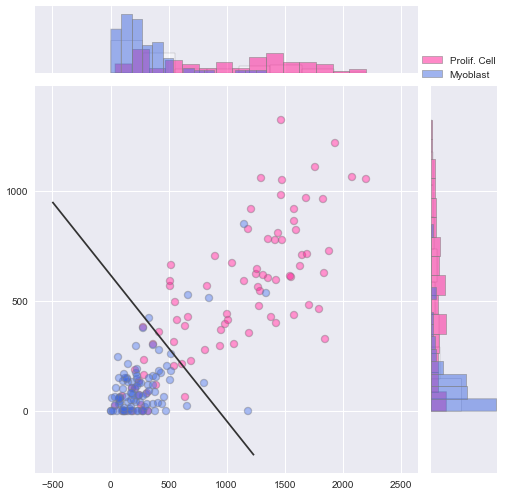

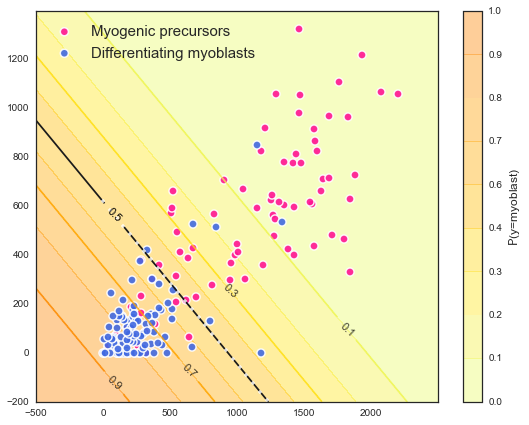

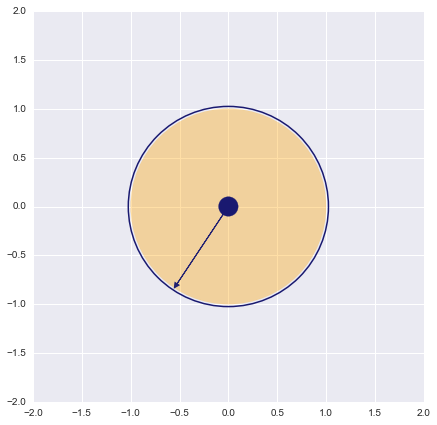

In [20]:
gn="HMGB1"
if len(ENSG_isoforms[all_gene_names_to_id[gn][0]])>1:
    total_exp=X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])].sum(axis=0)
#     total_exp=np.std(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)/np.mean(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)

    argsrt=np.argsort(total_exp)
    idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])[argsrt][::-1][:2]
    print tx_names[idx]
    k=2
    c1=X1[:,idx]
    c2=X2[:,idx]
    
else:
    idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])
    print tx_names[idx]
    k=2
    c1=np.concatenate((X1[:,idx],np.zeros((N1,1))),axis=1)
    c2=np.concatenate((X2[:,idx],np.zeros((N2,1))),axis=1)
    
    
c=np.concatenate([c1,c2])
# c=c-np.mean(c,axis=0)
print c.shape
print np.mean(c)
labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)

logr = LogisticRegression()
logr.fit(c,labels)
pred=np.array(logr.predict_proba(c)[:,1])
gene_score=log_loss(labels,pred)

llf=-gene_score*(N1+N2)
p_of_1=N1/float(N1+N2)
llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
llr=llf-llnull
llr_pval = 1-stats.chi2.cdf(2*llr,k)

w=logr.coef_[0]
w0=logr.intercept_[0]
print "score",gene_score
print "llf",llf
print "llnull",llnull
print "LLR",llr
print "p-val",llr_pval

a=sns.jointplot(x=c[:,0], y=c[:,1], color='white',size=7,marginal_kws=dict(norm_hist=True),stat_func=None,label='_nolegend_');

a.ax_joint.scatter(c[:N1,0],c[:N1,1],color='deeppink',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Prolif. Cell')
a.ax_marg_x.hist(c[:N1,0],bins=15,normed=1,alpha=0.5,color='deeppink',edgecolor="gray", linewidth=1,)
a.ax_marg_y.hist(c[:N1,1],bins=15,normed=1,alpha=0.5,color='deeppink',orientation='horizontal',edgecolor="gray", linewidth=1,label='Prolif. Cell')

a.ax_joint.scatter(c[N1:,0],c[N1:,1],color='royalblue',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Myoblast')
a.ax_marg_x.hist(c[N1:,0],bins=15,normed=1,alpha=0.5,color='royalblue',edgecolor="gray", linewidth=1,)
a.ax_marg_y.hist(c[N1:,1],bins=15,normed=1,alpha=0.5,color='royalblue',orientation='horizontal',edgecolor="gray", linewidth=1,label='Myoblast')

plt.legend(bbox_to_anchor=(0.1, 1, 1., .102))
# a.ax_joint.set_xlim([-40,40])
# a.ax_joint.set_ylim([-40,40])
ylim=a.ax_joint.get_ylim()
xlim=a.ax_joint.get_xlim()
xx, yy = np.mgrid[xlim[0]:xlim[1]:(xlim[1]-xlim[0])/500., ylim[0]:ylim[1]:(ylim[1]-ylim[0])/500.]
grid = np.c_[xx.ravel(), yy.ravel()]
probs = logr.predict_proba(grid)[:, 1].reshape(xx.shape)
a.ax_joint.contour(xx, yy, probs, levels=[.5], cmap="Greys", vmin=0, vmax=.6)
plt.show()    
    
    
    
############
cmapo='Wistia'

sns.set_style("white")

f, ax = plt.subplots(figsize=(9,7))

cs = ax.contourf(xx, yy, 1-probs,[0,0.1,0.2,0.3,0.4,0.6,0.7,0.8,0.9,1], cmap=cmapo, alpha=.4)
cs2 = ax.contour(xx, yy, 1-probs,[0,0.1,0.3,0.7,0.9,1]
                 , cmap=cmapo, alpha=.75)
cs3=ax.contour(xx, yy, probs, [.5], cmap="Greys", vmin=0, vmax=.55,alpha=1)


showPTS=1000
showalpha=0.9
showSZ=65
showLW=1.5
ax.scatter(c1[:showPTS,0], c1[:showPTS,1], c='deeppink', s=showSZ,
           edgecolor="white", linewidth=showLW,alpha=showalpha,label='Myogenic precursors')
ax.scatter(c2[:showPTS,0], c2[:showPTS,1], c='royalblue', s=showSZ,
           edgecolor="white", linewidth=showLW,alpha=showalpha,label='Differentiating myoblasts')
ax.clabel(cs2, fmt = '%2.1f', colors = 'k', fontsize=11)

ax.clabel(cs3, fmt = '%2.1f', colors = 'k', fontsize=11)

ax.legend(loc=2,fontsize=15)

w = logr.coef_[0]
a = -w[0] / w[1]
xx1 = np.linspace(0, np.max(xx))
yy1 = a * xx1 -(logr.intercept_[0]) / w[1]
plt.plot(xx1, yy1, 'w.',alpha=0.8,lw=1)

# plt.arrow(xx1[5], yy1[5],0.5* w[0]/w[1], 0.5, head_width=0.09, head_length=0.15, fc='k', ec='k',linestyle='dashed',linewidth=.7)


plt.ylim([np.min(yy),np.max(yy)])
plt.xlim([np.min(xx),np.max(xx)])
ax_c = f.colorbar(cs)
ax_c.set_label("${\sf P}$(y=myoblast)",fontsize=12)
ax_c.set_ticks([0,0.1,0.2,0.3,0.4,0.6,0.7,0.8,0.9,1])

plt.show()    
##########   
    
    
    
    
    
    
    
sns.set_style("darkgrid")    
plt.figure(figsize=(7,7))
x0, y0 = 0, 0
radius = 1
# Draw circle
circle1 = plt.Circle((x0,y0), radius, color='orange', fill=True,alpha=0.35)
circle2 = plt.Circle((x0,y0), radius+0.025, color='midnightblue', fill=False,linewidth=1.5)

fig = plt.gcf()
fig.gca().add_artist(circle1)
fig.gca().add_artist(circle2)
head_length=0.05
vec=-w/np.linalg.norm(w)
plt.arrow(x0, y0,
             (radius - head_length) * vec[0],
             (radius - head_length) * vec[1],
             head_width=0.05, head_length=head_length, fc='midnightblue', ec='midnightblue',alpha=0.95,linewidth=1)
plt.xlim([-2,2])
plt.ylim([-2,2])

circleC = plt.Circle((x0,y0), 0.1, color='midnightblue', fill=True,alpha=1)
fig.gca().add_artist(circleC)

### DE

In [21]:
%%time
labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)
logr = LogisticRegression()
p_of_1=N1/float(N1+N2)
llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
pvals=[]
for gn in ENSG_isoforms.keys():
    k=len(ENSG_isoforms[gn])
    idx=gene_to_iso_IDX(gn)
    c=np.concatenate([X1[:,idx],X2[:,idx]])
    # c=c-np.mean(c,axis=0)

    
    logr.fit(c,labels)
    pred=np.array(logr.predict_proba(c)[:,1])
    gene_score=log_loss(labels,pred)
    llf=-gene_score*(N1+N2)
    llr=llf-llnull
    llr_pval = 1-stats.chi2.cdf(2*llr,k)
    pvals+=[llr_pval]


/Users/bill/anaconda/lib/python2.7/site-packages/sklearn/linear_model/base.py:239: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


CPU times: user 11min 17s, sys: 2.6 s, total: 11min 20s
Wall time: 11min 21s


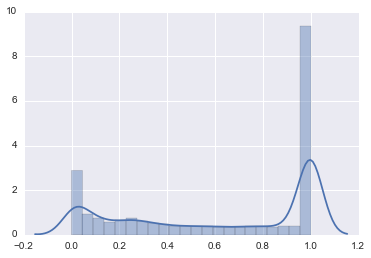

In [22]:
sns.distplot(pvals)

#### multiple test correction

In [23]:
from statsmodels.sandbox.stats.multicomp import multipletests 

In [24]:
ret=multipletests(pvals,0.01,method="fdr_bh")
corr_pvals=ret[1]
rej=ret[0]

print "number of significant genes (fdr=0.01):",np.sum(rej)

number of significant genes (fdr=0.01): 1308


In [25]:
iso_keys=np.array(ENSG_isoforms.keys())
signifi_genes=[all_gene_id_to_names[gn][0] for gn in iso_keys[rej]]

In [26]:
sorted_gen_ids=np.argsort(corr_pvals)
srt_signifi_genes=[all_gene_id_to_names[gn][0] for gn in iso_keys[sorted_gen_ids]]

In [27]:
print srt_signifi_genes[:200]

['MYL4', 'OLFML2A', 'NUSAP1', 'ANXA2', 'MT2A', 'HMGB1P6', 'ADAMTS5', 'MT1L', 'C1orf198', 'MT2P1', 'CENPN', 'MKI67', 'ENO1', 'GAPDH', 'SERPINE1', 'TNNI1', 'AXL', 'TAGLN2', 'MYMK', 'TMSB10', 'H2AFZ', 'MT2P1', 'HMGB1', 'HMGB1P5', 'MT1E', 'TXN', 'FBXO32', 'MT1G', 'SYNPO2', 'SMC4', 'PCLAF', 'NCAPG', 'CDC20', 'CDKN1C', 'RPS24', 'ALDOA', 'IQGAP3', 'VIM', 'VSTM4', 'SNRPD1', 'CD59', 'CENPF', 'KLHL41', 'PBK', 'CLSPN', 'TUBA1B', 'MIF', 'MIF', 'KLHL30', 'TPI1', 'FNDC5', 'MT1X', 'POLR2L', 'CDKN1C', 'SH3BGRL3', 'FABP5', 'SLC20A1', 'LGALS1', 'CLIC1', 'HIST1H3C', 'ANXA2P2', 'PLP2', 'S100A11', 'SLC25A5', 'CENPW', 'SKA3', 'CKAP2L', 'RAN', 'CKS2', 'PTPRS', 'ZNF556', 'ASPM', 'CENPK', 'ACTC1', 'SHCBP1', 'SMS', 'MACF1', 'PRC1', 'CLIC1', 'CLIC1', 'CLIC1', 'CLIC1', 'CLIC1', 'NUAK1', 'PCNA', 'CDCA8', 'NCAM1', 'DNMT1', 'TK1', 'LRRFIP1', 'ATP5C1', 'TXNDC17', 'ACTA2', 'TNNT2', 'HSPB3', 'HMGN2', 'MYLPF', 'CCBE1', 'ANKRD10', 'COX8A', 'CDKN3', 'LDHA', 'TNNC1', 'MAD2L1', 'RASSF4', 'NDC80', 'SMC2', 'FANCD2', 'ANLN', '

### show top 100 genes

MYL4


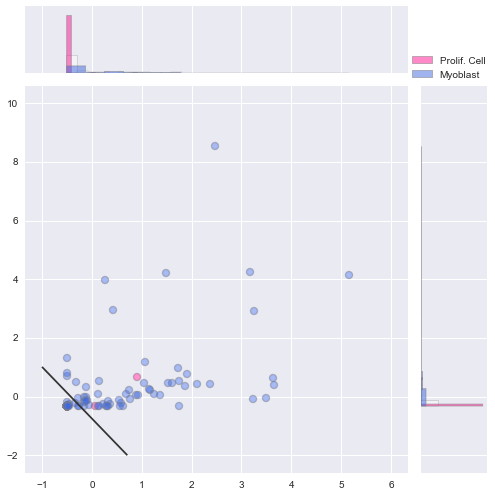

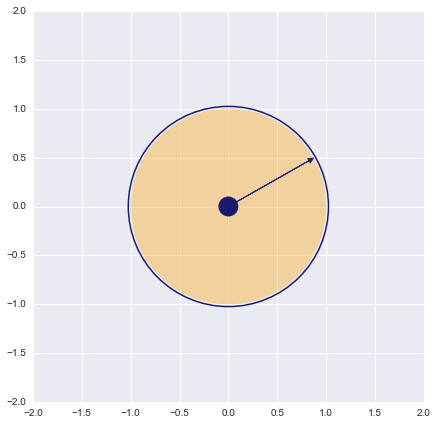

----------------------------------------------------------------
OLFML2A


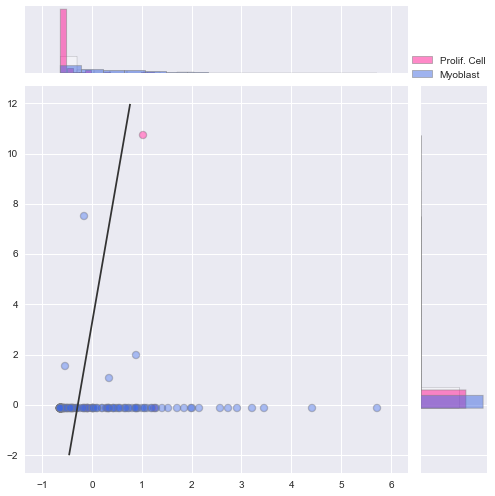

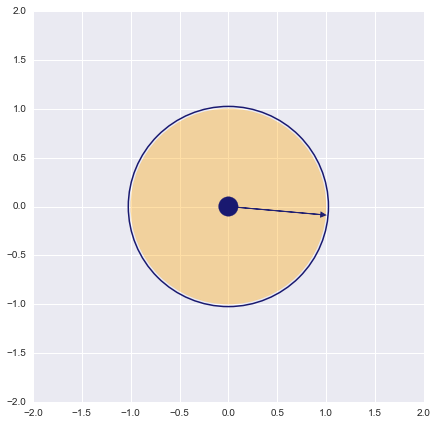

----------------------------------------------------------------
NUSAP1


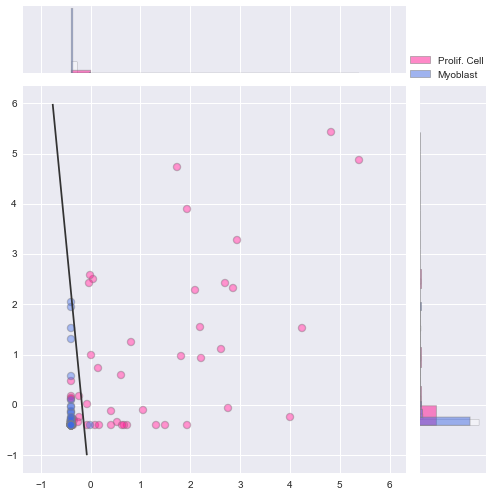

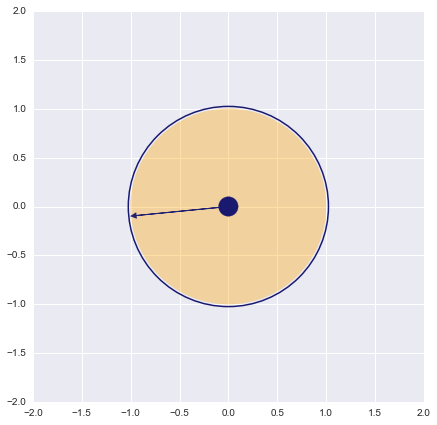

----------------------------------------------------------------
ANXA2


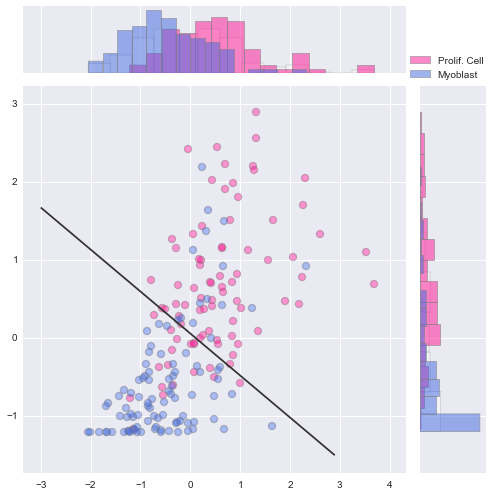

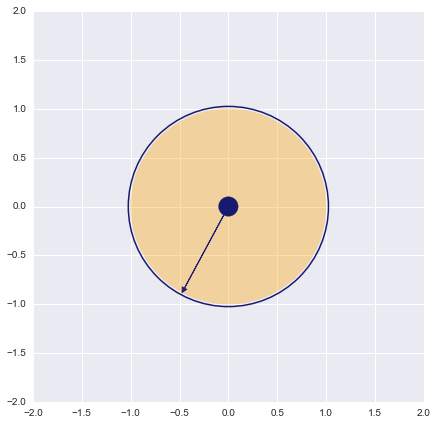

----------------------------------------------------------------
MT2A


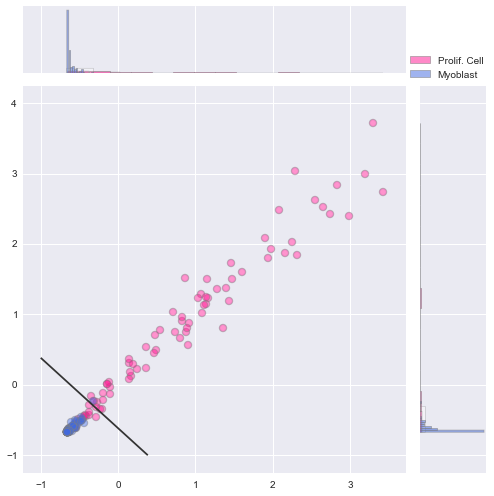

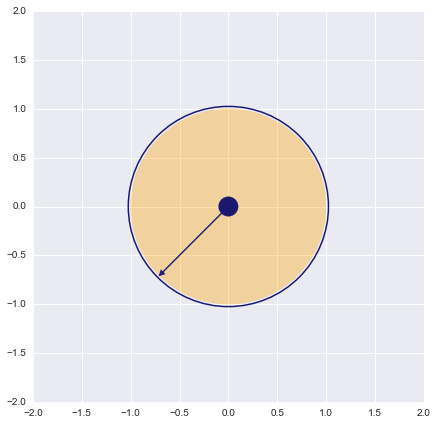

----------------------------------------------------------------
HMGB1P6
ONE


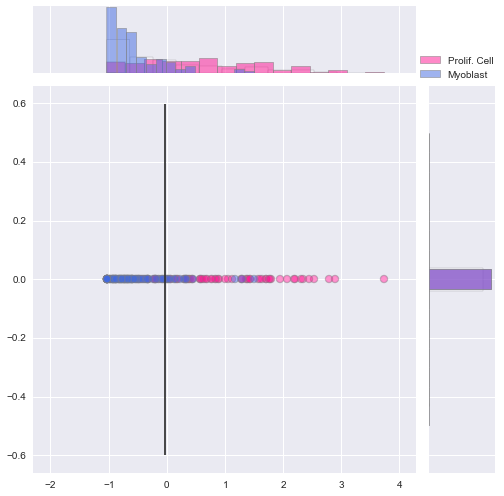

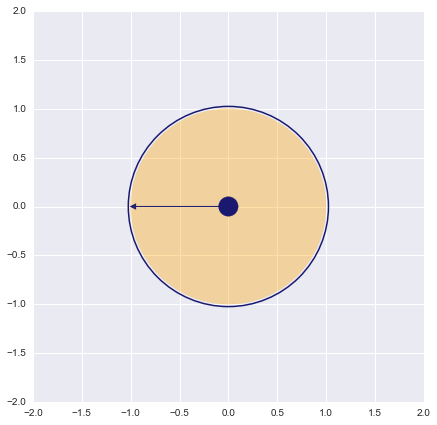

----------------------------------------------------------------
ADAMTS5
ONE


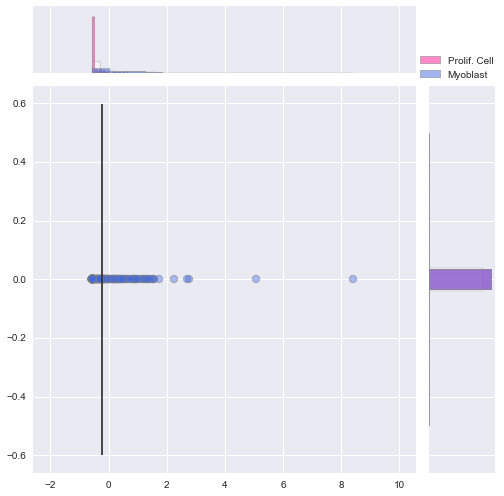

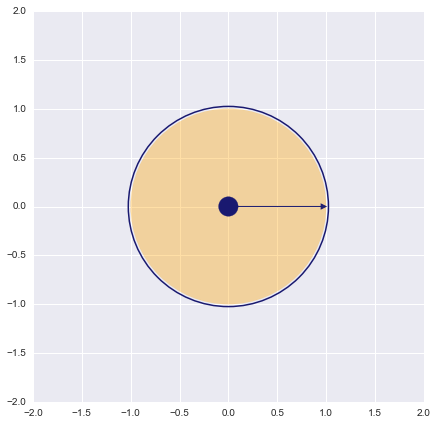

----------------------------------------------------------------
MT1L


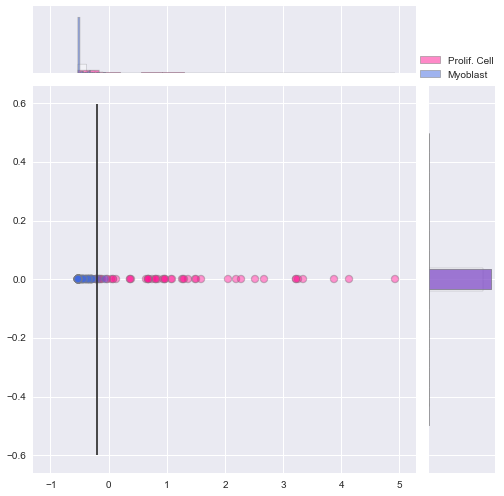

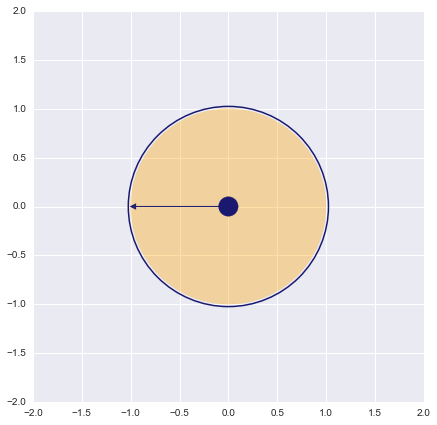

----------------------------------------------------------------
C1orf198


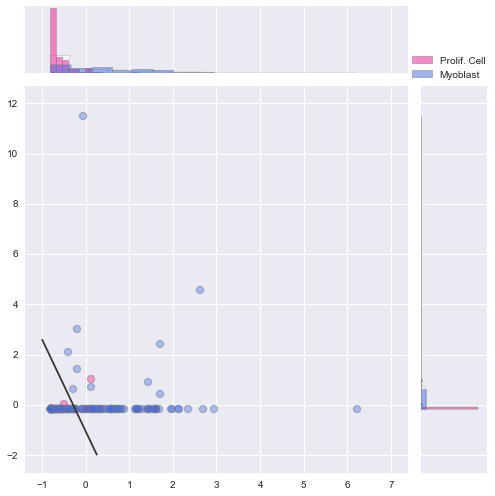

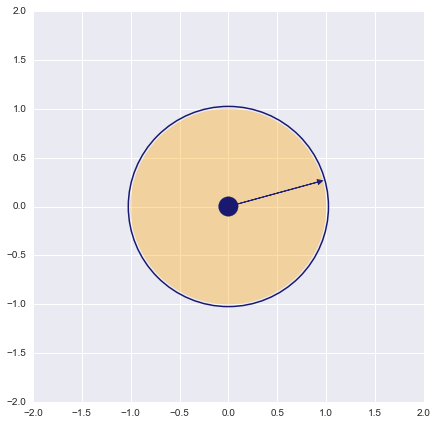

----------------------------------------------------------------
MT2P1
ONE


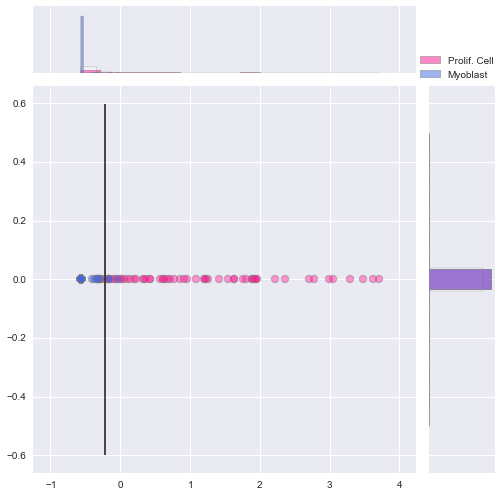

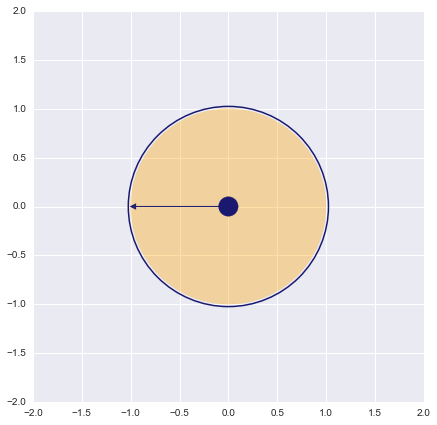

----------------------------------------------------------------
CENPN


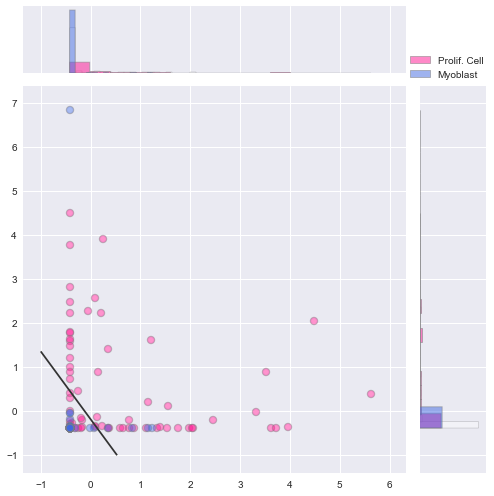

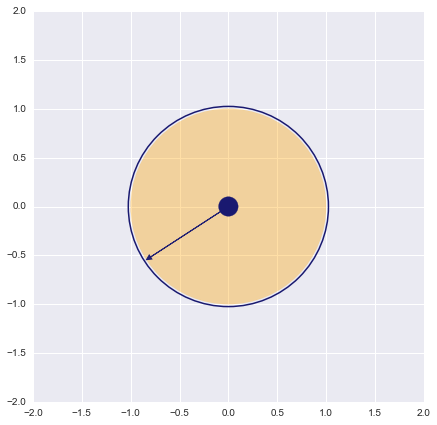

----------------------------------------------------------------
MKI67


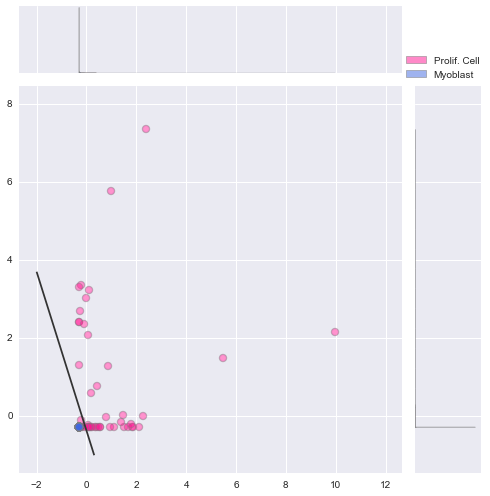

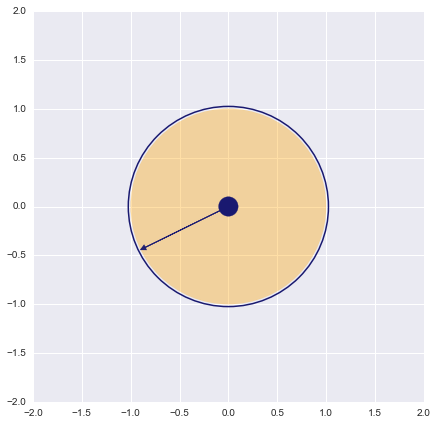

----------------------------------------------------------------
ENO1


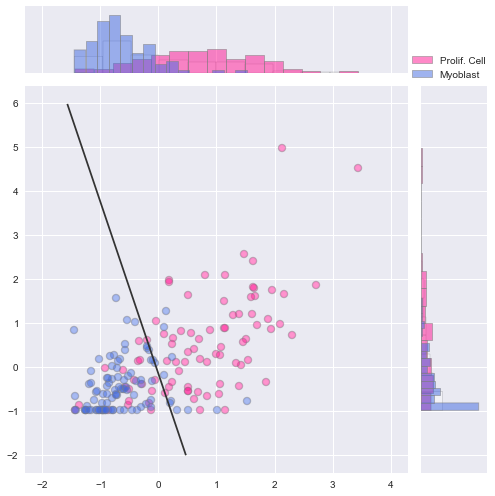

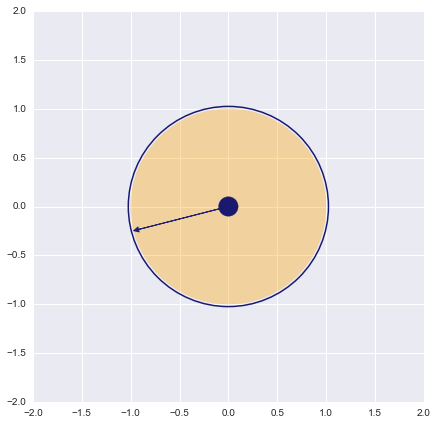

----------------------------------------------------------------
GAPDH


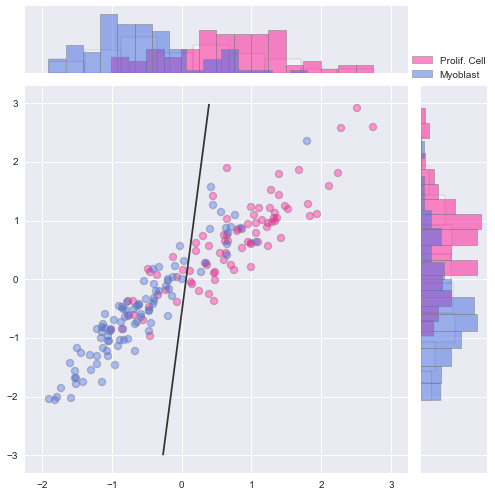

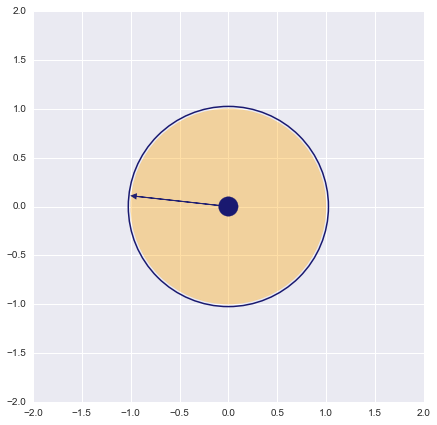

----------------------------------------------------------------
SERPINE1
ONE


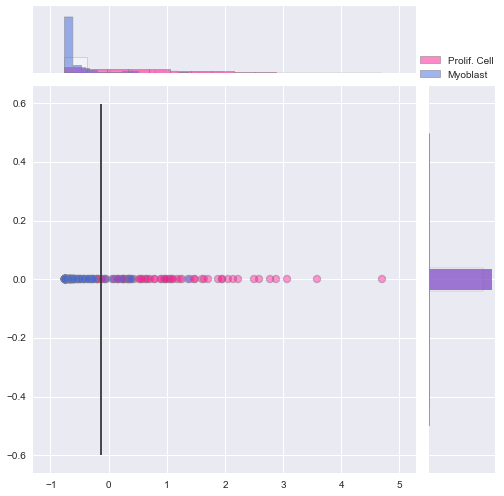

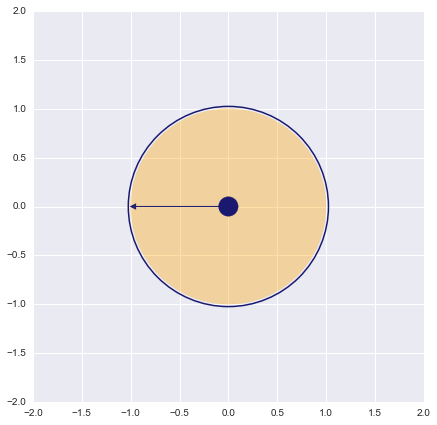

----------------------------------------------------------------
TNNI1


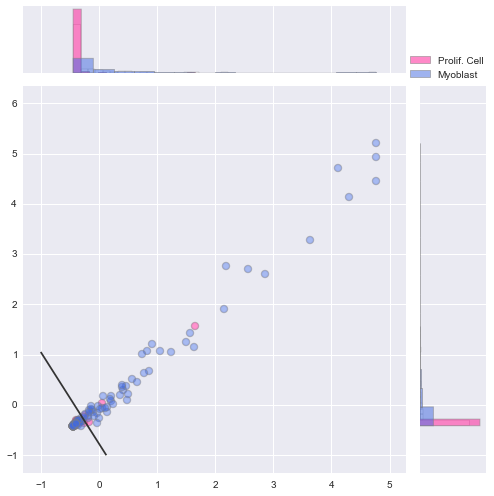

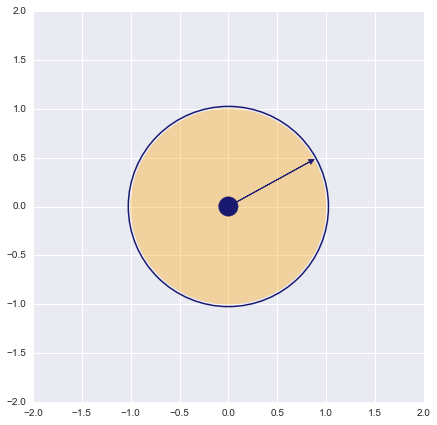

----------------------------------------------------------------
AXL


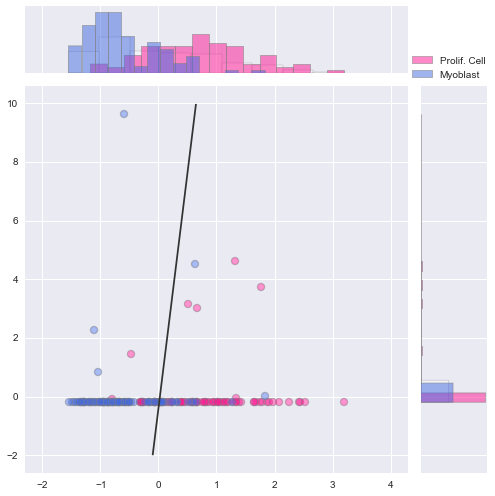

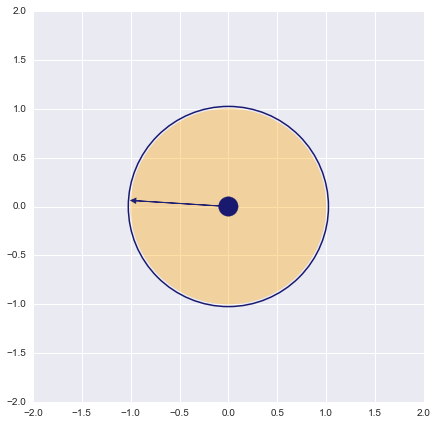

----------------------------------------------------------------
TAGLN2


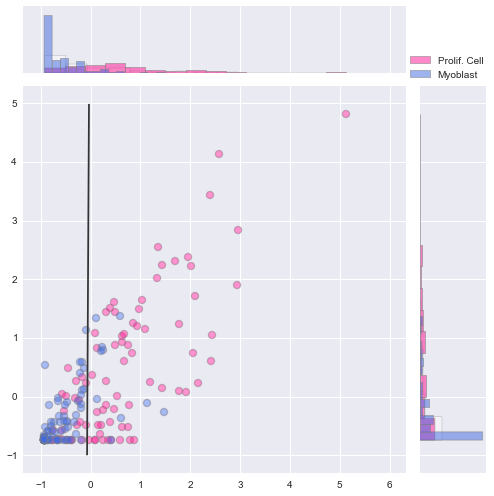

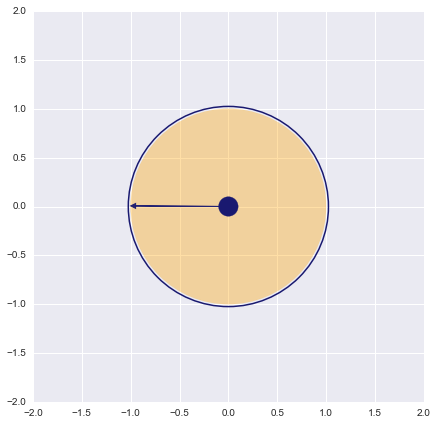

----------------------------------------------------------------
MYMK


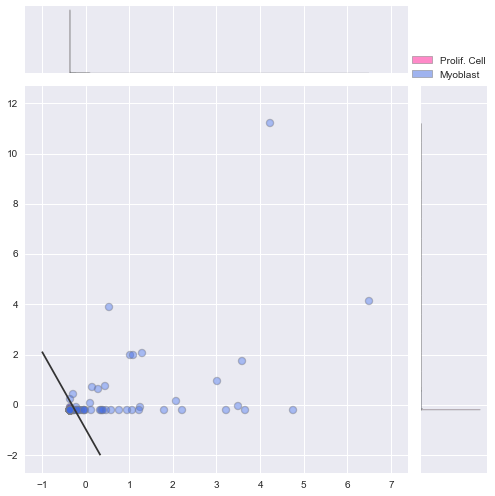

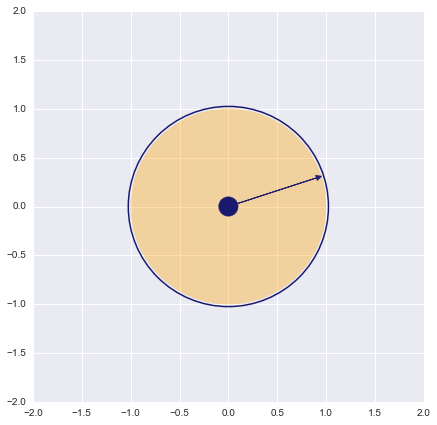

----------------------------------------------------------------
TMSB10
ONE


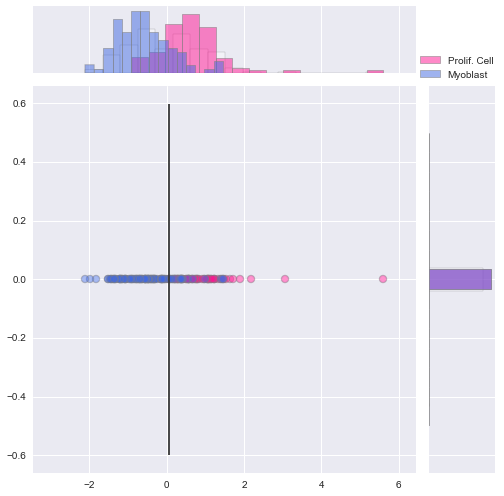

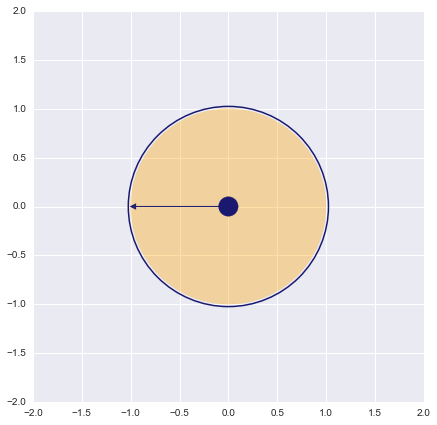

----------------------------------------------------------------
H2AFZ


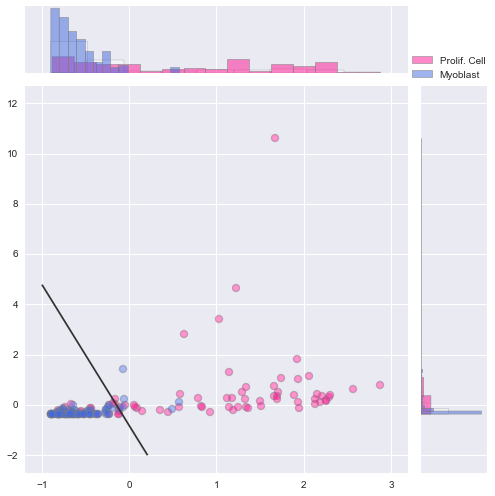

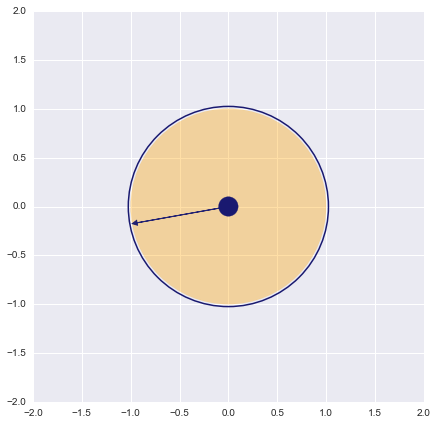

----------------------------------------------------------------
MT2P1
ONE


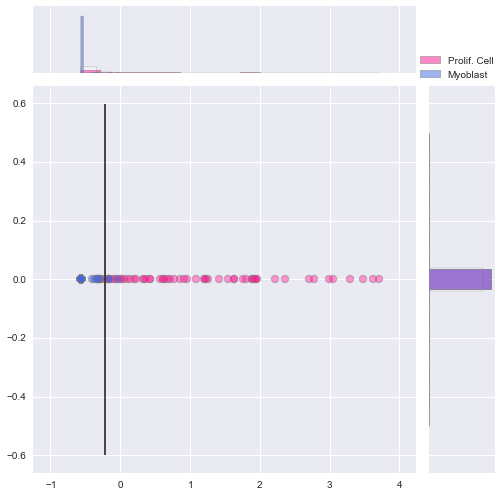

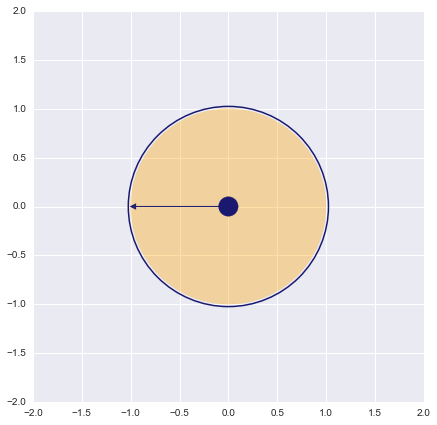

----------------------------------------------------------------
HMGB1


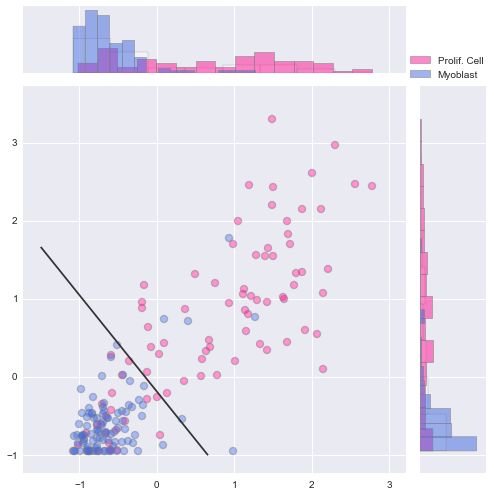

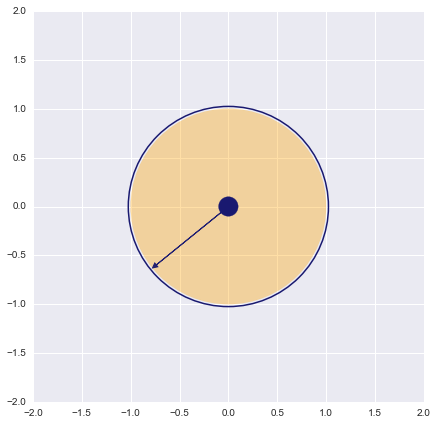

----------------------------------------------------------------
HMGB1P5


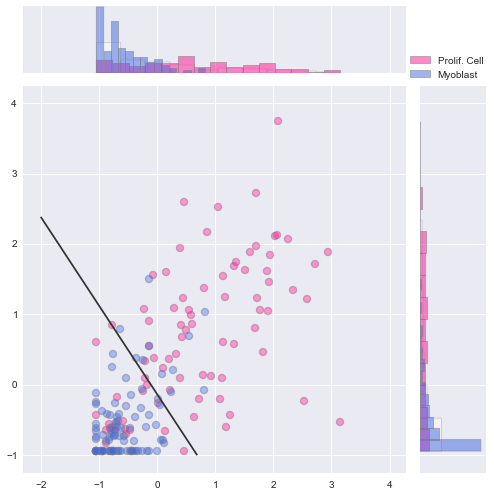

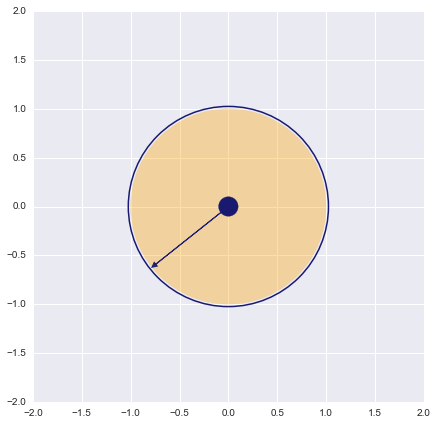

----------------------------------------------------------------
MT1E


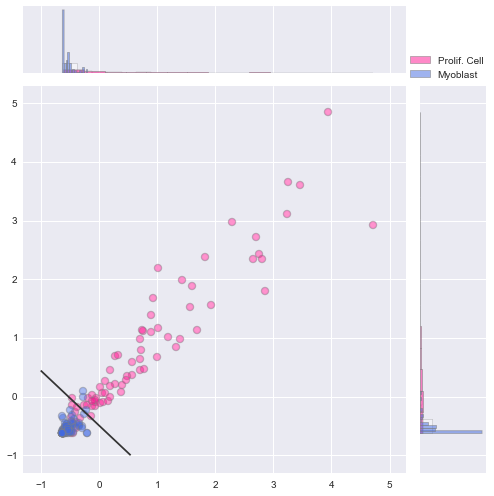

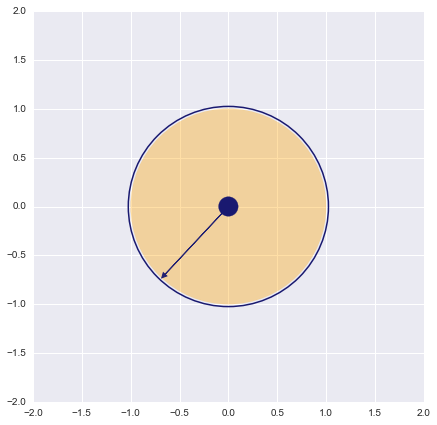

----------------------------------------------------------------
TXN


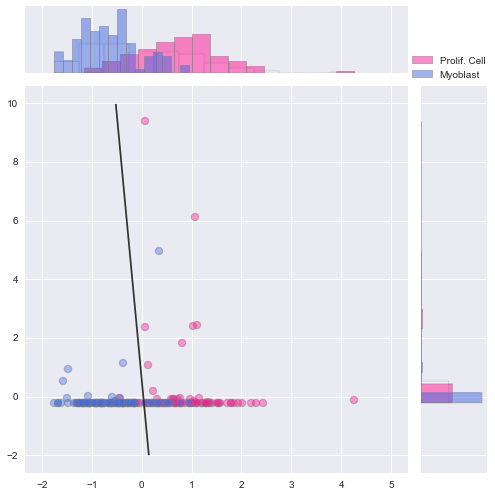

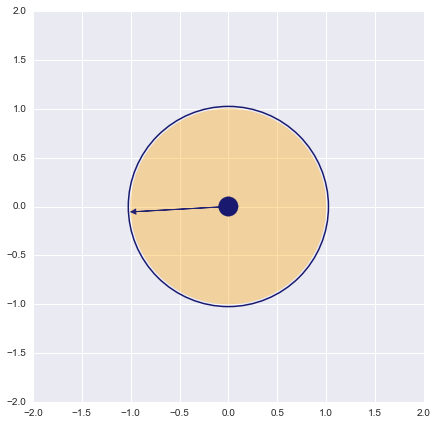

----------------------------------------------------------------
FBXO32


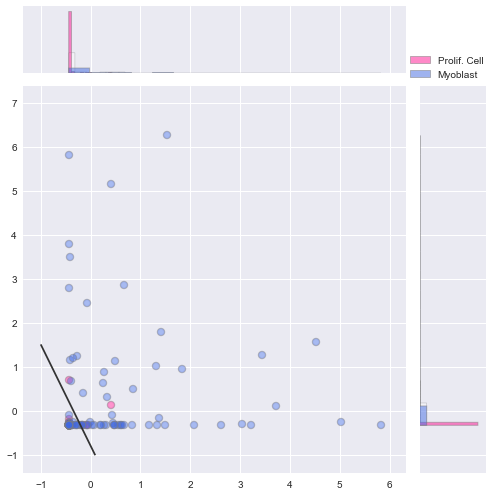

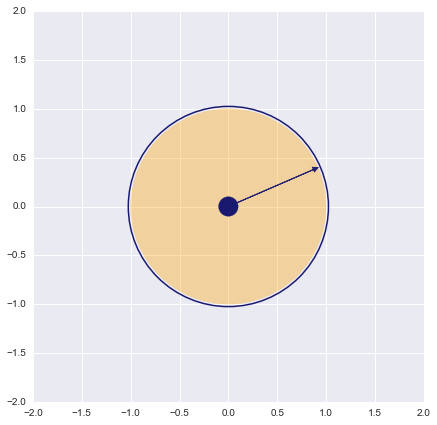

----------------------------------------------------------------
MT1G


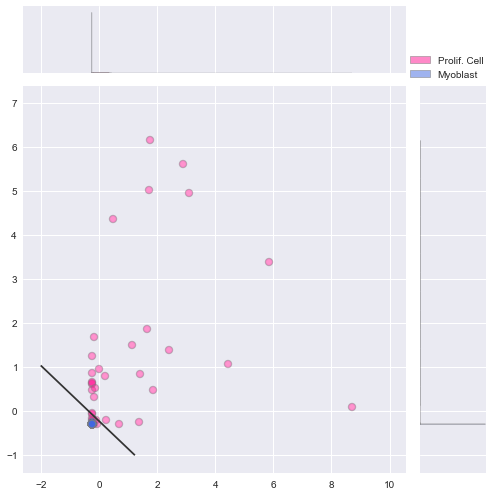

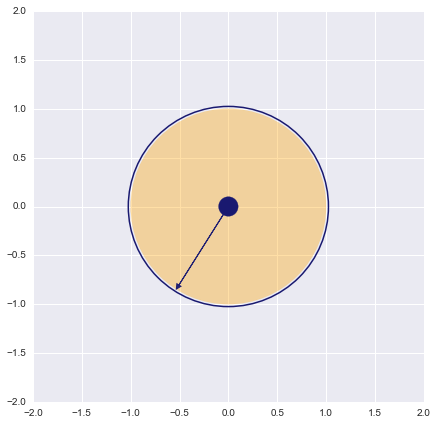

----------------------------------------------------------------
SYNPO2


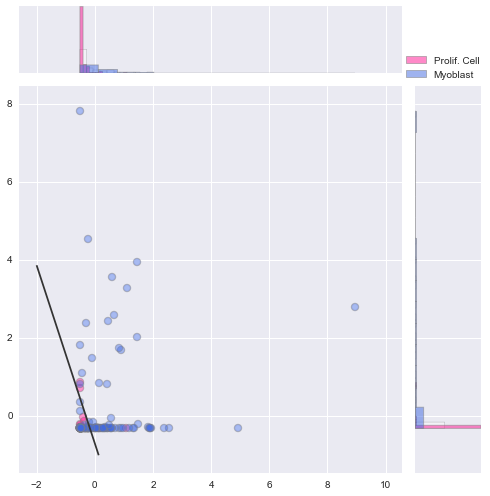

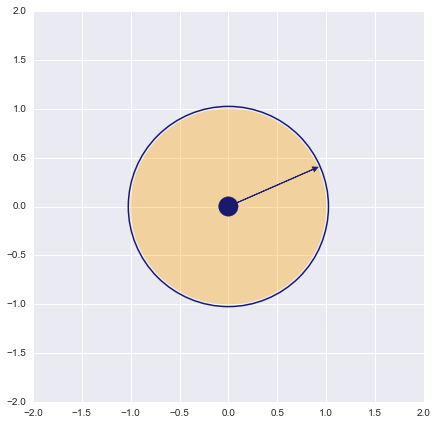

----------------------------------------------------------------
SMC4


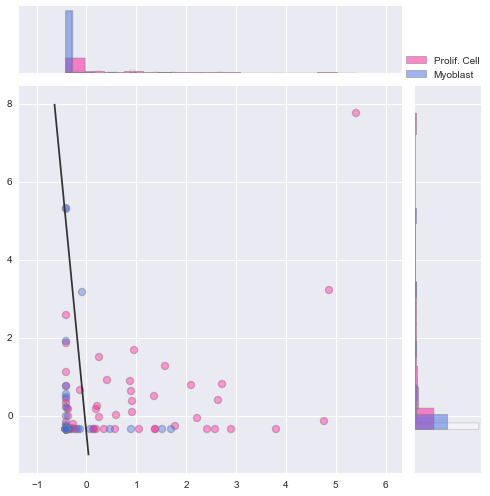

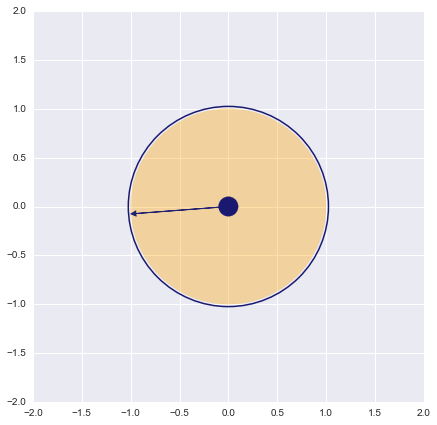

----------------------------------------------------------------
PCLAF


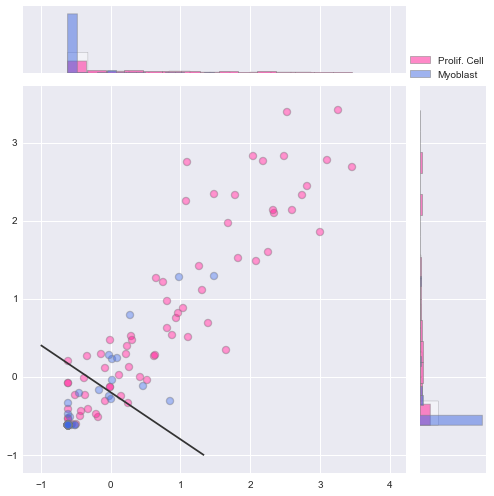

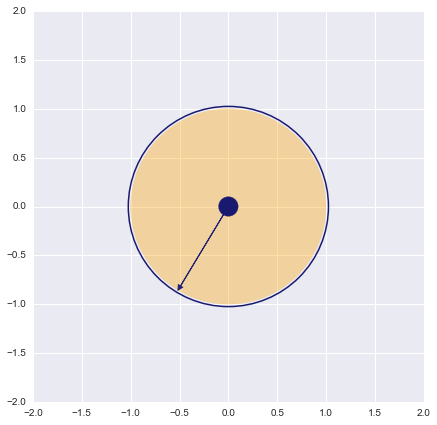

----------------------------------------------------------------
NCAPG


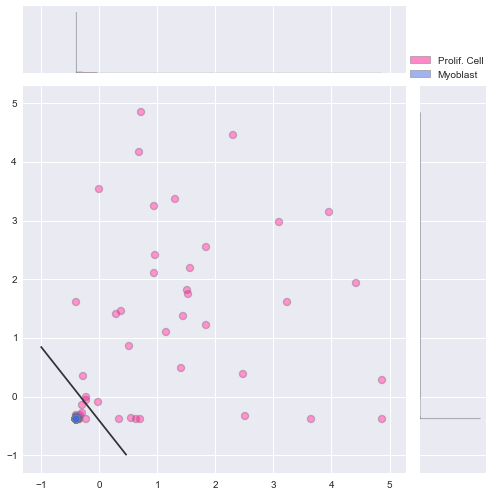

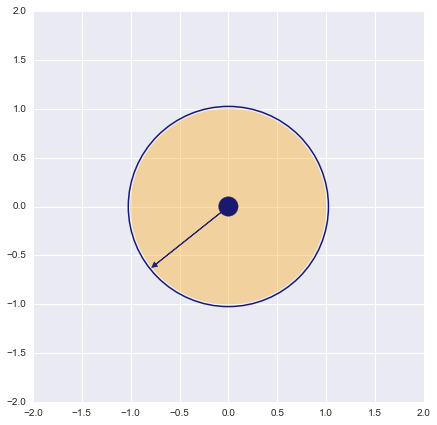

----------------------------------------------------------------
CDC20


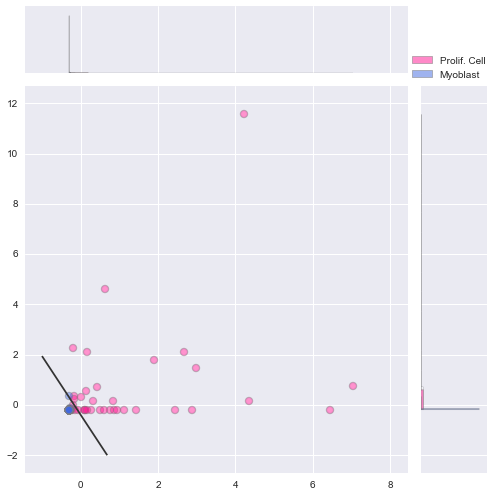

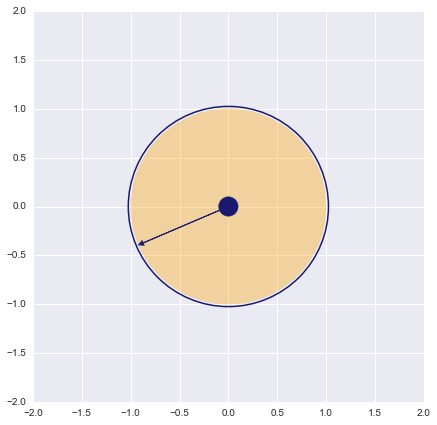

----------------------------------------------------------------
CDKN1C


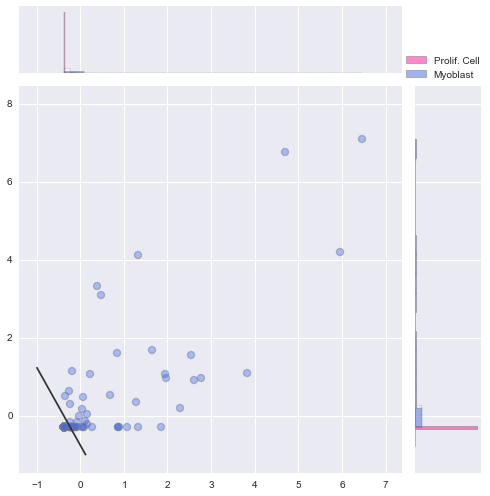

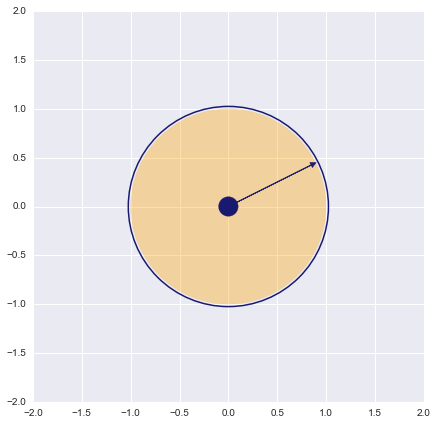

----------------------------------------------------------------
RPS24


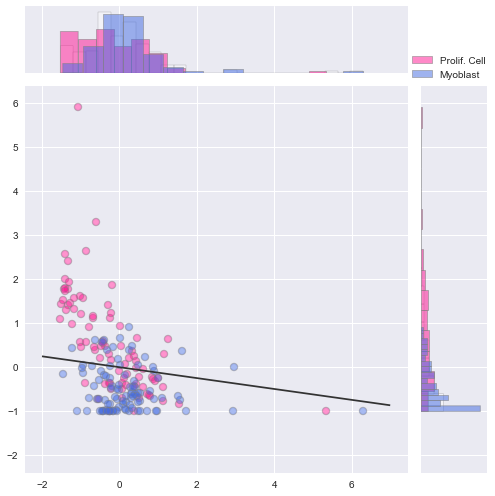

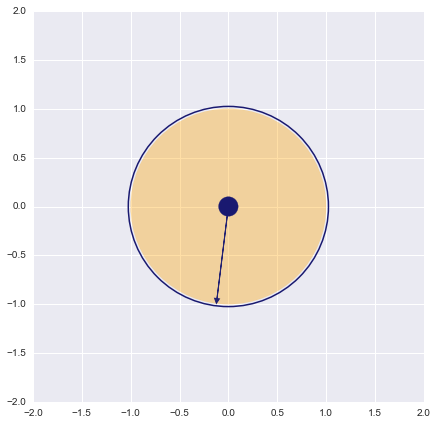

----------------------------------------------------------------
ALDOA


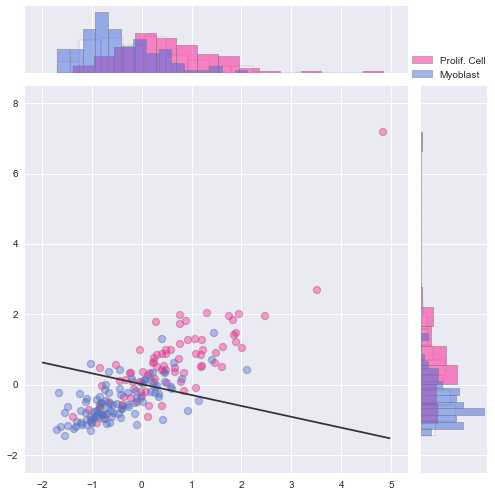

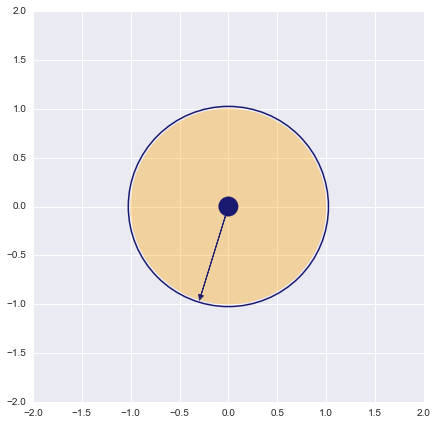

----------------------------------------------------------------
IQGAP3


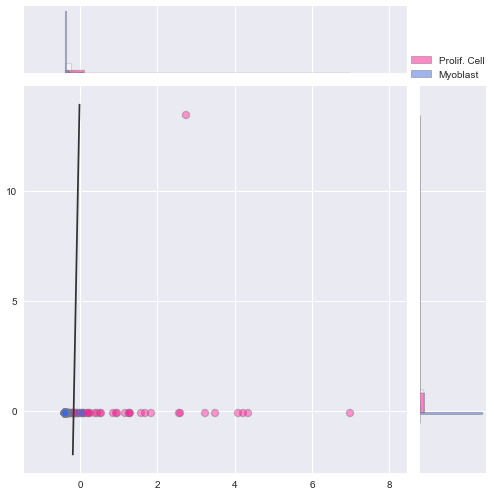

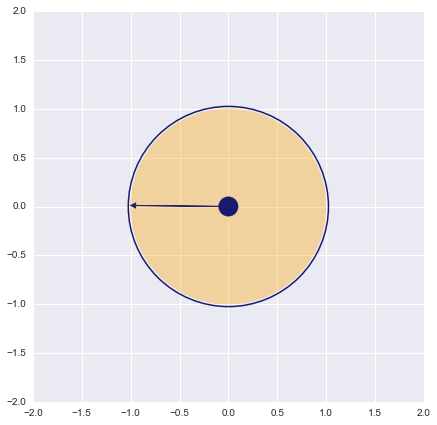

----------------------------------------------------------------
VIM


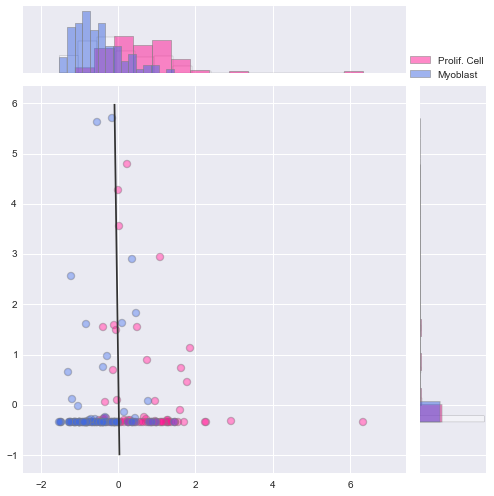

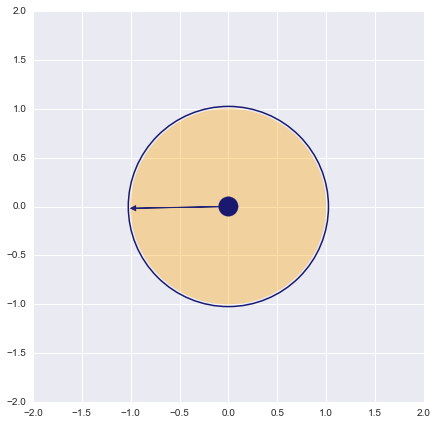

----------------------------------------------------------------
VSTM4


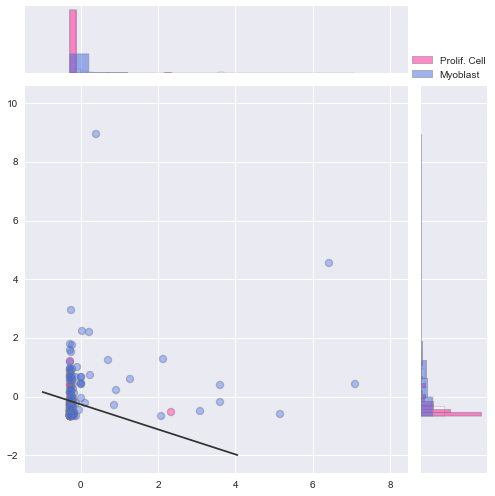

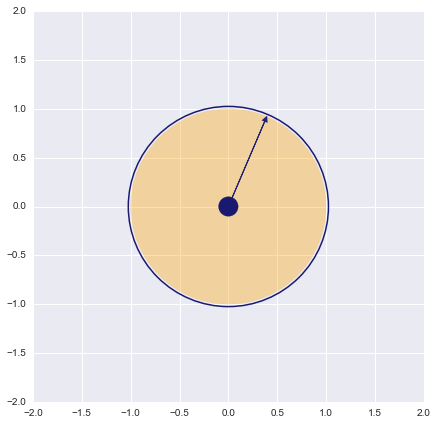

----------------------------------------------------------------
SNRPD1


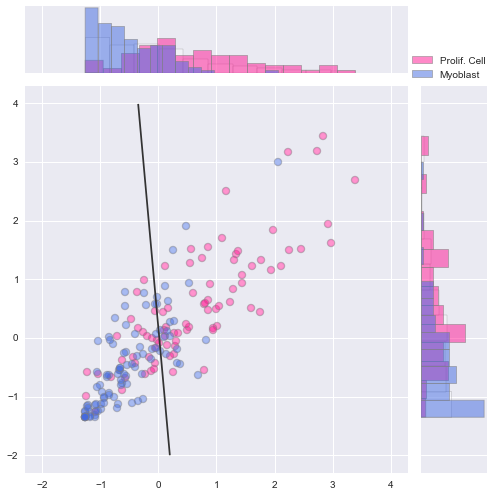

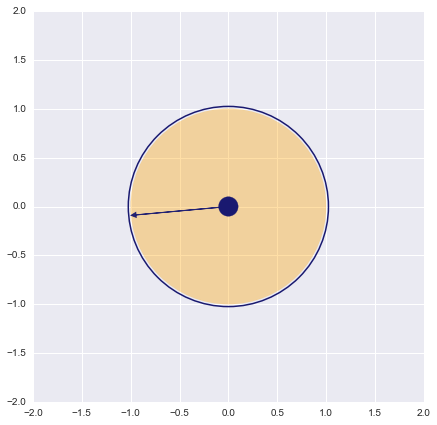

----------------------------------------------------------------
CD59


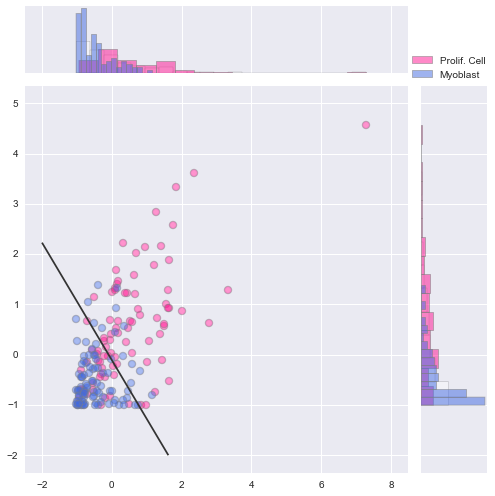

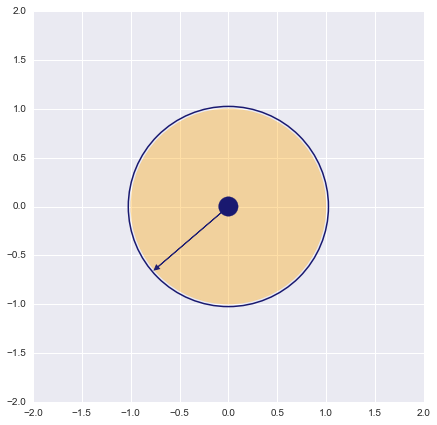

----------------------------------------------------------------
CENPF


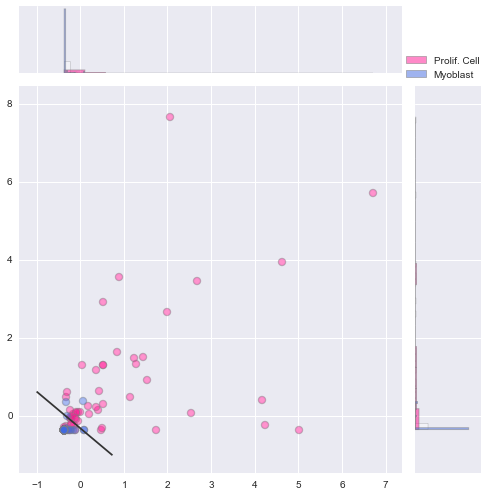

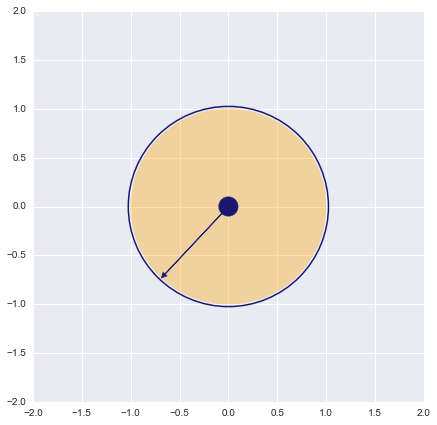

----------------------------------------------------------------
KLHL41


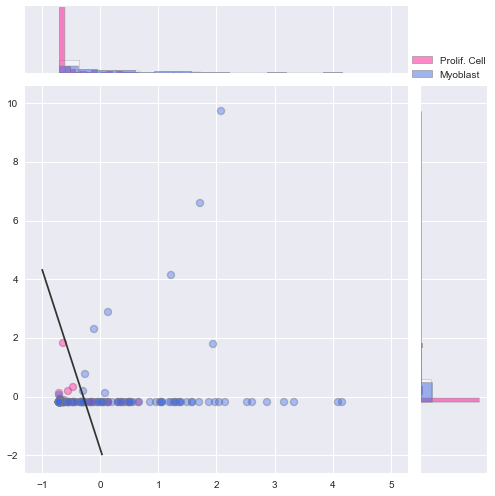

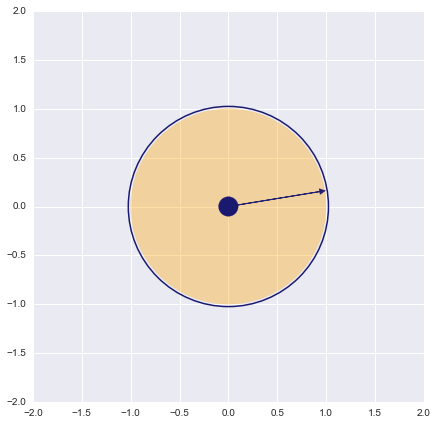

----------------------------------------------------------------
PBK


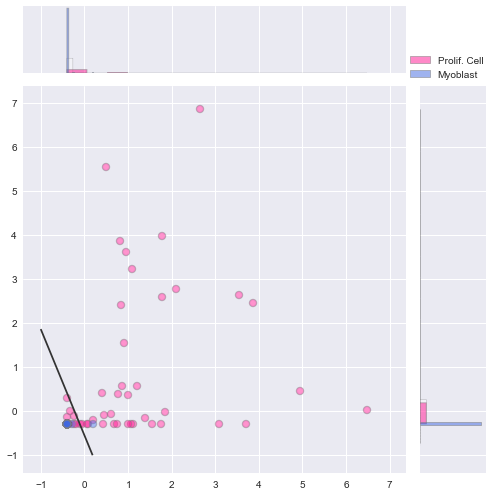

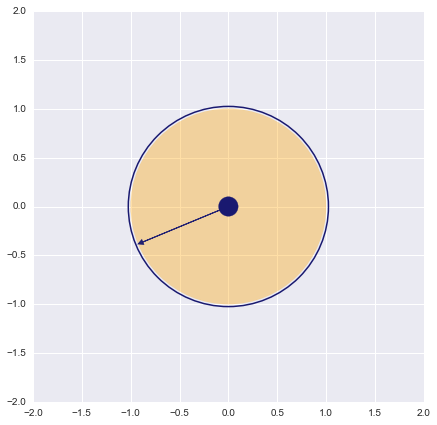

----------------------------------------------------------------
CLSPN


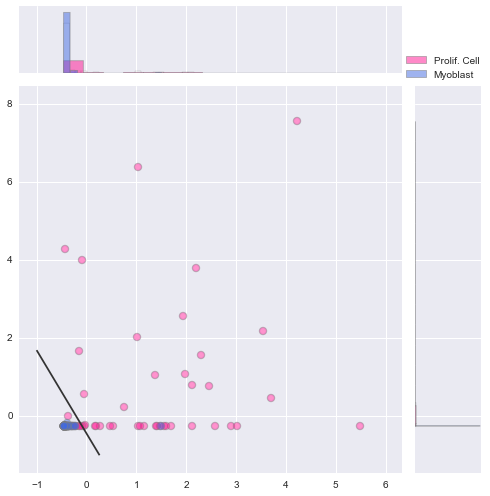

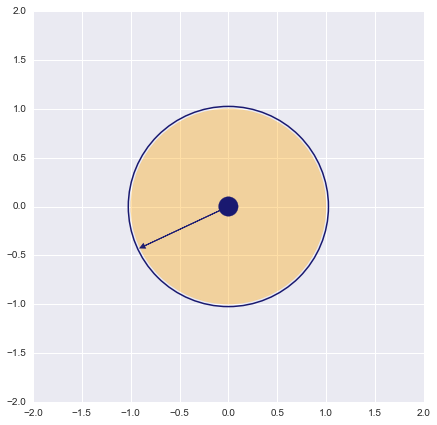

----------------------------------------------------------------
TUBA1B


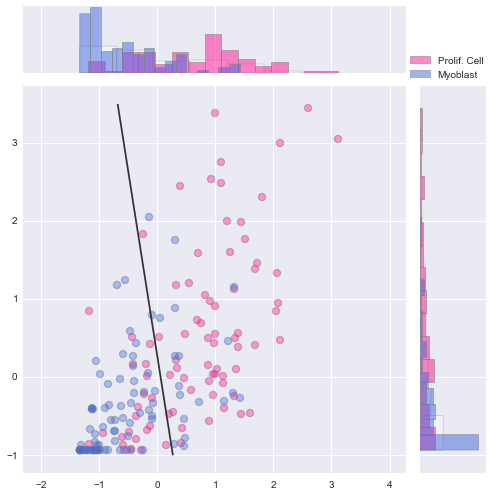

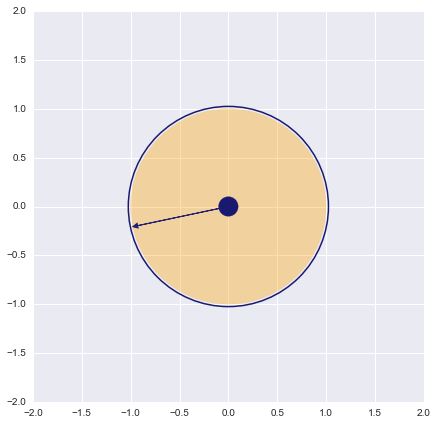

----------------------------------------------------------------
MIF


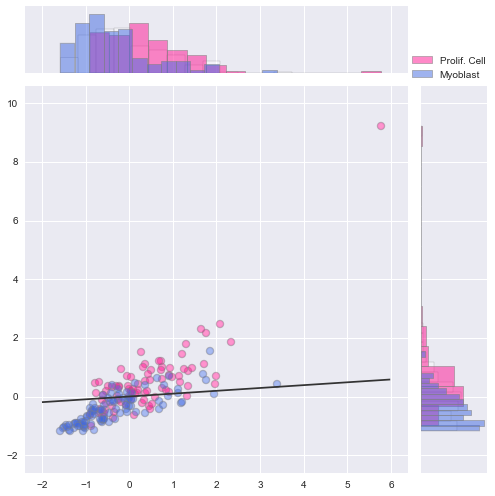

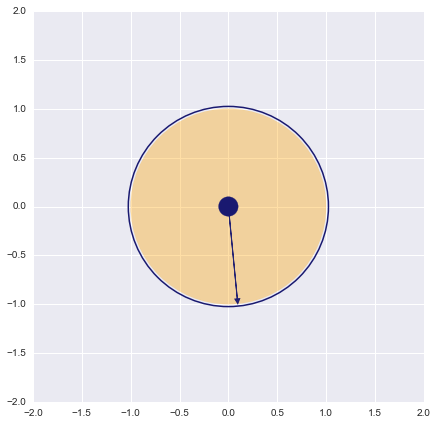

----------------------------------------------------------------
MIF


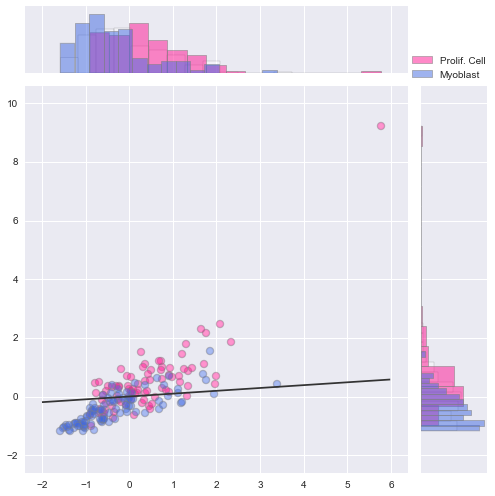

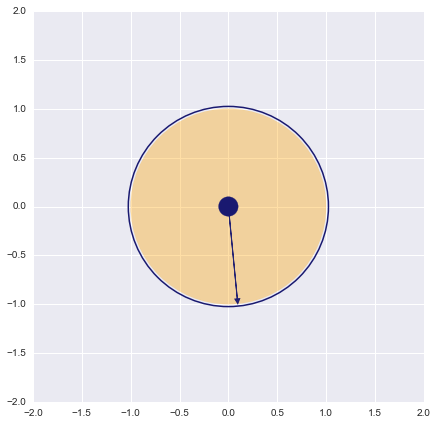

----------------------------------------------------------------
KLHL30
ONE


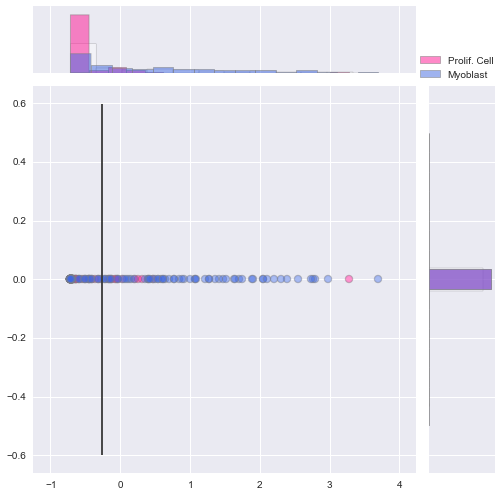

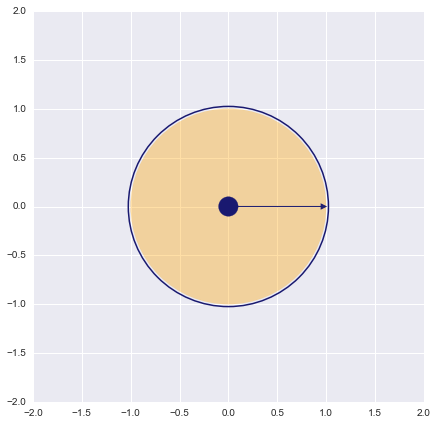

----------------------------------------------------------------
TPI1


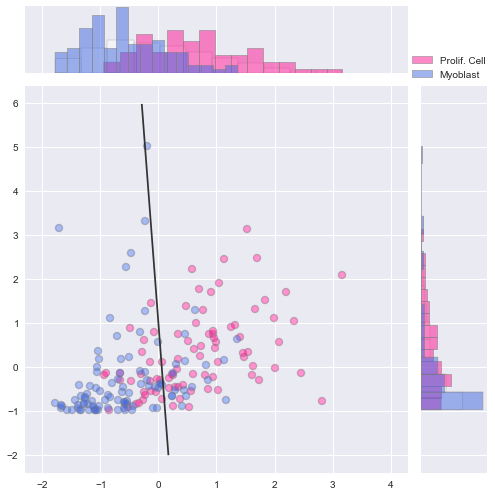

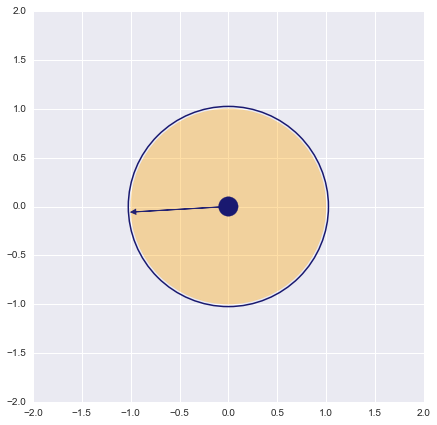

----------------------------------------------------------------
FNDC5


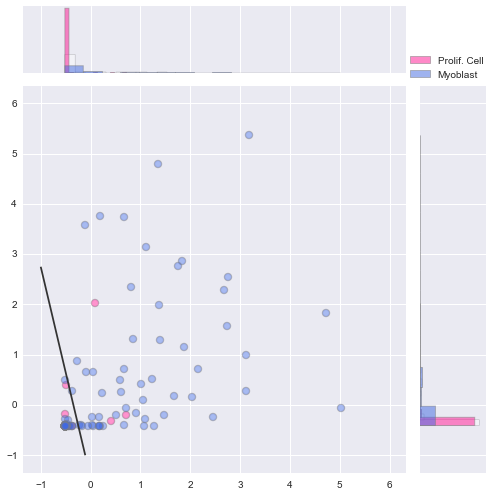

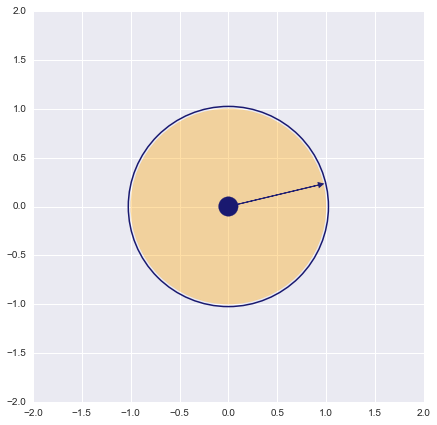

----------------------------------------------------------------
MT1X


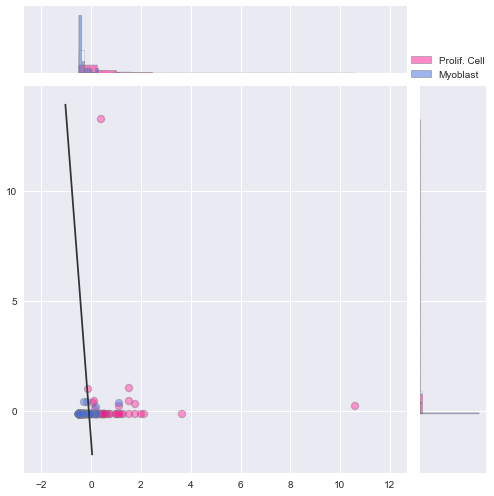

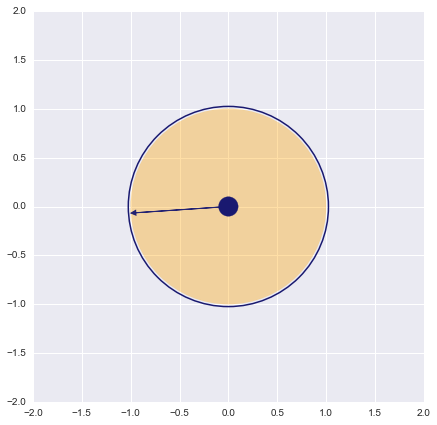

----------------------------------------------------------------
POLR2L


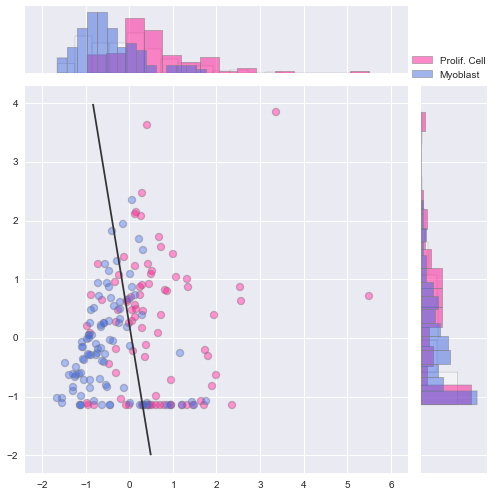

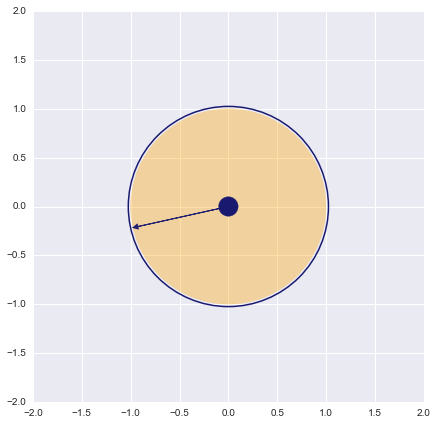

----------------------------------------------------------------
CDKN1C


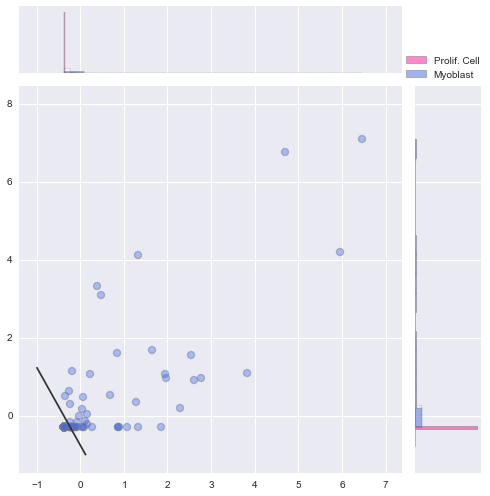

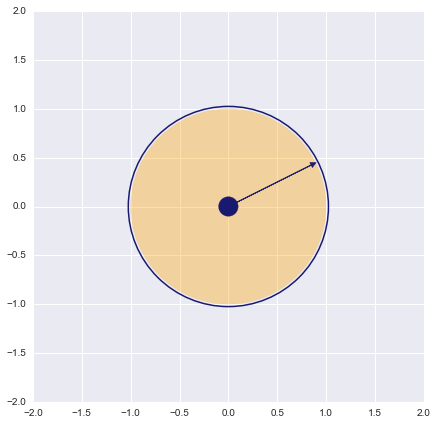

----------------------------------------------------------------
SH3BGRL3


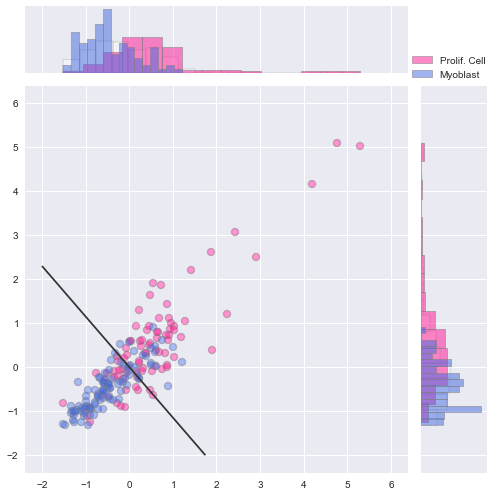

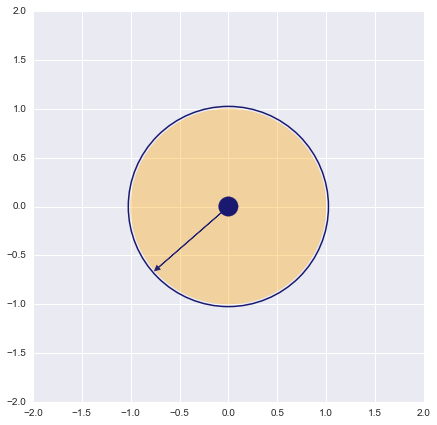

----------------------------------------------------------------
FABP5


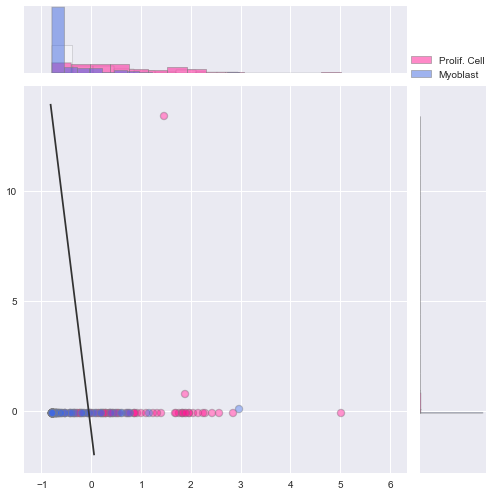

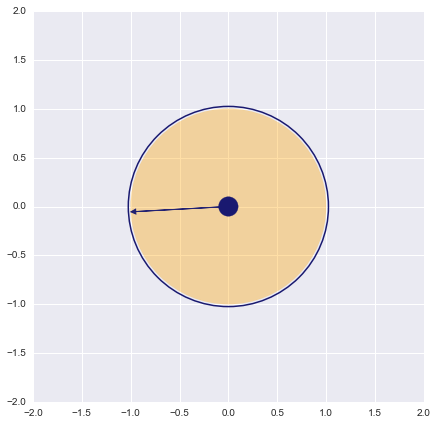

----------------------------------------------------------------
SLC20A1


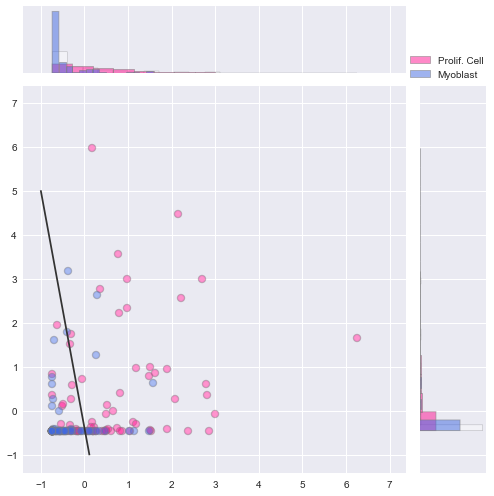

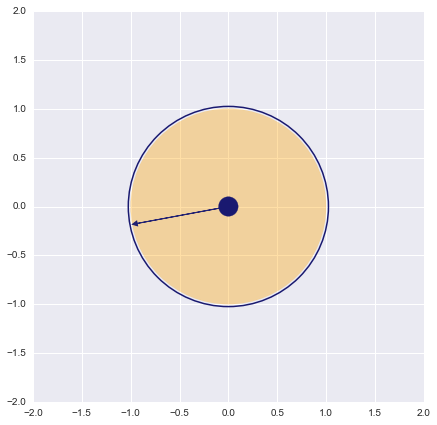

----------------------------------------------------------------
LGALS1


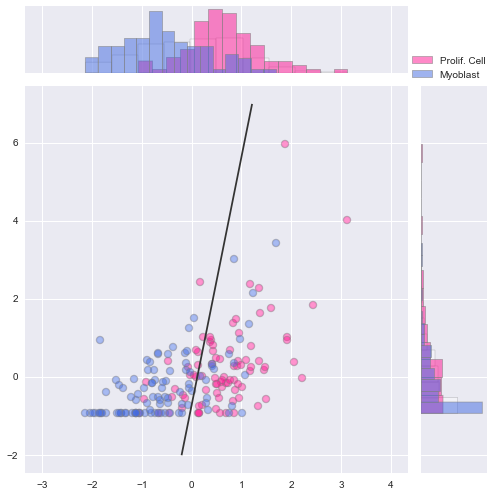

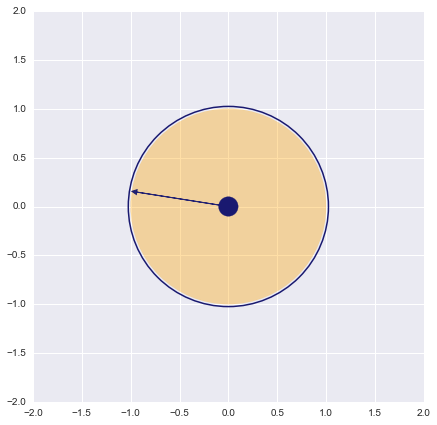

----------------------------------------------------------------
CLIC1


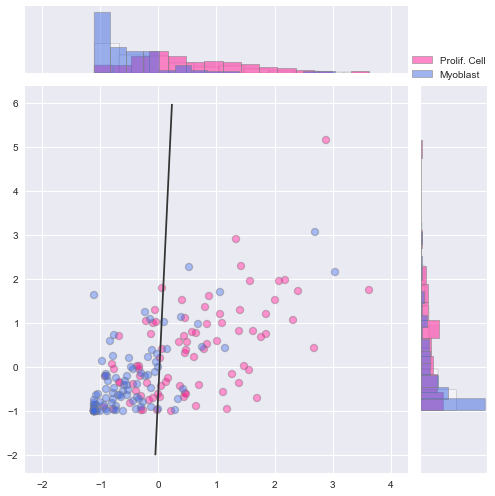

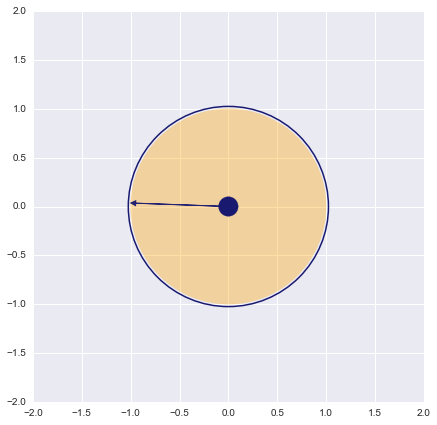

----------------------------------------------------------------
HIST1H3C
ONE


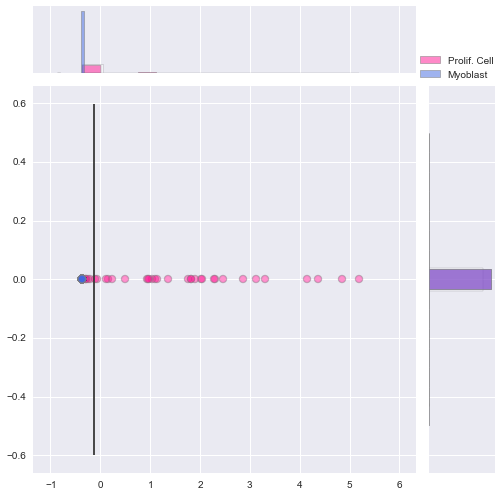

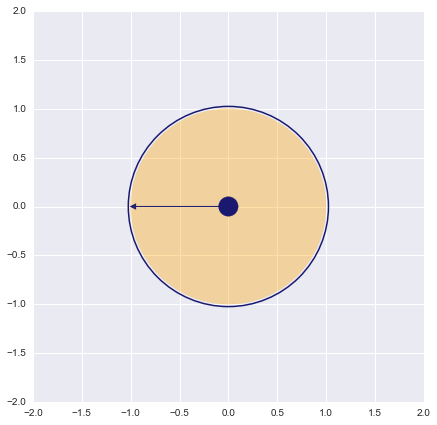

----------------------------------------------------------------
ANXA2P2
ONE


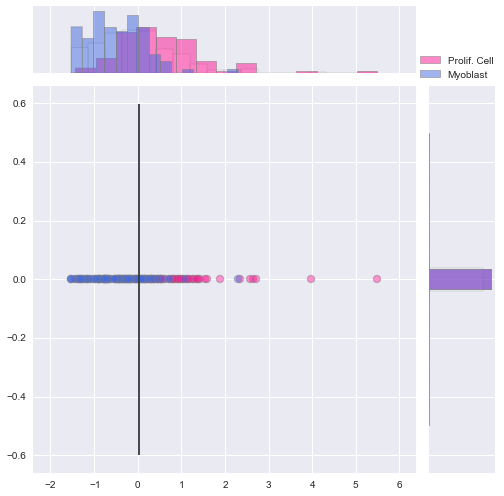

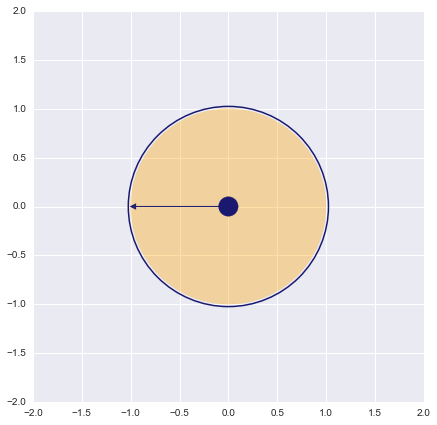

----------------------------------------------------------------
PLP2


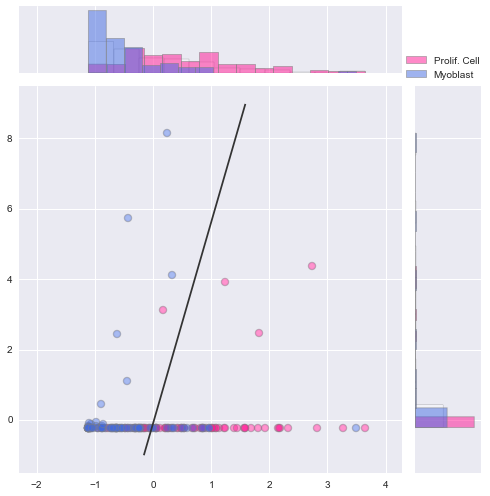

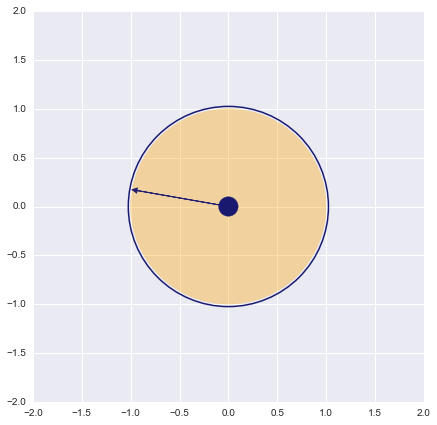

----------------------------------------------------------------
S100A11


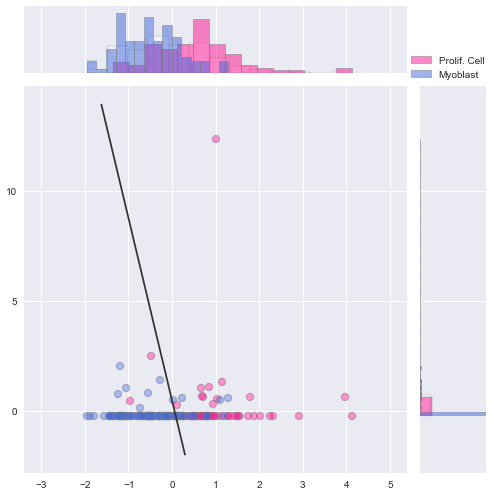

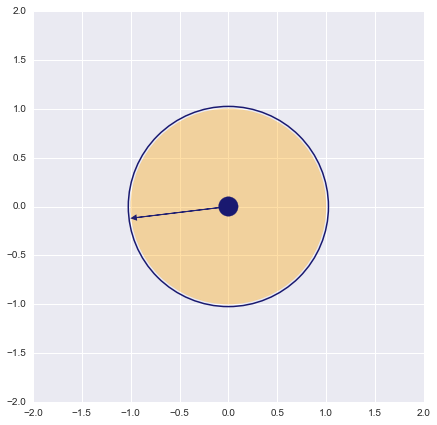

----------------------------------------------------------------
SLC25A5


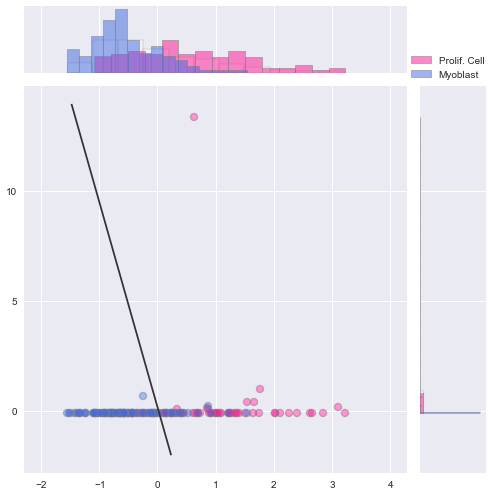

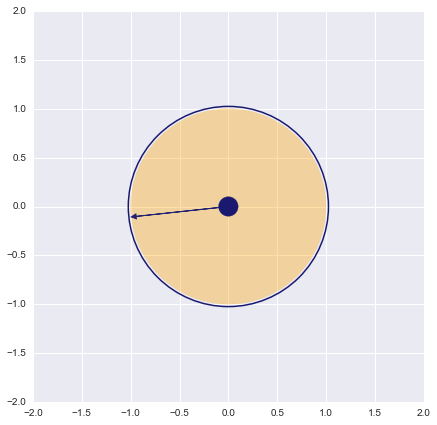

----------------------------------------------------------------
CENPW


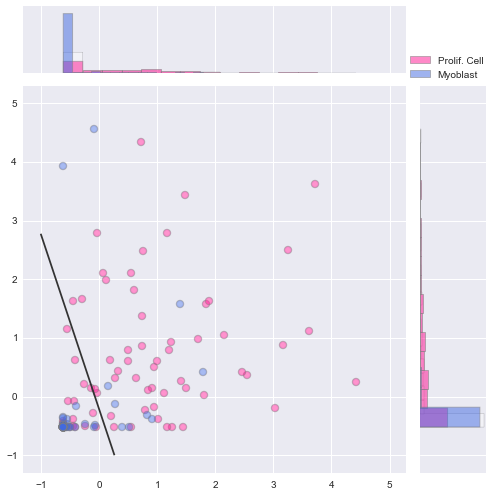

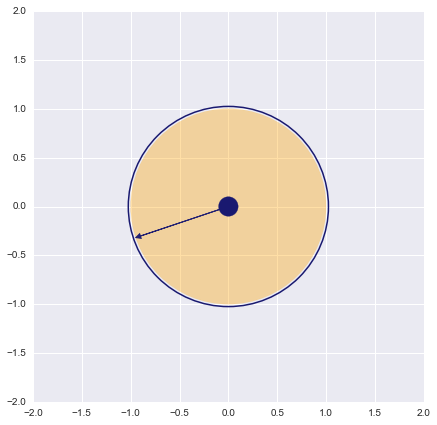

----------------------------------------------------------------
SKA3


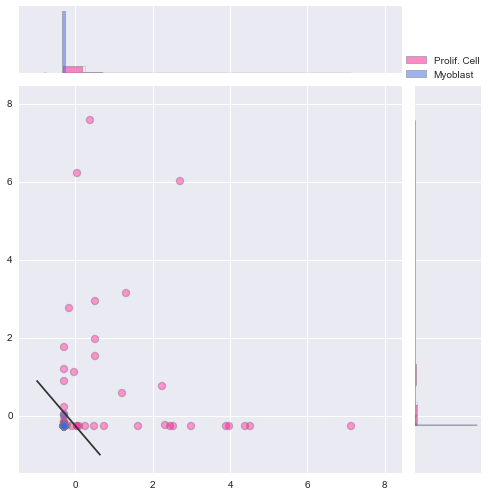

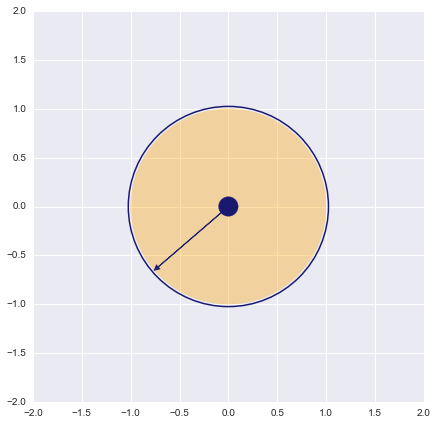

----------------------------------------------------------------
CKAP2L


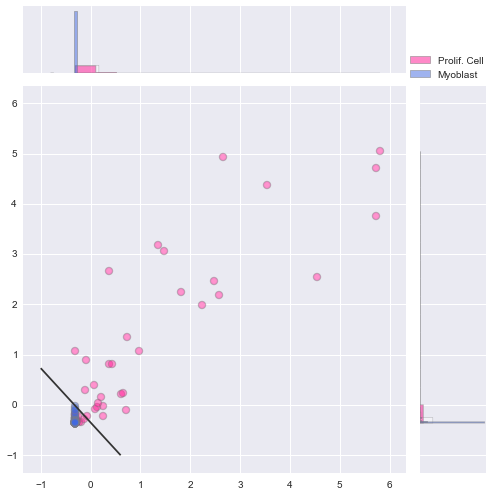

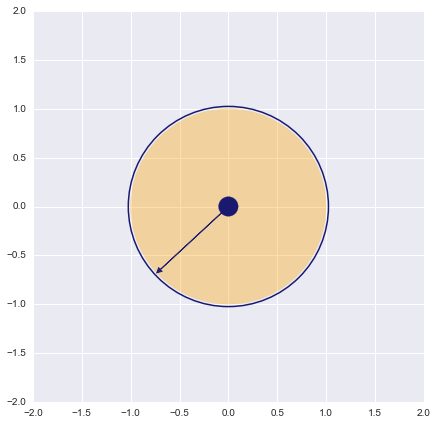

----------------------------------------------------------------
RAN


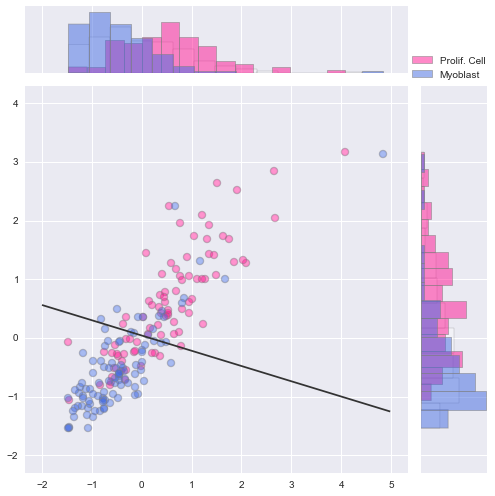

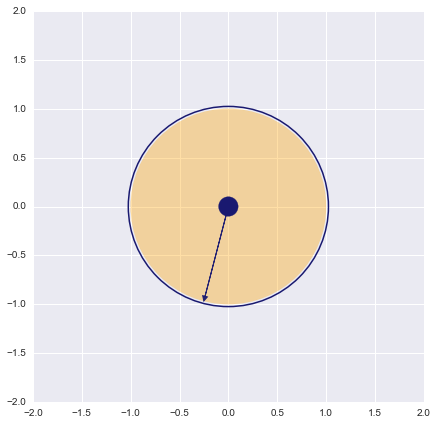

----------------------------------------------------------------
CKS2
ONE


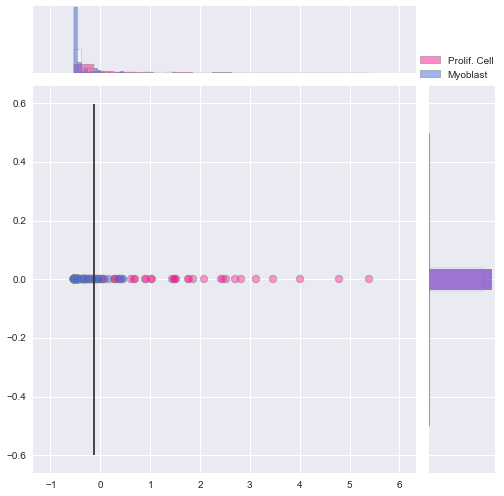

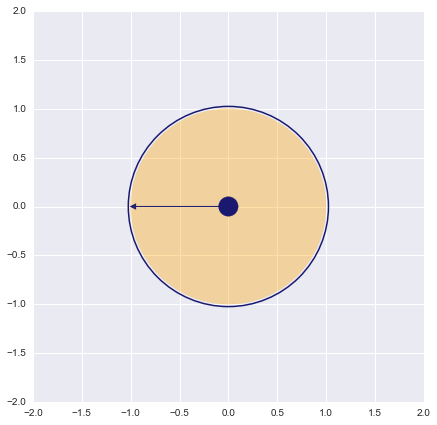

----------------------------------------------------------------
PTPRS


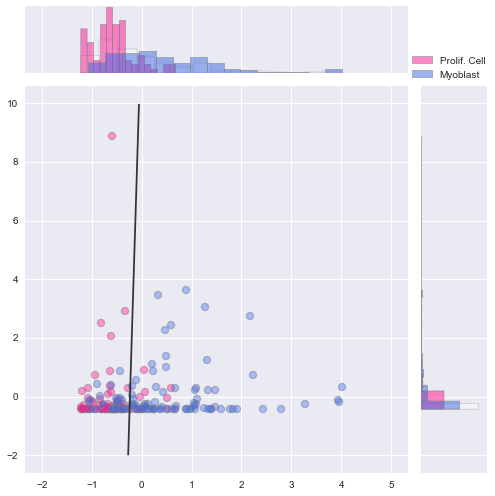

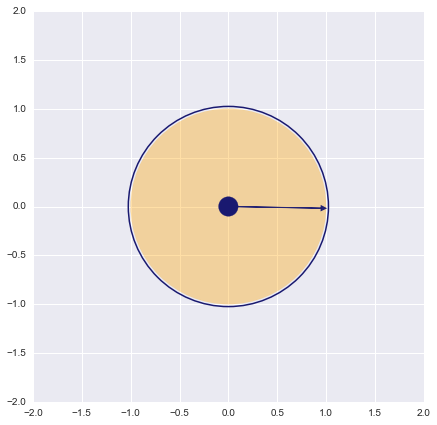

----------------------------------------------------------------
ZNF556


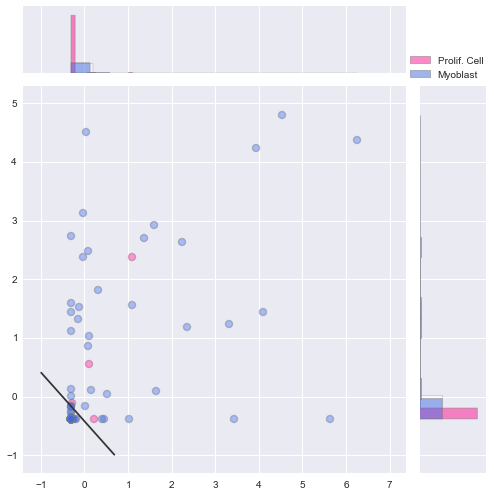

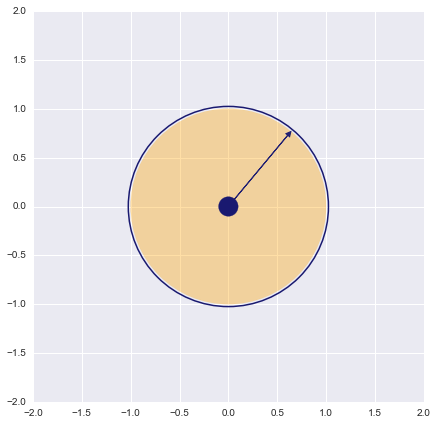

----------------------------------------------------------------
ASPM


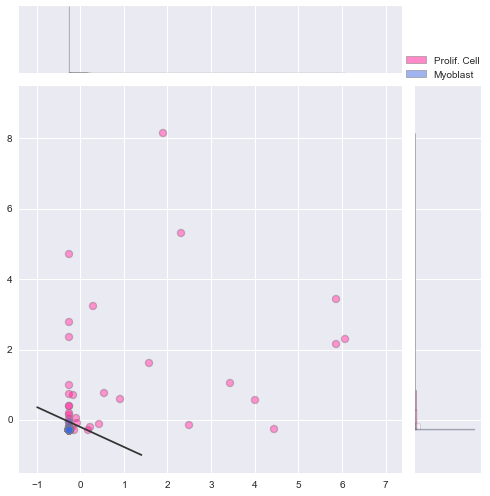

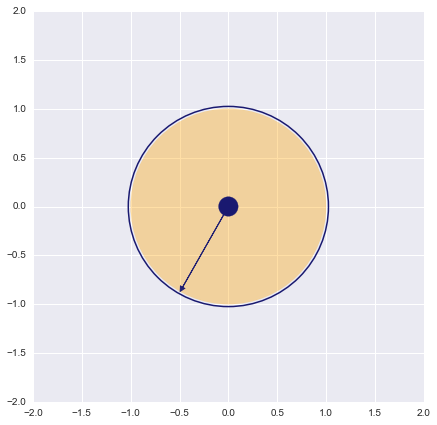

----------------------------------------------------------------
CENPK


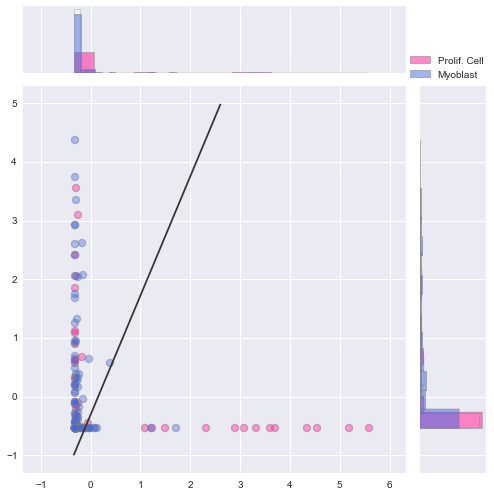

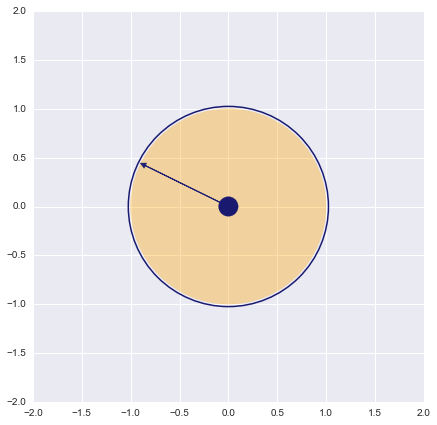

----------------------------------------------------------------
ACTC1


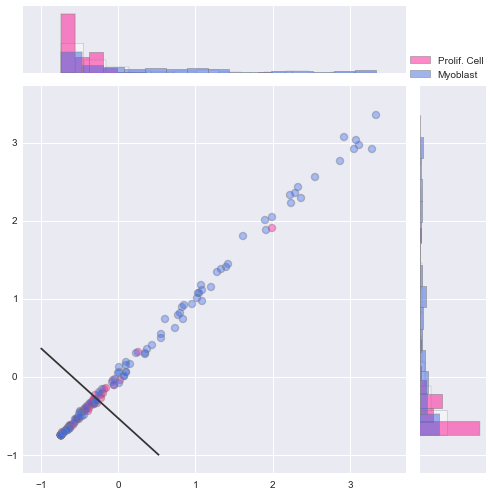

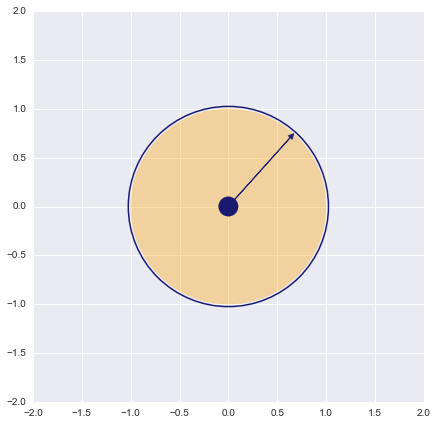

----------------------------------------------------------------
SHCBP1


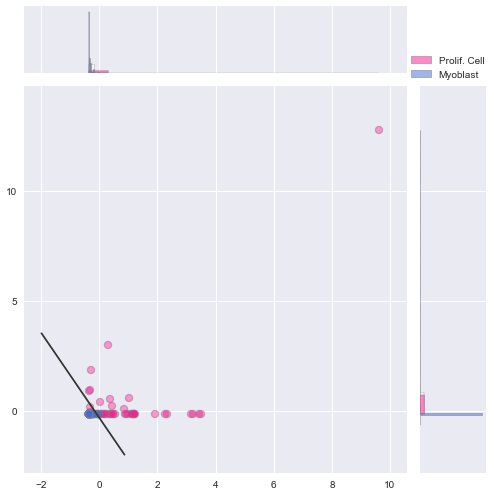

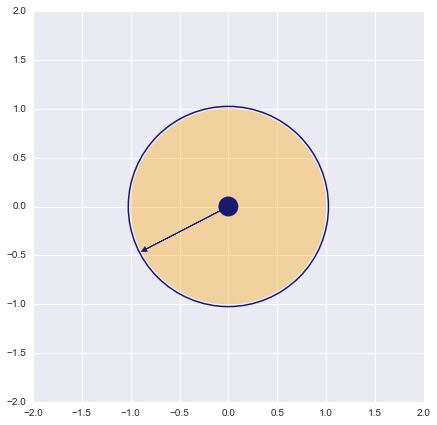

----------------------------------------------------------------
SMS


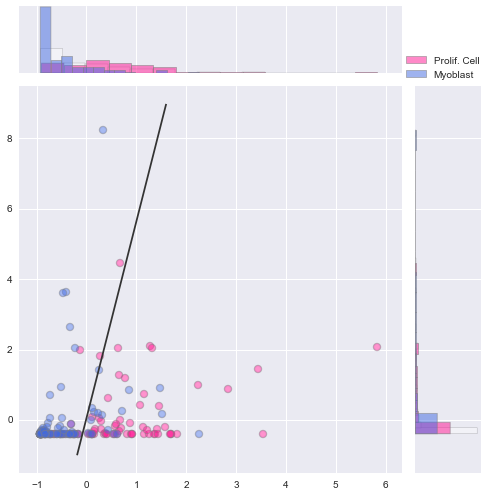

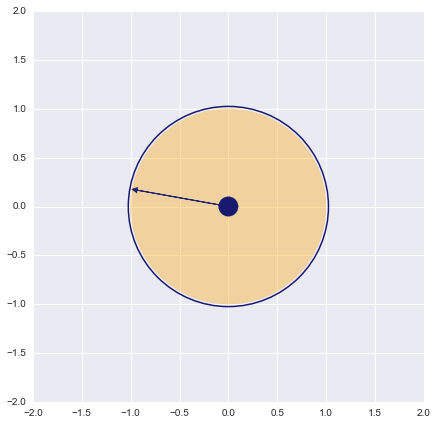

----------------------------------------------------------------
MACF1


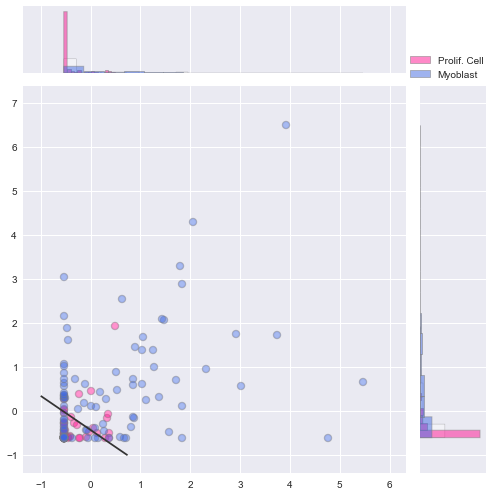

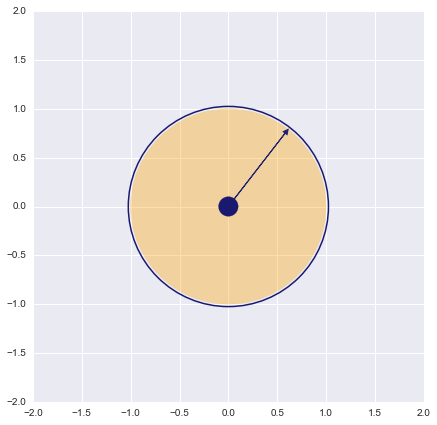

----------------------------------------------------------------
PRC1


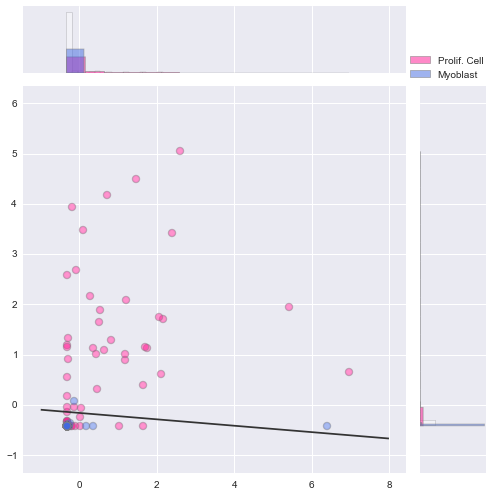

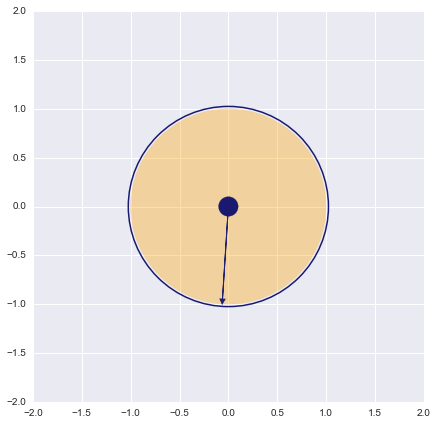

----------------------------------------------------------------
CLIC1


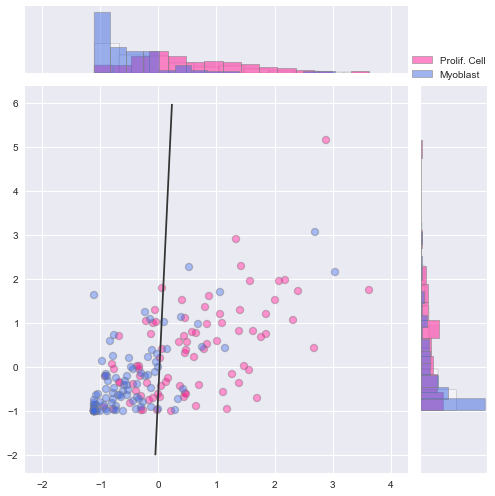

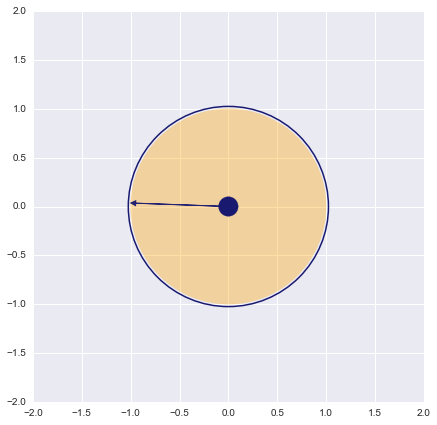

----------------------------------------------------------------
CLIC1


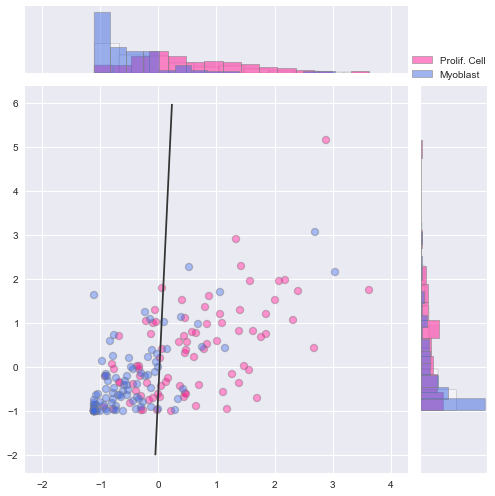

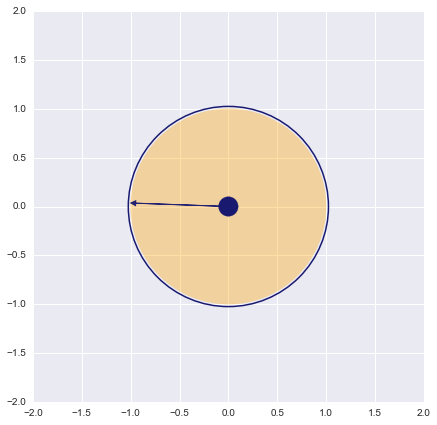

----------------------------------------------------------------
CLIC1


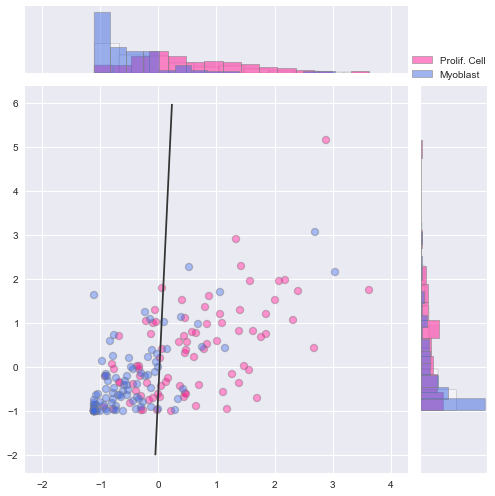

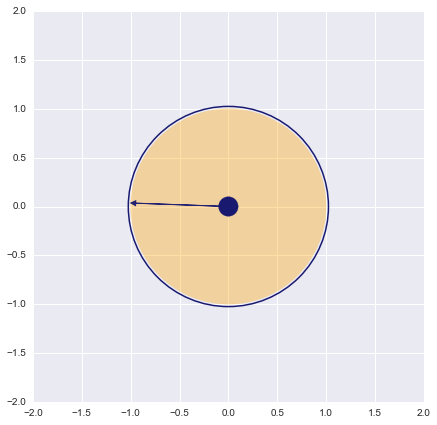

----------------------------------------------------------------
CLIC1


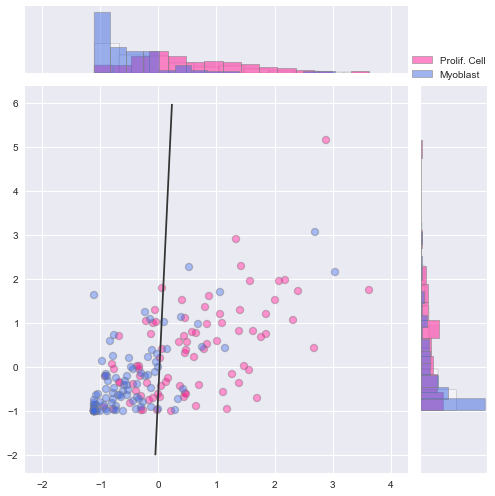

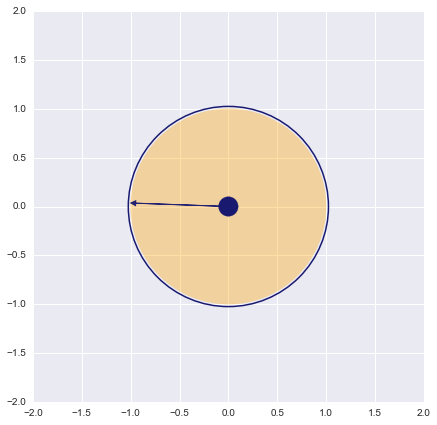

----------------------------------------------------------------
CLIC1


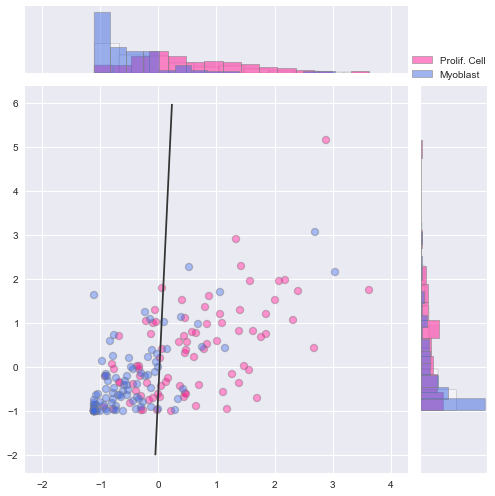

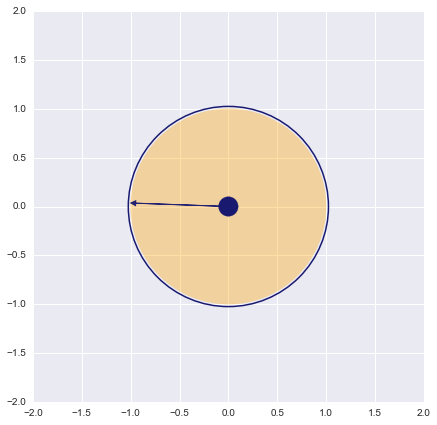

----------------------------------------------------------------
NUAK1


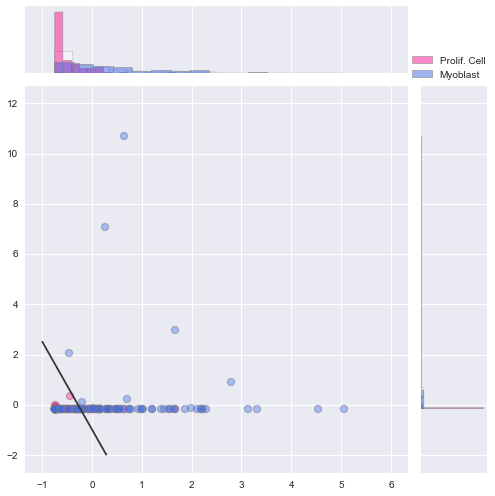

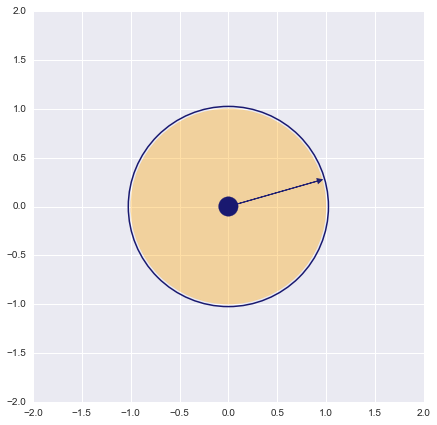

----------------------------------------------------------------
PCNA


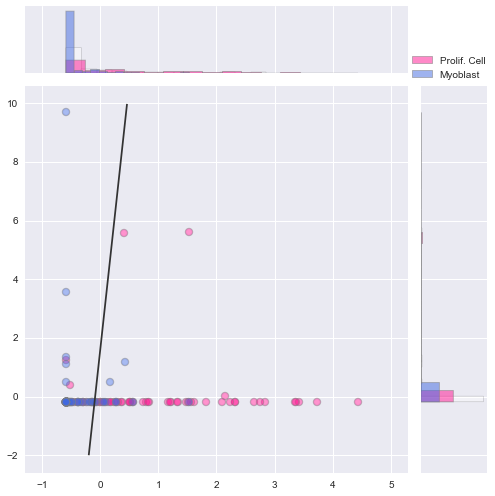

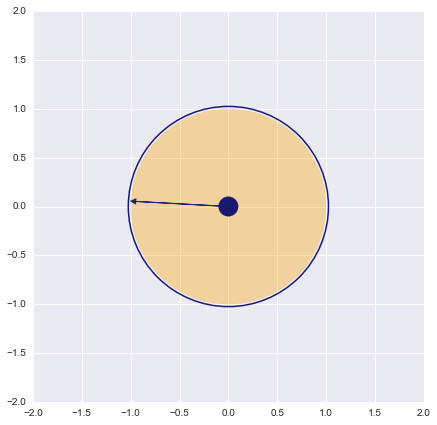

----------------------------------------------------------------
CDCA8


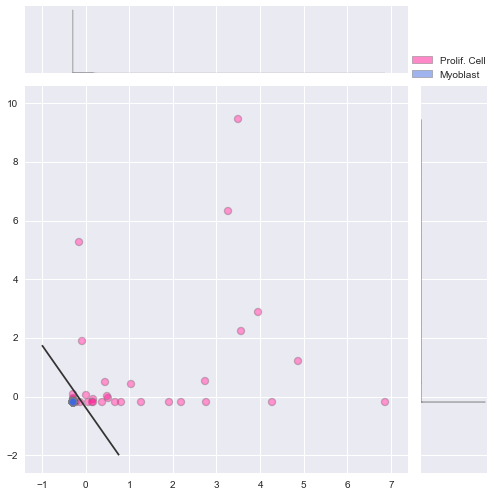

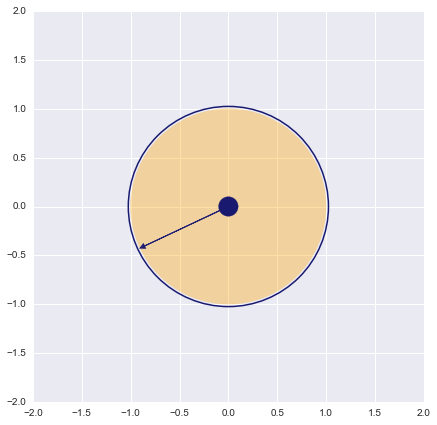

----------------------------------------------------------------
NCAM1


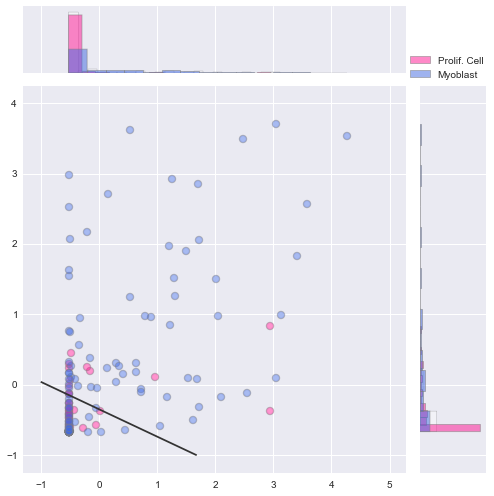

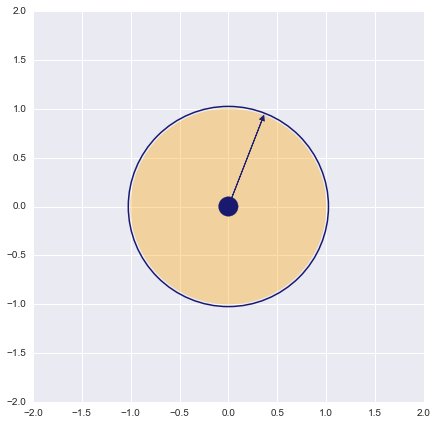

----------------------------------------------------------------
DNMT1


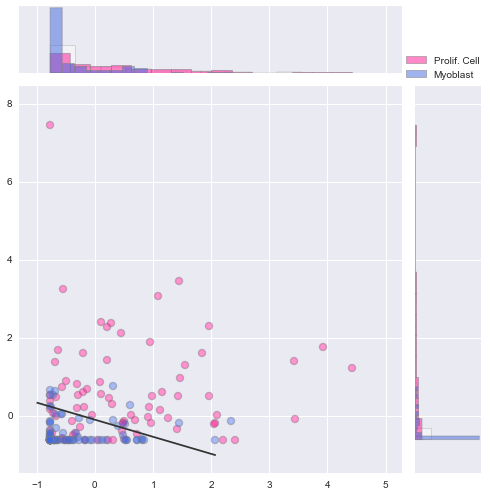

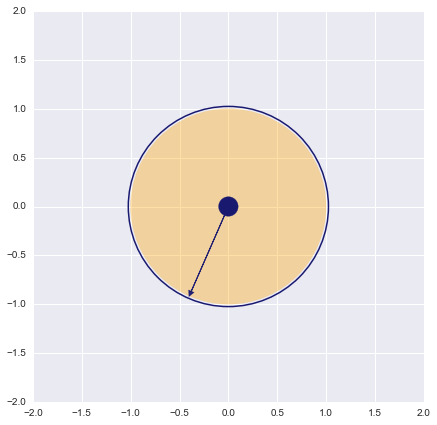

----------------------------------------------------------------
TK1


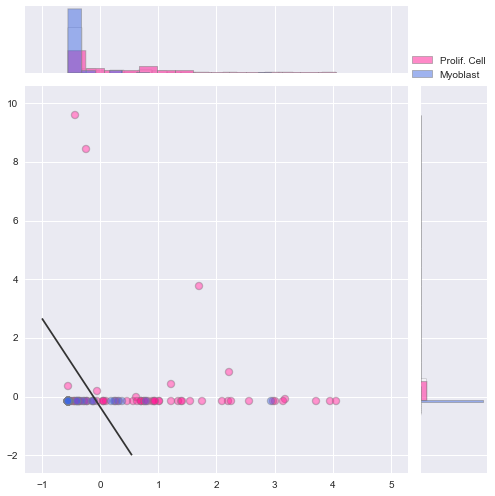

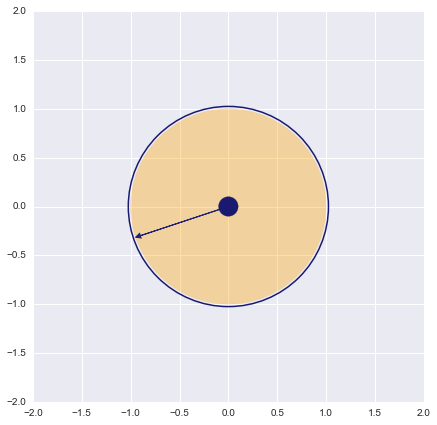

----------------------------------------------------------------
LRRFIP1


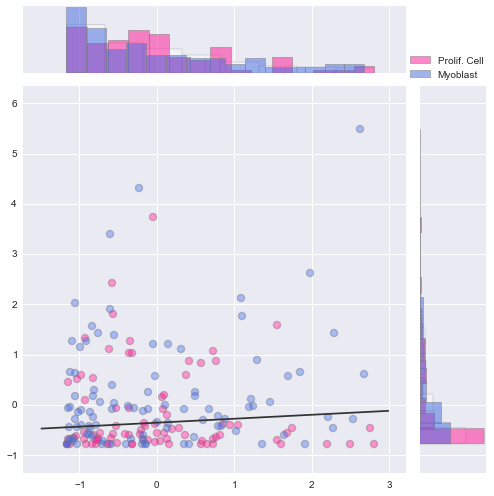

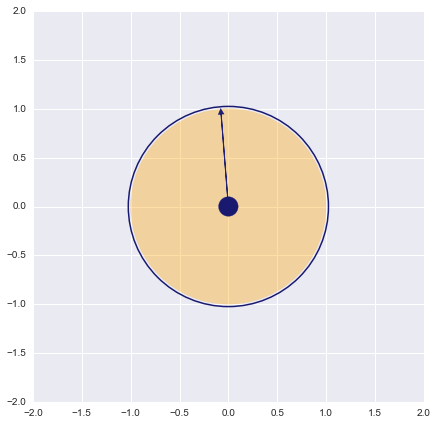

----------------------------------------------------------------
ATP5C1


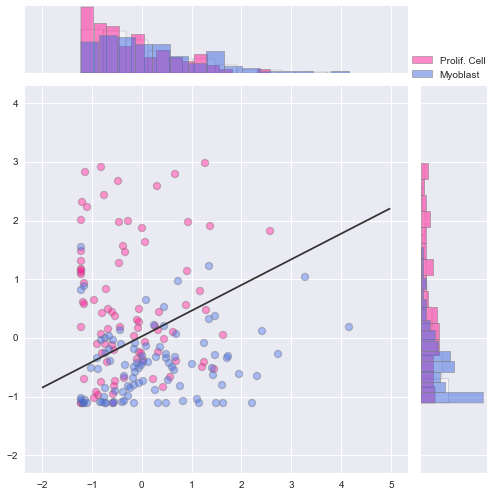

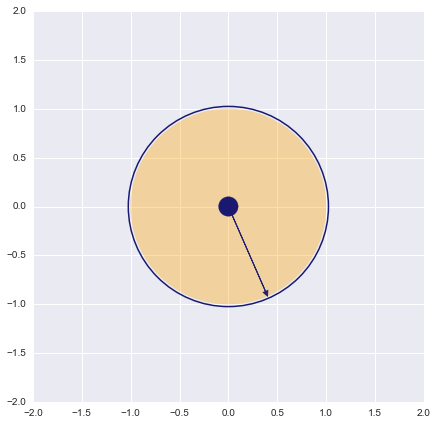

----------------------------------------------------------------
TXNDC17


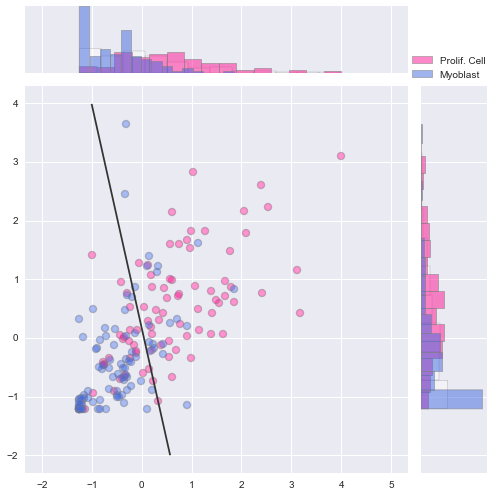

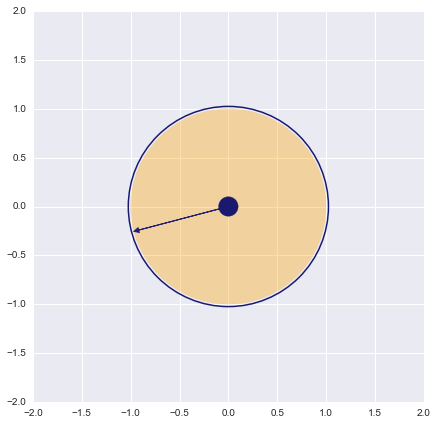

----------------------------------------------------------------
ACTA2


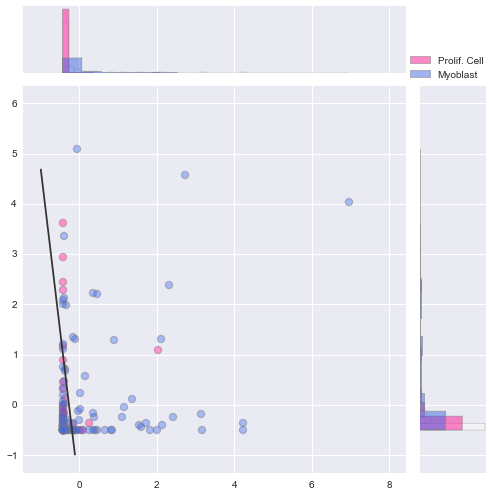

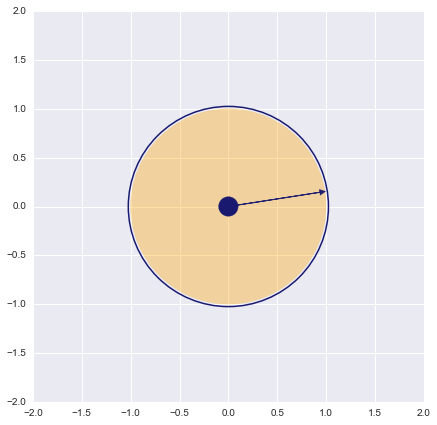

----------------------------------------------------------------
TNNT2


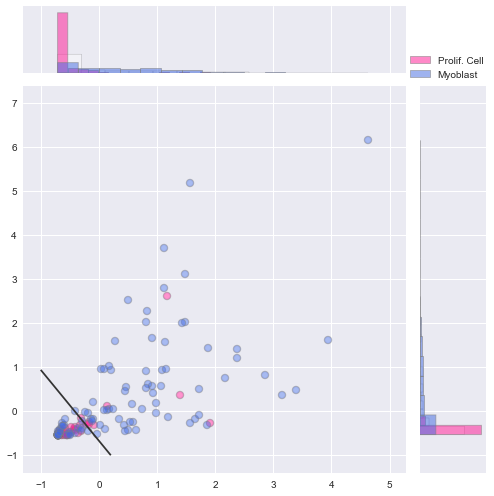

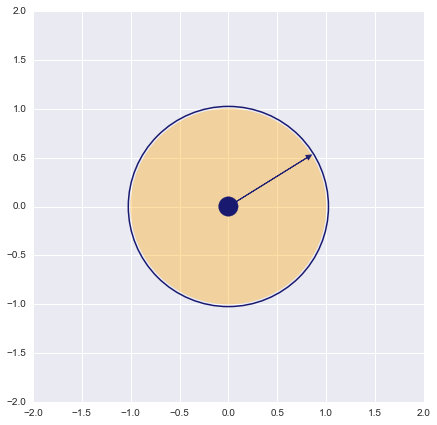

----------------------------------------------------------------
HSPB3
ONE


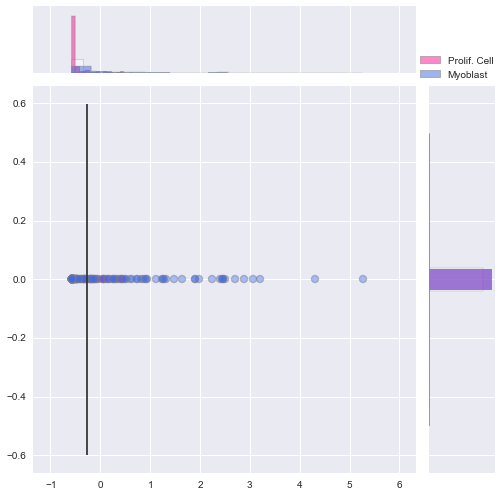

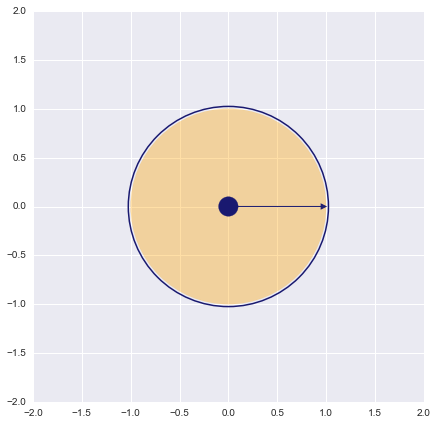

----------------------------------------------------------------
HMGN2


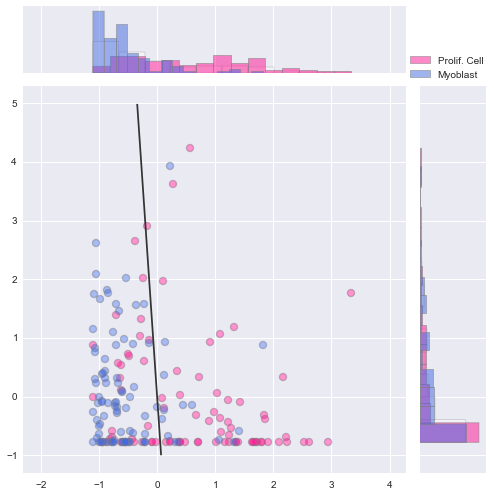

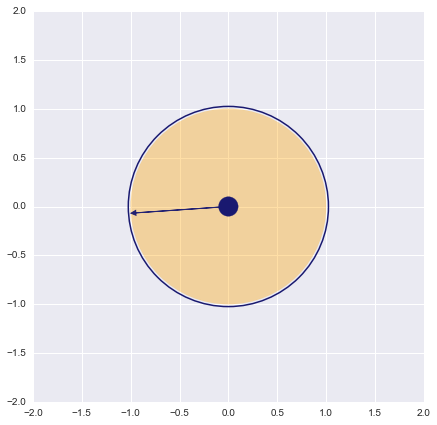

----------------------------------------------------------------
MYLPF


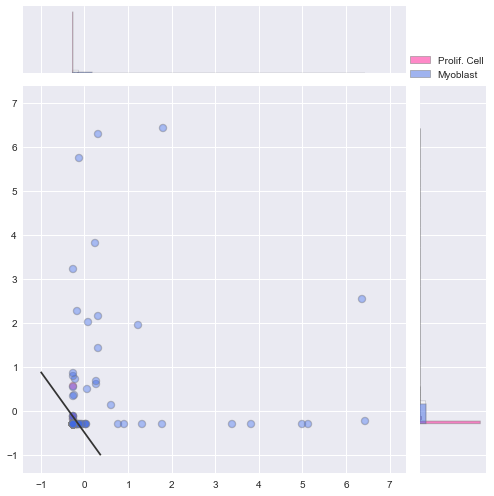

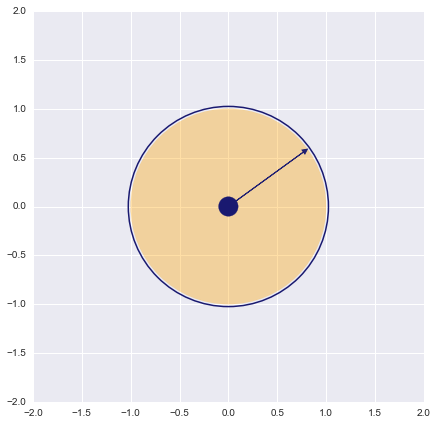

----------------------------------------------------------------
CCBE1


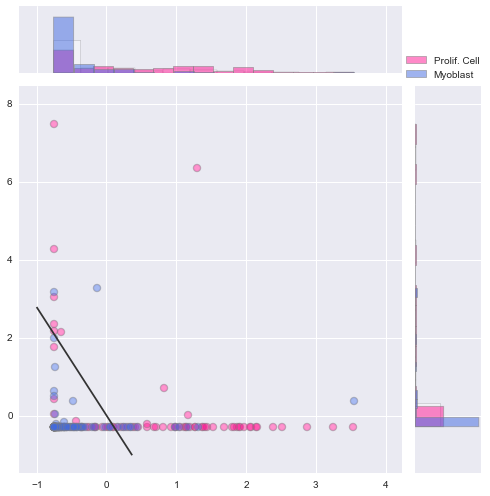

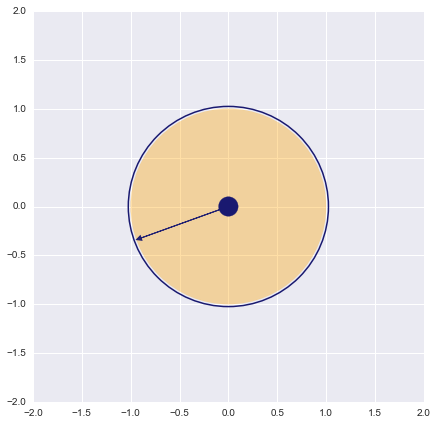

----------------------------------------------------------------
ANKRD10


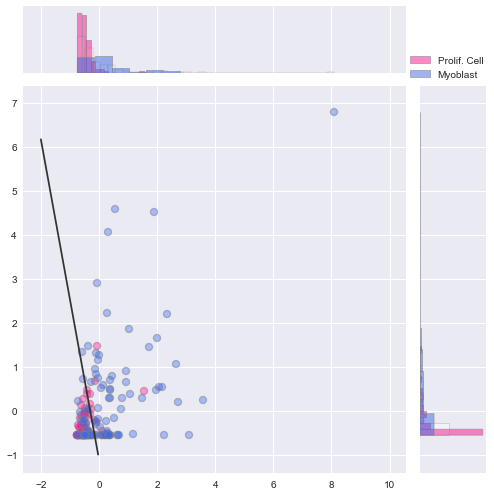

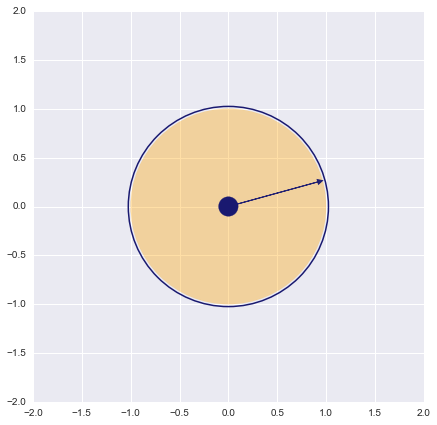

----------------------------------------------------------------
COX8A
ONE


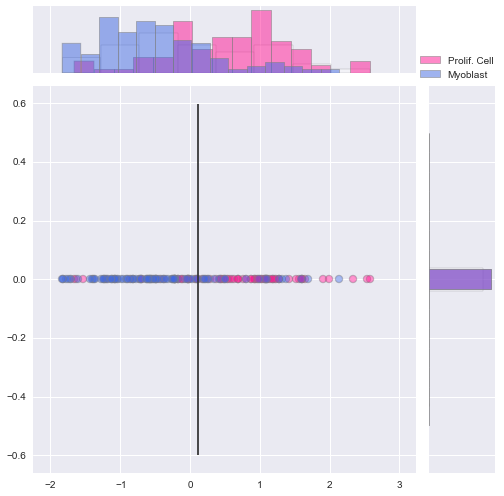

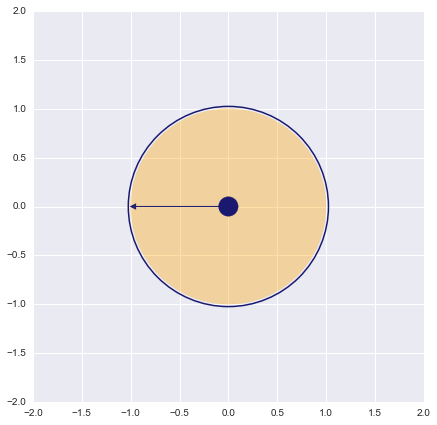

----------------------------------------------------------------


In [28]:
for gn in srt_signifi_genes[:100]:
    print gn
    if len(ENSG_isoforms[all_gene_names_to_id[gn][0]])>1:
        total_exp=X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])].sum(axis=0)
    #     total_exp=np.std(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)/np.mean(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)

        argsrt=np.argsort(total_exp)
        idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])[argsrt][::-1][:2]
        k=2
        c1=X1[:,idx]
        c2=X2[:,idx]
        c=np.concatenate([c1,c2])
        
        if np.any(np.mean(c,axis=0)==0):
            c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
            c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
        else:
            c=c-np.mean(c,axis=0)
            c=c/np.std(c,axis=0)

    else:
        idx=gene_to_iso_IDX(all_gene_names_to_id[gn][0])
        k=2
        c1=np.concatenate((X1[:,idx],np.zeros((N1,1))),axis=1)
        c2=np.concatenate((X2[:,idx],np.zeros((N2,1))),axis=1)
        c=np.concatenate([c1,c2])
        c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
        c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
        print "ONE"

#     c=np.concatenate([c1,c2])
    # c=c-np.mean(c,axis=0)
#     print c.shape
#     print np.mean(c)
    labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)

    logr = LogisticRegression()
    logr.fit(c,labels)
    pred=np.array(logr.predict_proba(c)[:,1])
    gene_score=log_loss(labels,pred)

    llf=-gene_score*(N1+N2)
    p_of_1=N1/float(N1+N2)
    llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
    llr=llf-llnull
    llr_pval = 1-stats.chi2.cdf(2*llr,k)

    w=logr.coef_[0]
    w0=logr.intercept_[0]
#     print "score",gene_score
#     print "llf",llf
#     print "llnull",llnull
#     print "LLR",llr
#     print "p-val",llr_pval

    a=sns.jointplot(x=c[:,0], y=c[:,1], color='white',size=7,marginal_kws=dict(norm_hist=True),stat_func=None,label='_nolegend_');

    a.ax_joint.scatter(c[:N1,0],c[:N1,1],color='deeppink',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Prolif. Cell')
    a.ax_marg_x.hist(c[:N1,0],bins=15,normed=1,alpha=0.5,color='deeppink',edgecolor="gray", linewidth=1,)
    a.ax_marg_y.hist(c[:N1,1],bins=15,normed=1,alpha=0.5,color='deeppink',orientation='horizontal',edgecolor="gray", linewidth=1,label='Prolif. Cell')

    a.ax_joint.scatter(c[N1:,0],c[N1:,1],color='royalblue',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Myoblast')
    a.ax_marg_x.hist(c[N1:,0],bins=15,normed=1,alpha=0.5,color='royalblue',edgecolor="gray", linewidth=1,)
    a.ax_marg_y.hist(c[N1:,1],bins=15,normed=1,alpha=0.5,color='royalblue',orientation='horizontal',edgecolor="gray", linewidth=1,label='Myoblast')

    plt.legend(bbox_to_anchor=(0.1, 1, 1., .102))
    # a.ax_joint.set_xlim([-40,40])
    # a.ax_joint.set_ylim([-40,40])
    ylim=a.ax_joint.get_ylim()
    xlim=a.ax_joint.get_xlim()
    xx, yy = np.mgrid[xlim[0]:xlim[1]:(xlim[1]-xlim[0])/500., ylim[0]:ylim[1]:(ylim[1]-ylim[0])/500.]
    grid = np.c_[xx.ravel(), yy.ravel()]
    probs = logr.predict_proba(grid)[:, 1].reshape(xx.shape)
    a.ax_joint.contour(xx, yy, probs, levels=[.5], cmap="Greys", vmin=0, vmax=.6)
    plt.show()
    sns.set_style("darkgrid")    

    plt.figure(figsize=(7,7))
    x0, y0 = 0, 0
    radius = 1
    # Draw circle
    circle1 = plt.Circle((x0,y0), radius, color='orange', fill=True,alpha=0.35)
    circle2 = plt.Circle((x0,y0), radius+0.025, color='midnightblue', fill=False,linewidth=1.5)

    fig = plt.gcf()
    fig.gca().add_artist(circle1)
    fig.gca().add_artist(circle2)
    head_length=0.05
    vec=-w/np.linalg.norm(w)
    plt.arrow(x0, y0,
                 (radius - head_length) * vec[0],
                 (radius - head_length) * vec[1],
                 head_width=0.05, head_length=head_length, fc='midnightblue', ec='midnightblue',alpha=0.95,linewidth=1)
    plt.xlim([-2,2])
    plt.ylim([-2,2])

    circleC = plt.Circle((x0,y0), 0.1, color='midnightblue', fill=True,alpha=1)
    fig.gca().add_artist(circleC)
    plt.show()
    print '----------------------------------------------------------------'

### circle plot

In [32]:
len(iso_keys[sorted_gen_ids][:np.sum(rej)])

1308

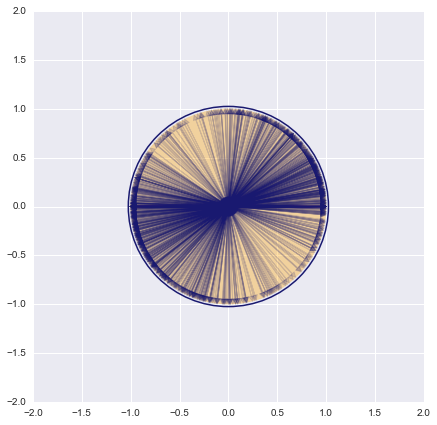

----------------------------------------------------------------


In [33]:
plt.figure(figsize=(7,7))
cir=True
alt_gn=[]
for ensg in iso_keys[sorted_gen_ids][:np.sum(rej)]:
#     print gn
    
    if len(ENSG_isoforms[ensg])>1:
        total_exp=X[:,gene_to_iso_IDX(ensg)].sum(axis=0)
    #     total_exp=np.std(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)/np.mean(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)

        argsrt=np.argsort(total_exp)
        idx=gene_to_iso_IDX(ensg)[argsrt][::-1][:2]
        k=2
        c1=X1[:,idx]
        c2=X2[:,idx]
        c=np.concatenate([c1,c2])
        
        if np.any(np.mean(c,axis=0)==0):
            c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
            c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
        else:
            c=c-np.mean(c,axis=0)
            c=c/np.std(c,axis=0)

    else:
        idx=gene_to_iso_IDX(ensg)
        k=2
        c1=np.concatenate((X1[:,idx],np.zeros((N1,1))),axis=1)
        c2=np.concatenate((X2[:,idx],np.zeros((N2,1))),axis=1)
        c=np.concatenate([c1,c2])
        c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
        c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
#         print "ONE"

#     c=np.concatenate([c1,c2])
    # c=c-np.mean(c,axis=0)
#     print c.shape
#     print np.mean(c)
    labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)

    logr = LogisticRegression()
    logr.fit(c,labels)
    pred=np.array(logr.predict_proba(c)[:,1])
    gene_score=log_loss(labels,pred)

    llf=-gene_score*(N1+N2)
    p_of_1=N1/float(N1+N2)
    llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
    llr=llf-llnull
    llr_pval = 1-stats.chi2.cdf(2*llr,k)

    w=logr.coef_[0]
    w0=logr.intercept_[0]
#     print "score",gene_score
#     print "llf",llf
#     print "llnull",llnull
#     print "LLR",llr
#     print "p-val",llr_pval

#     a=sns.jointplot(x=c[:,0], y=c[:,1], color='white',size=7,marginal_kws=dict(norm_hist=True),stat_func=None,label='_nolegend_');

#     a.ax_joint.scatter(c[:N1,0],c[:N1,1],color='deeppink',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Prolif. Cell')
#     a.ax_marg_x.hist(c[:N1,0],bins=15,normed=1,alpha=0.5,color='deeppink',edgecolor="gray", linewidth=1,)
#     a.ax_marg_y.hist(c[:N1,1],bins=15,normed=1,alpha=0.5,color='deeppink',orientation='horizontal',edgecolor="gray", linewidth=1,label='Prolif. Cell')

#     a.ax_joint.scatter(c[N1:,0],c[N1:,1],color='royalblue',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Myoblast')
#     a.ax_marg_x.hist(c[N1:,0],bins=15,normed=1,alpha=0.5,color='royalblue',edgecolor="gray", linewidth=1,)
#     a.ax_marg_y.hist(c[N1:,1],bins=15,normed=1,alpha=0.5,color='royalblue',orientation='horizontal',edgecolor="gray", linewidth=1,label='Myoblast')

#     plt.legend(bbox_to_anchor=(0.1, 1, 1., .102))
#     # a.ax_joint.set_xlim([-40,40])
#     # a.ax_joint.set_ylim([-40,40])
#     ylim=a.ax_joint.get_ylim()
#     xlim=a.ax_joint.get_xlim()
#     xx, yy = np.mgrid[xlim[0]:xlim[1]:(xlim[1]-xlim[0])/500., ylim[0]:ylim[1]:(ylim[1]-ylim[0])/500.]
#     grid = np.c_[xx.ravel(), yy.ravel()]
#     probs = logr.predict_proba(grid)[:, 1].reshape(xx.shape)
#     a.ax_joint.contour(xx, yy, probs, levels=[.5], cmap="Greys", vmin=0, vmax=.6)
#     plt.show()
#     sns.set_style("darkgrid")    

    if cir:
        x0, y0 = 0, 0
        radius = 1
        # Draw circle
        circle1 = plt.Circle((x0,y0), radius, color='orange', fill=True,alpha=0.35)
        circle2 = plt.Circle((x0,y0), radius+0.025, color='midnightblue', fill=False,linewidth=1.5)

        fig = plt.gcf()
        fig.gca().add_artist(circle1)
        fig.gca().add_artist(circle2)
        cir=False
    
    head_length=0.05
    
    vec=-w/np.linalg.norm(w)
    plt.arrow(x0, y0,
                 (radius - head_length) * vec[0],
                 (radius - head_length) * vec[1],
                 head_width=0.05, head_length=head_length, fc='midnightblue', ec='midnightblue',alpha=0.15,linewidth=1)
    plt.xlim([-2,2])
    plt.ylim([-2,2])
    if cosine_corr(vec,np.array([-1,1]))>0.9: 
        alt_gn+=[ensg]
#         plt.arrow(x0, y0,
#                  (radius - head_length) * vec[0],
#                  (radius - head_length) * vec[1],
#                  head_width=0.05, head_length=head_length, fc='deeppink', ec='deeppink',alpha=0.25,linewidth=1)
    
    

circleC = plt.Circle((x0,y0), 0.1, color='midnightblue', fill=True,alpha=1)
fig.gca().add_artist(circleC)
plt.show()
print '----------------------------------------------------------------'

### show genes with alt directions

['CENPK']


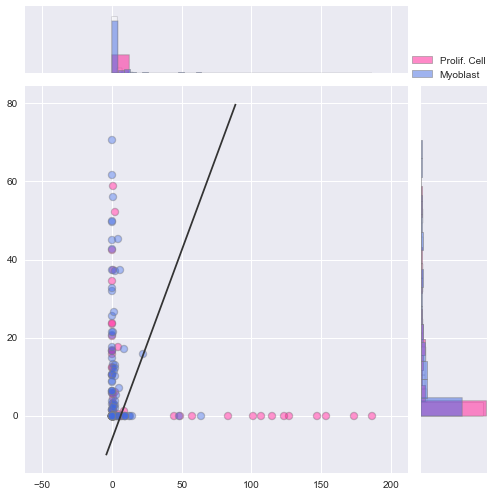

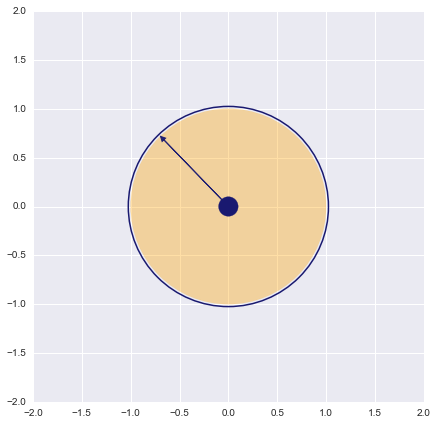

----------------------------------------------------------------
['ATP5C1']


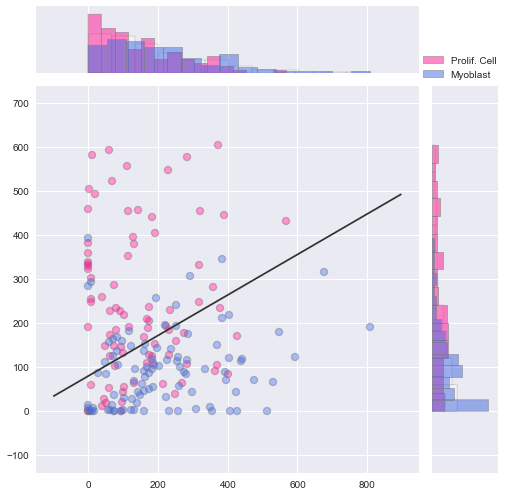

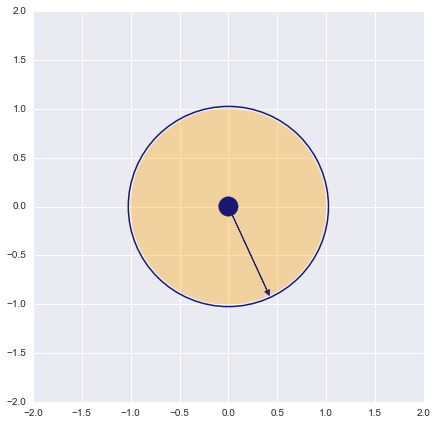

----------------------------------------------------------------
['S100A16']


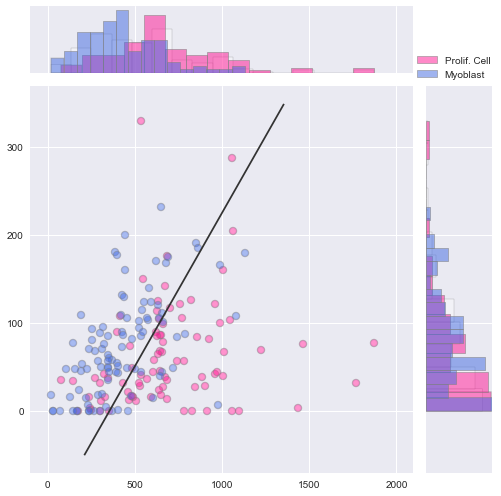

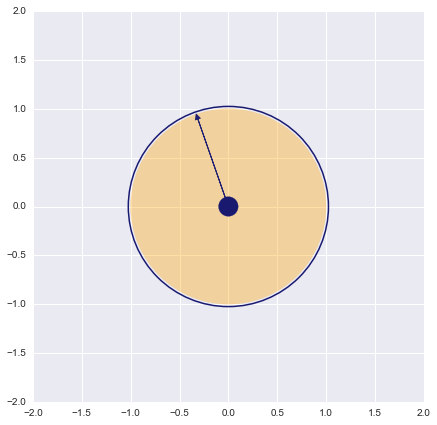

----------------------------------------------------------------
['MPV17L']


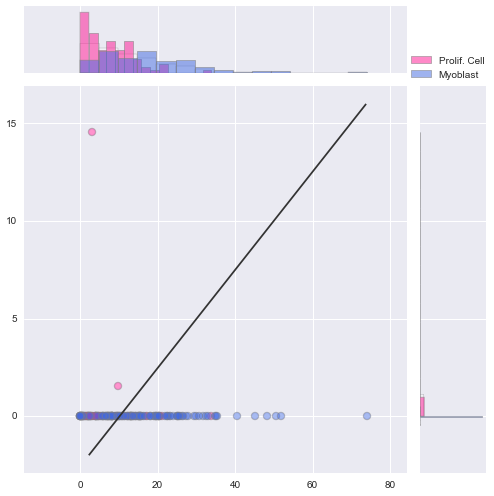

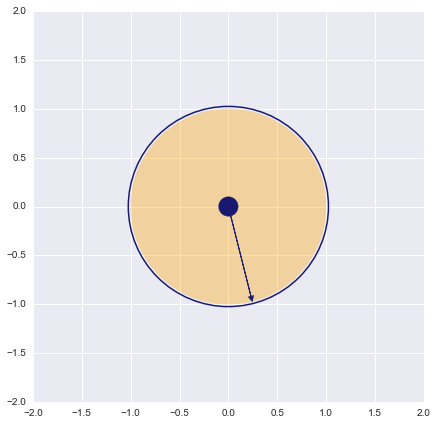

----------------------------------------------------------------
['CCDC80']


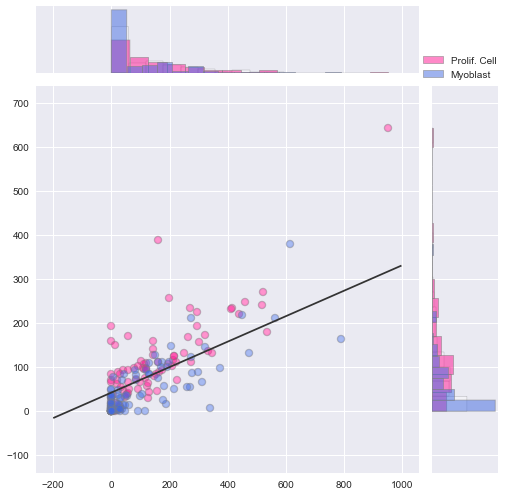

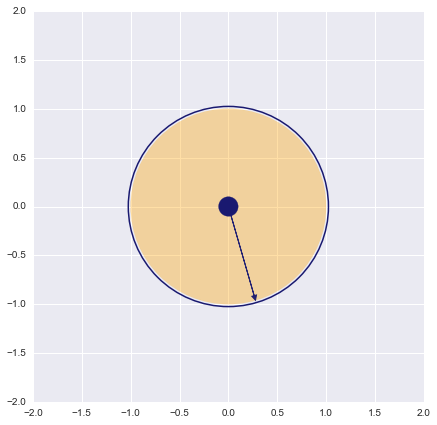

----------------------------------------------------------------
['VDAC3']


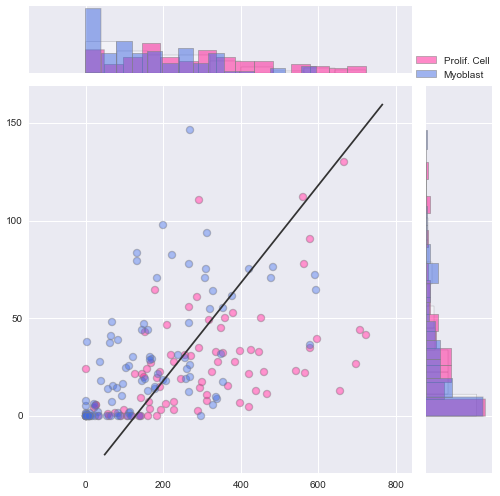

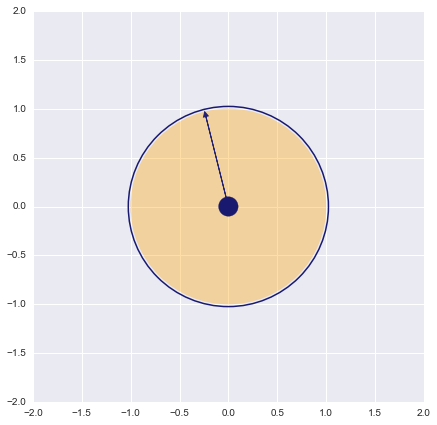

----------------------------------------------------------------
['RPL15']


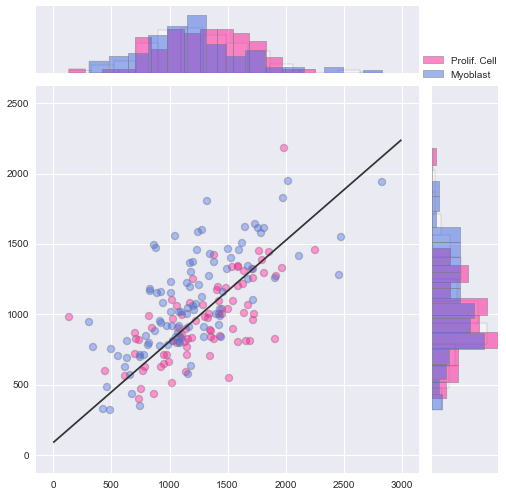

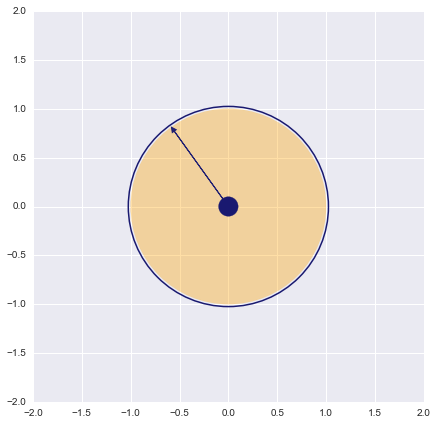

----------------------------------------------------------------
['RPS23']


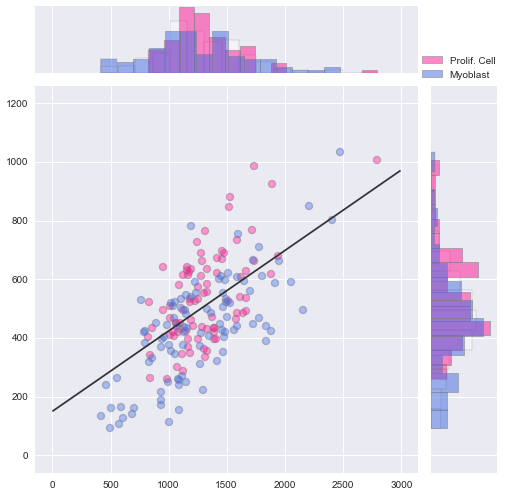

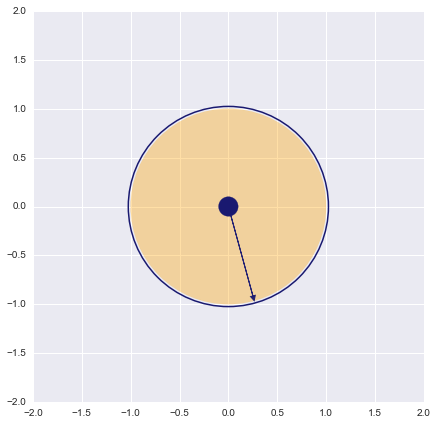

----------------------------------------------------------------
['ECT2']


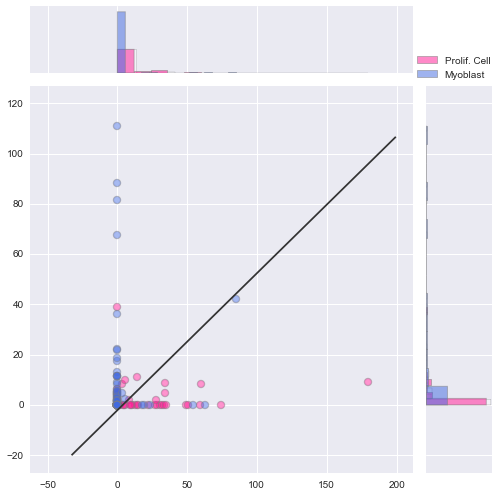

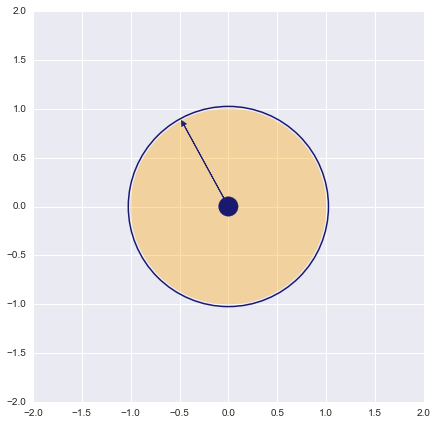

----------------------------------------------------------------
['ITFG2']


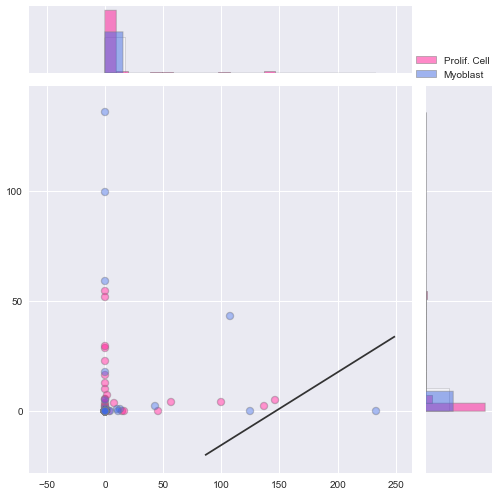

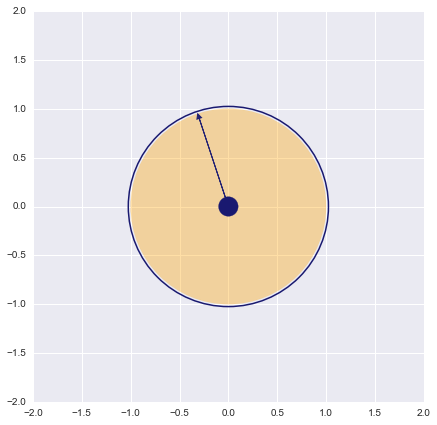

----------------------------------------------------------------
['TAGLN']


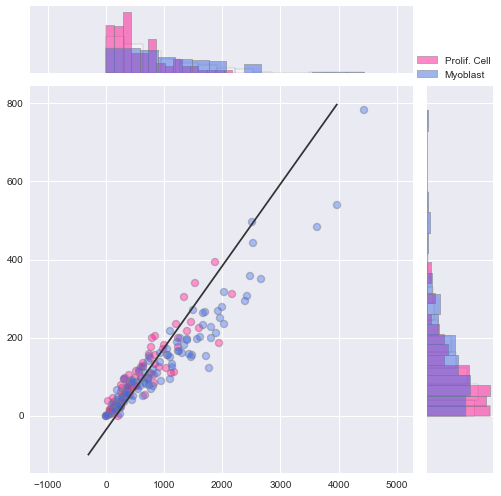

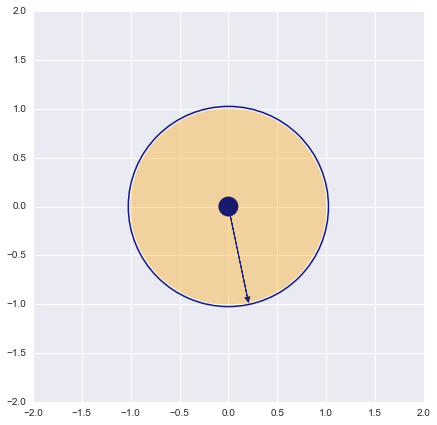

----------------------------------------------------------------
['PPIA']


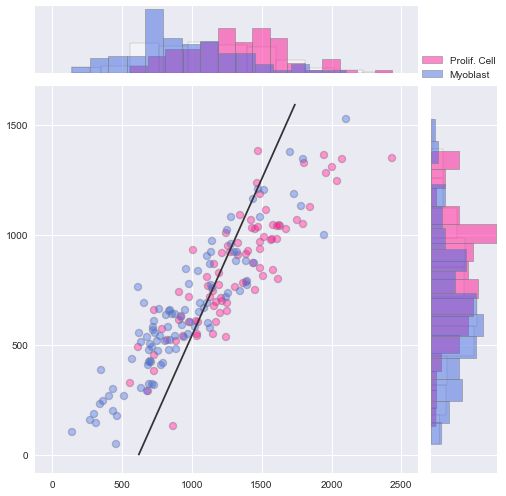

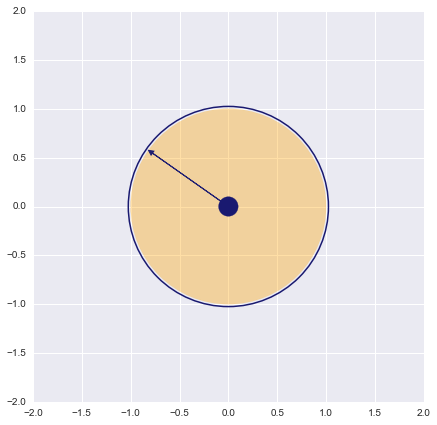

----------------------------------------------------------------
['CALR']


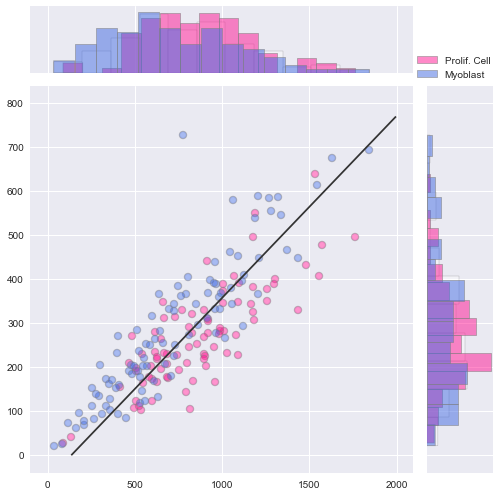

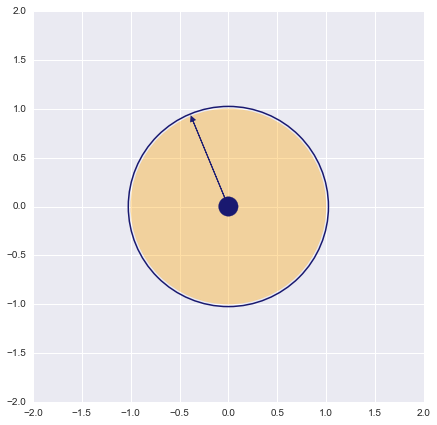

----------------------------------------------------------------
['SDHD']


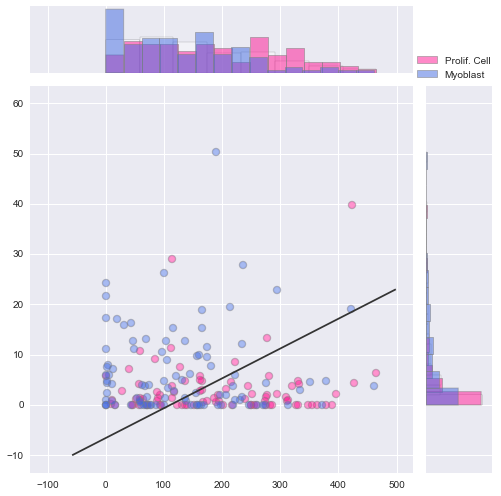

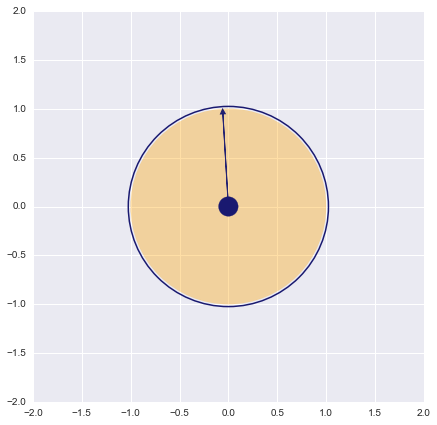

----------------------------------------------------------------
['NDUFS8']


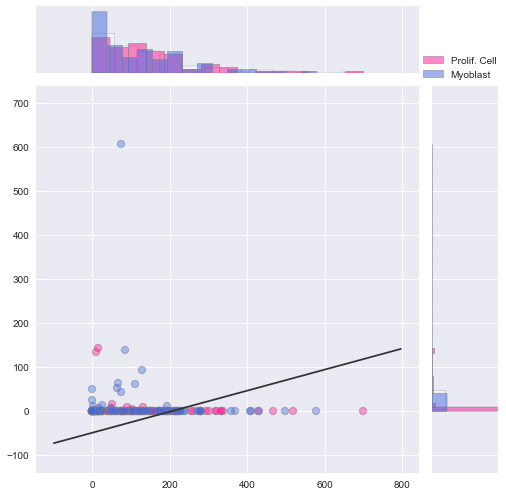

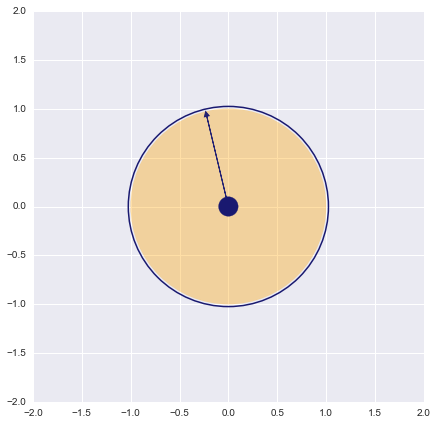

----------------------------------------------------------------
['SAR1A']


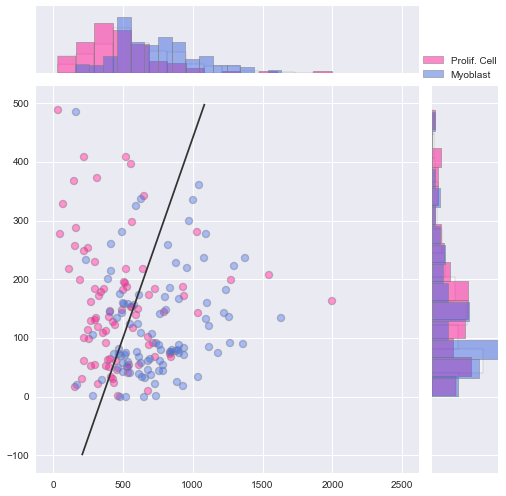

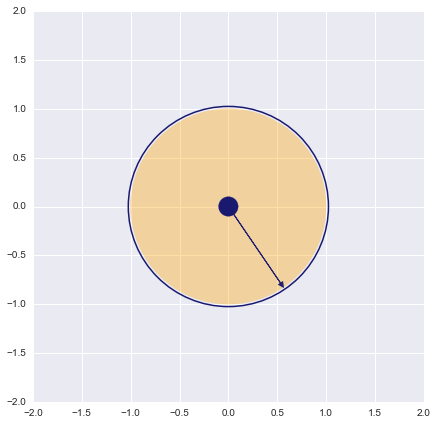

----------------------------------------------------------------
['CWF19L1']


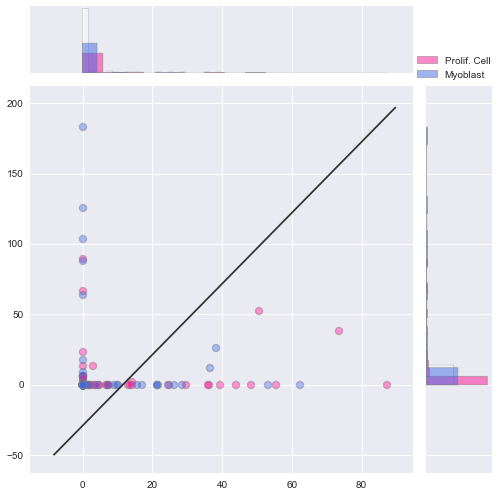

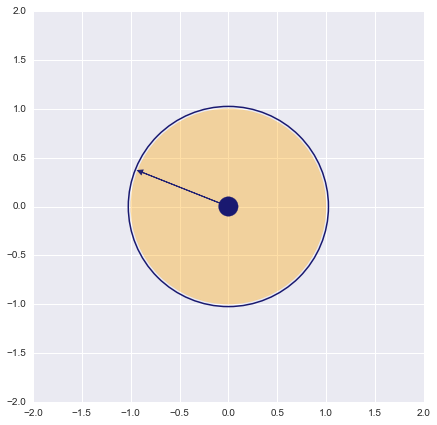

----------------------------------------------------------------
['STMN1']


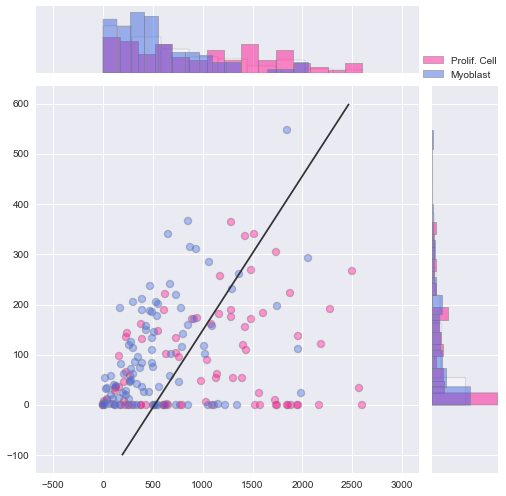

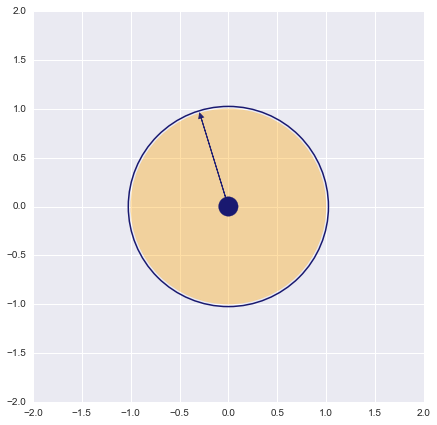

----------------------------------------------------------------
['OPHN1']


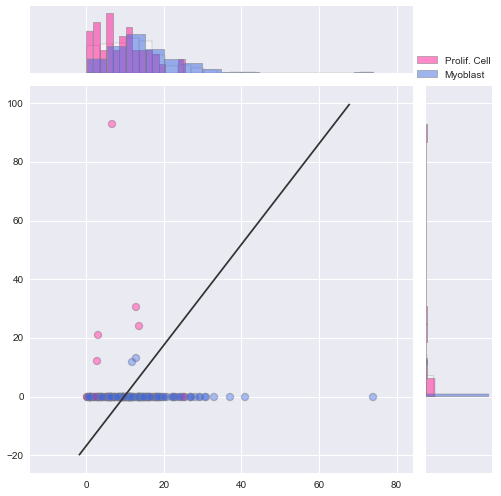

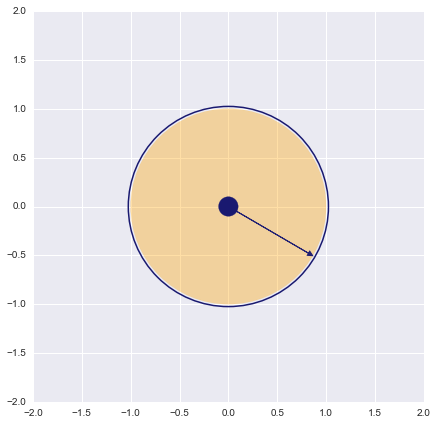

----------------------------------------------------------------
['CAPZA1']


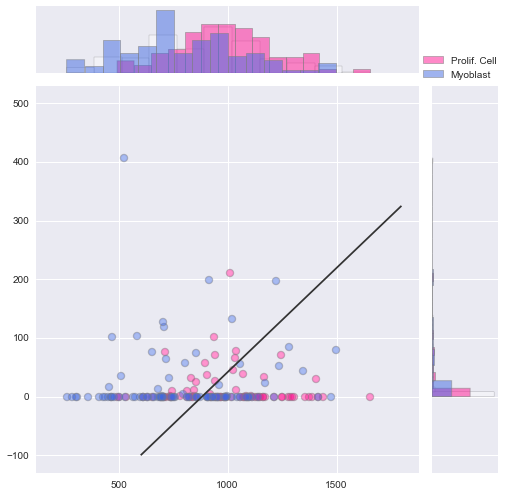

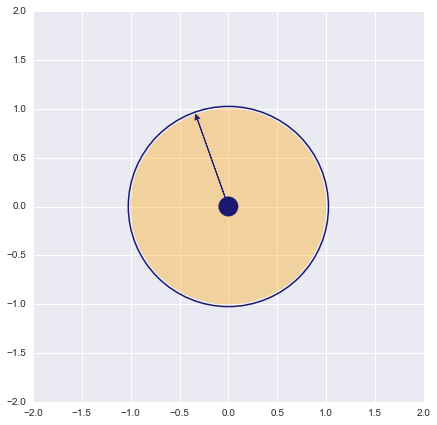

----------------------------------------------------------------
['HAUS8']


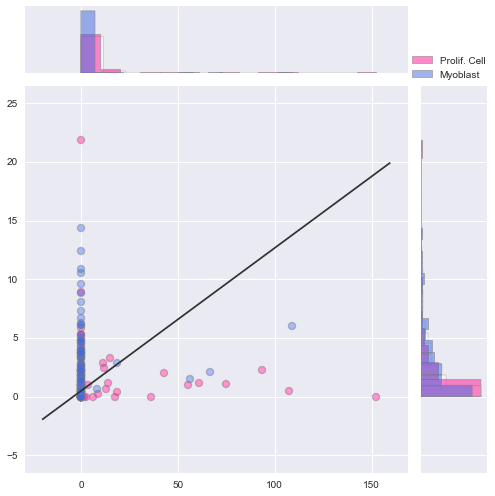

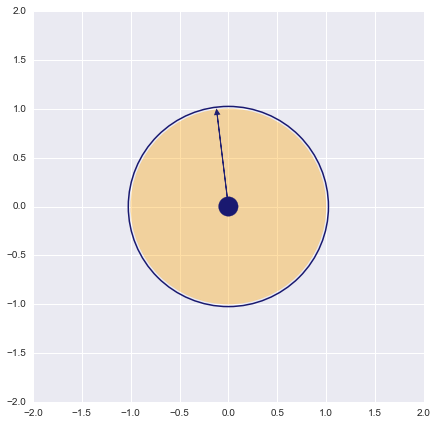

----------------------------------------------------------------
['NDUFA5']


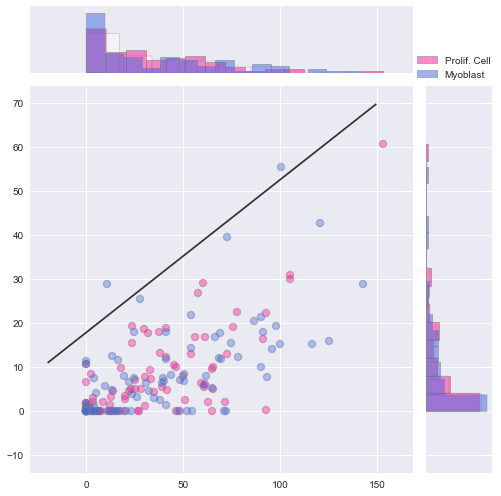

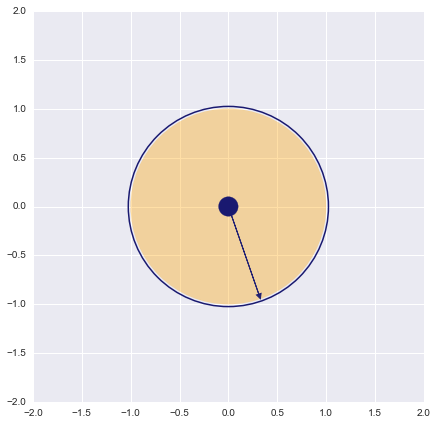

----------------------------------------------------------------
['SNRPN']


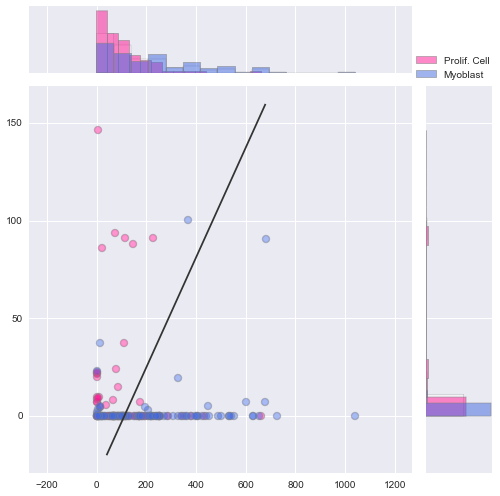

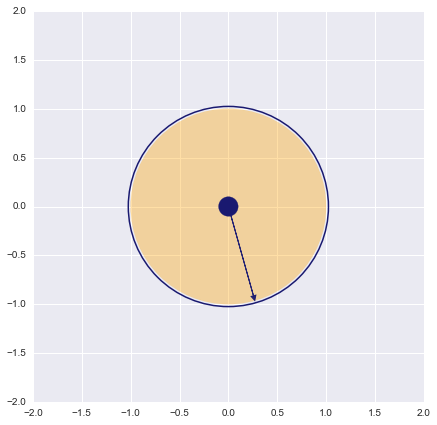

----------------------------------------------------------------
['DARS2']


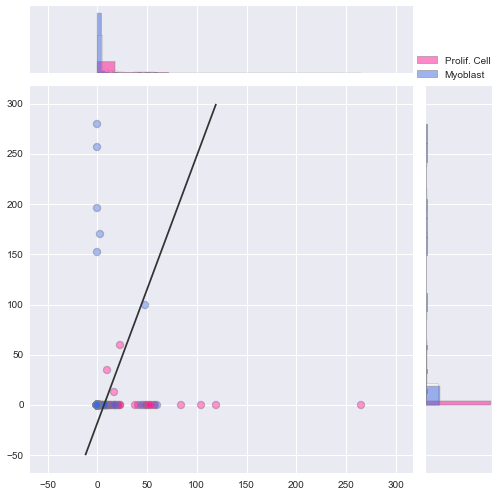

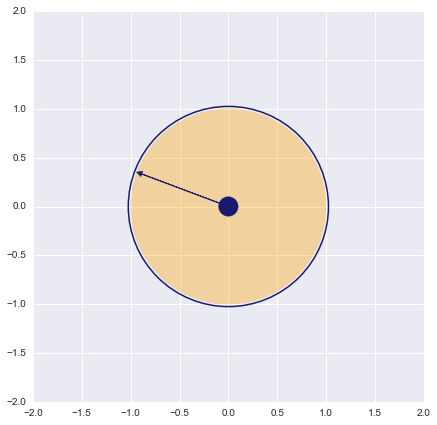

----------------------------------------------------------------
['HSBP1']


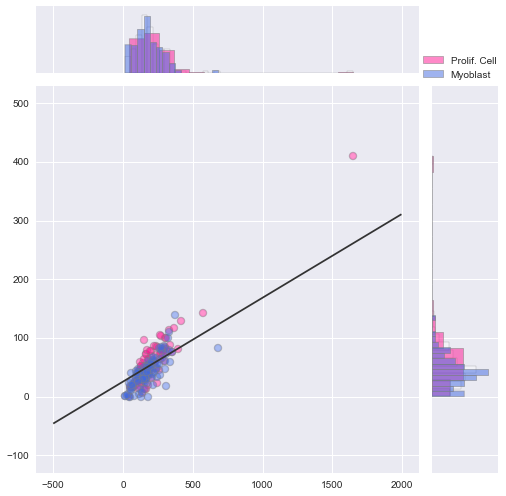

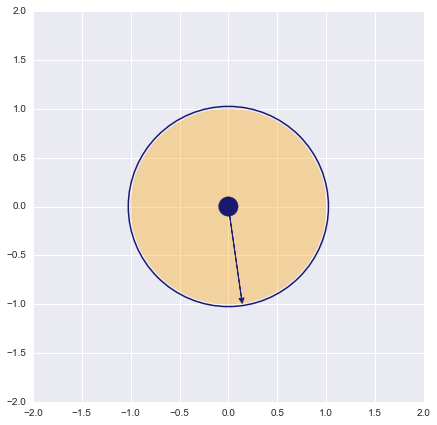

----------------------------------------------------------------
['CFL1']


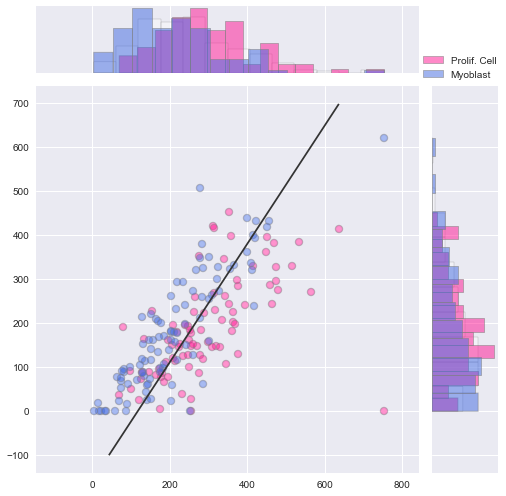

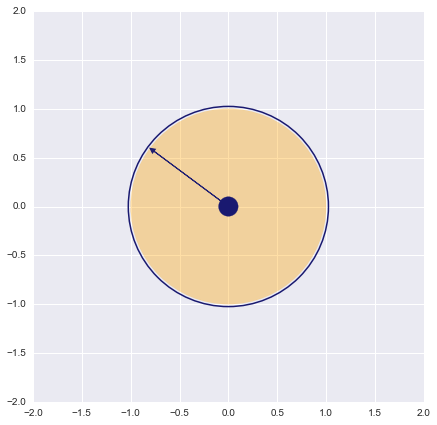

----------------------------------------------------------------
['NUPL2']


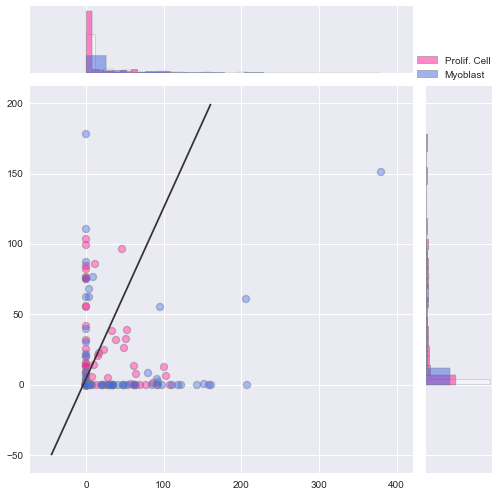

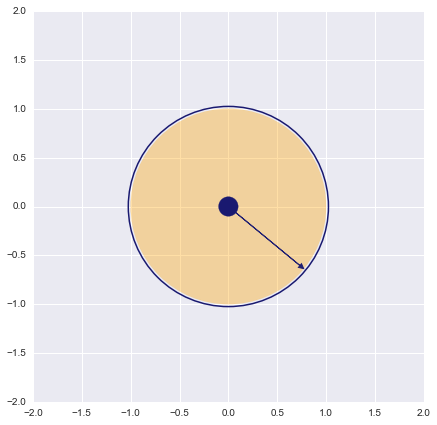

----------------------------------------------------------------
['CFAP54']


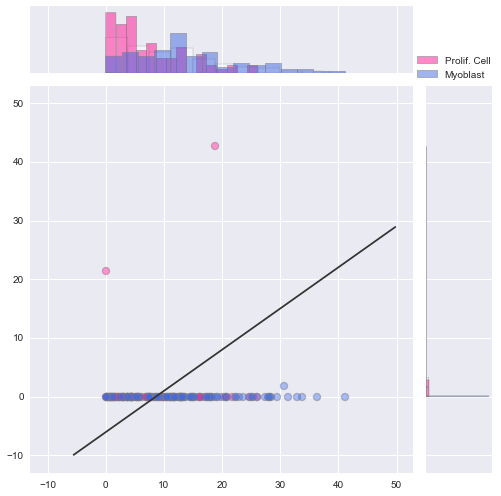

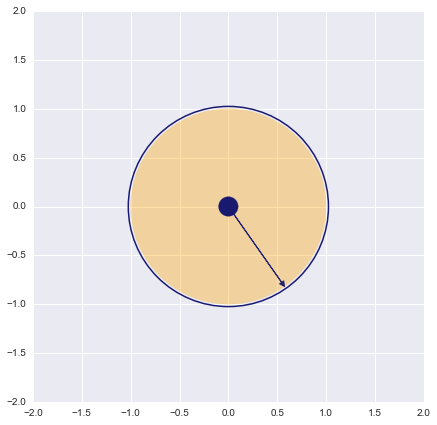

----------------------------------------------------------------
['JUND']


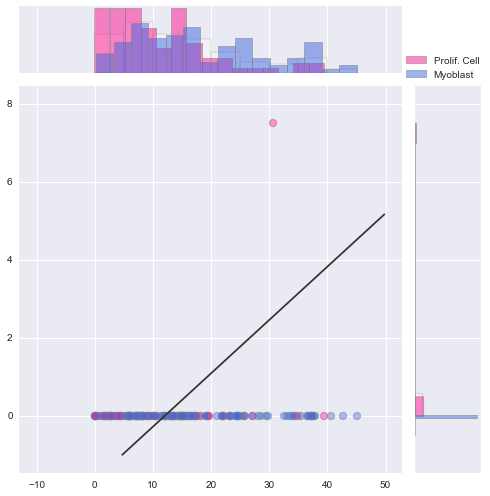

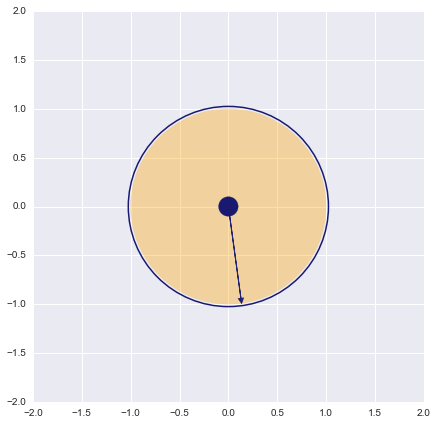

----------------------------------------------------------------
['KNSTRN']


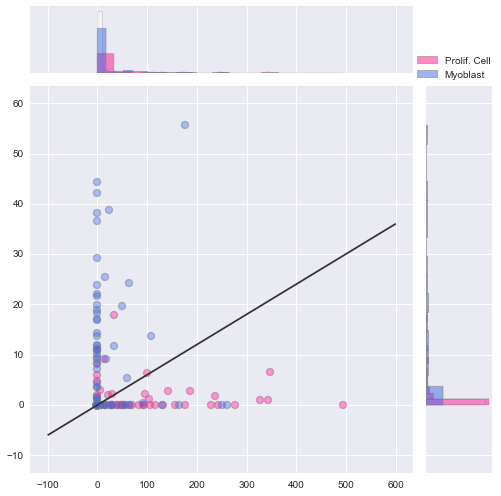

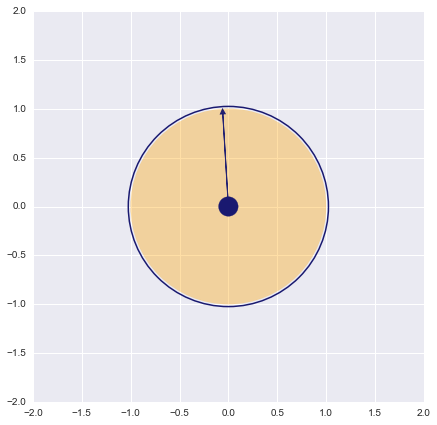

----------------------------------------------------------------
['LOC100506127']


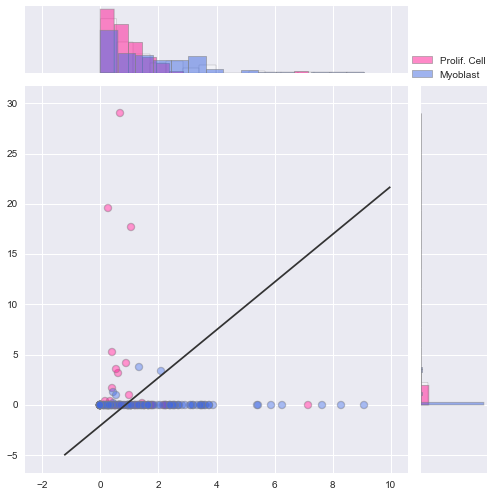

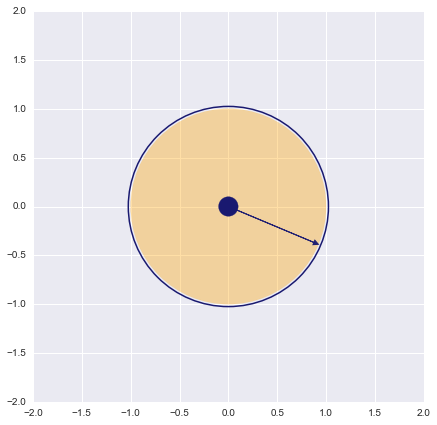

----------------------------------------------------------------
['PLPP5']


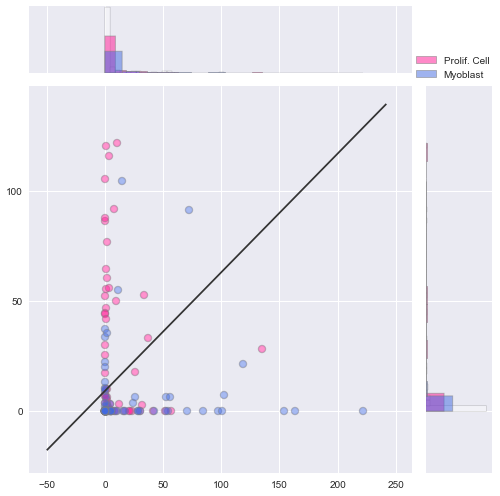

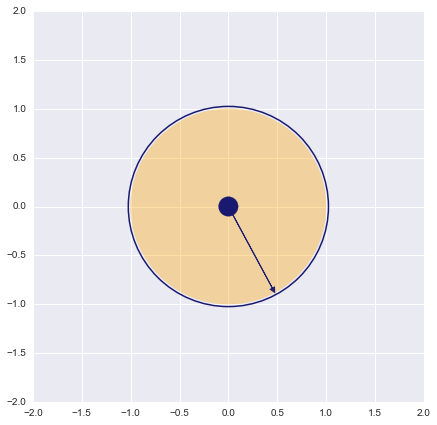

----------------------------------------------------------------
['SCIN']


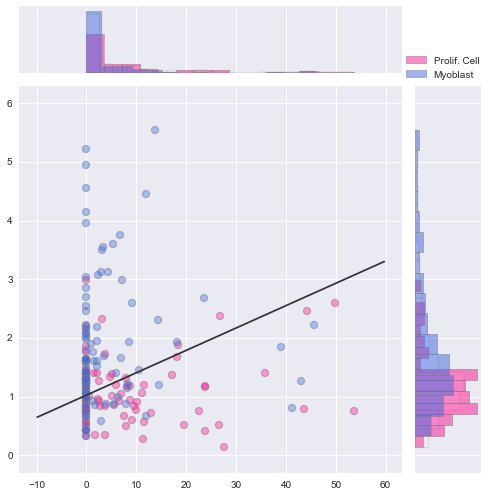

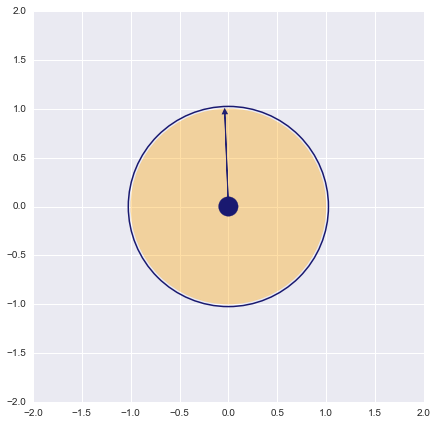

----------------------------------------------------------------
['ANKRD28']


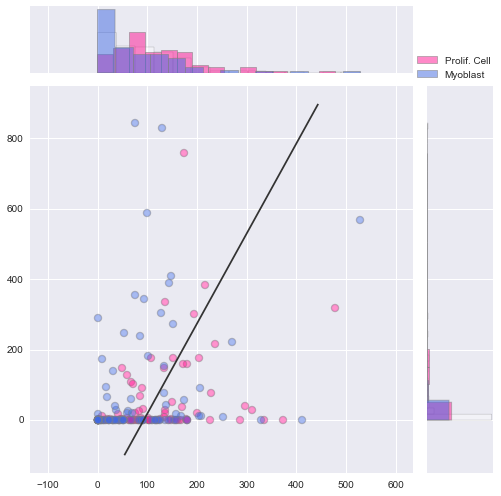

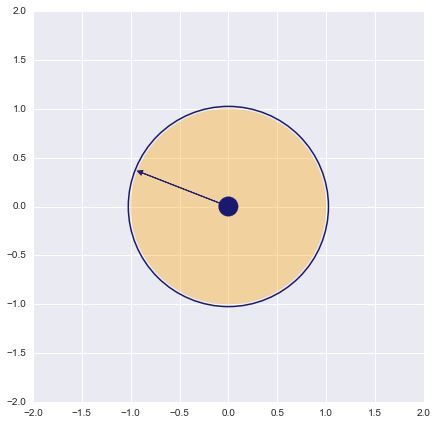

----------------------------------------------------------------
['IGF2BP2']


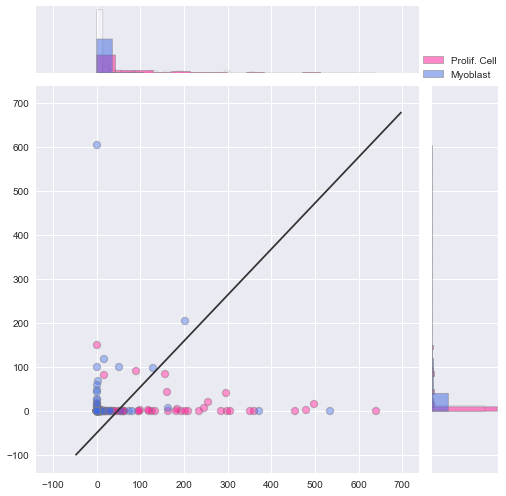

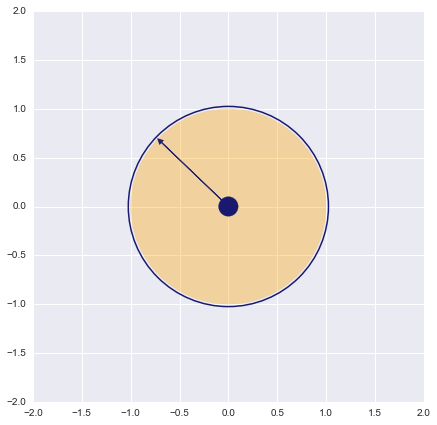

----------------------------------------------------------------
['CRYAB']


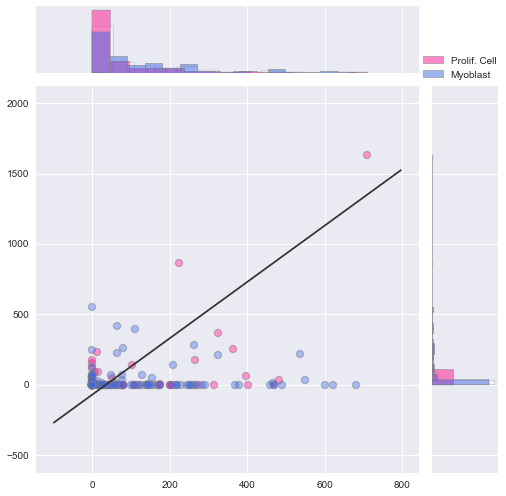

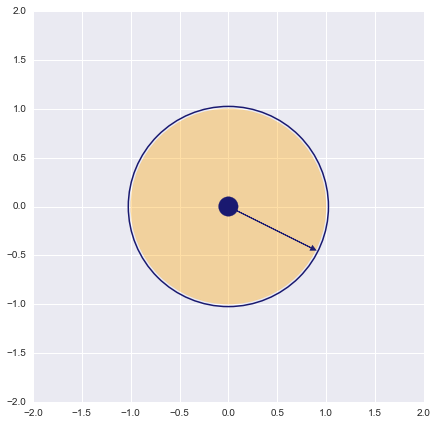

----------------------------------------------------------------
['FBXL5']


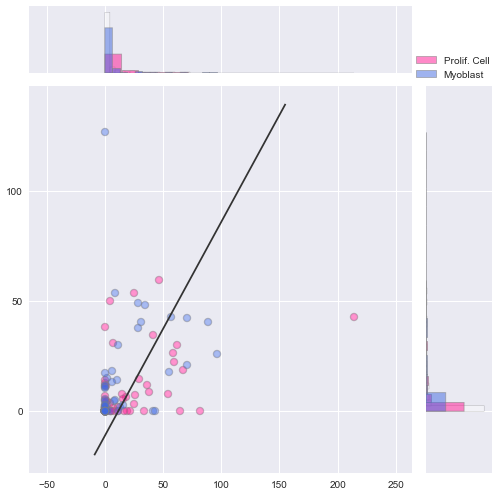

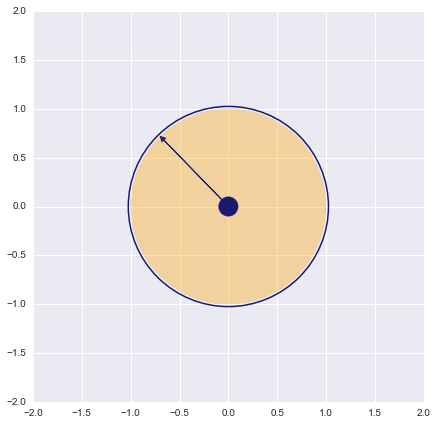

----------------------------------------------------------------
['NAP1L1']


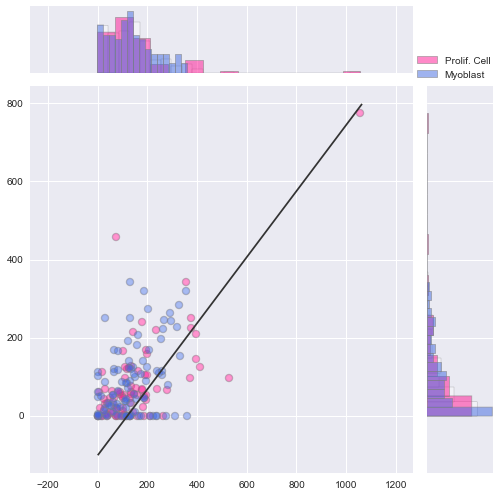

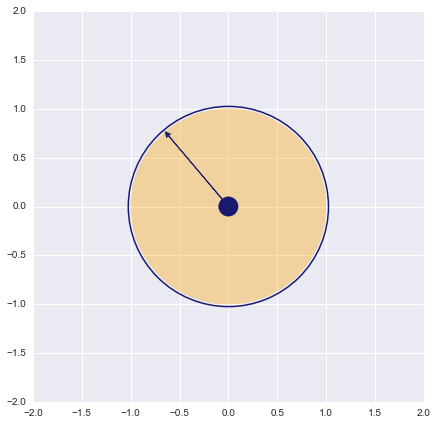

----------------------------------------------------------------
['SMUG1']


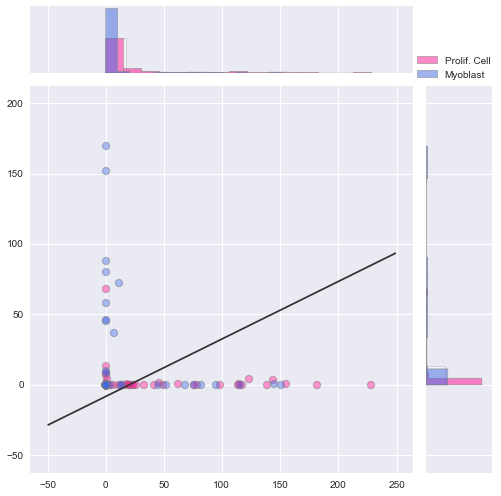

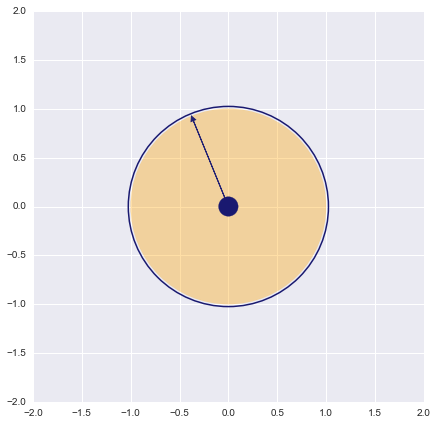

----------------------------------------------------------------
['DDX5']


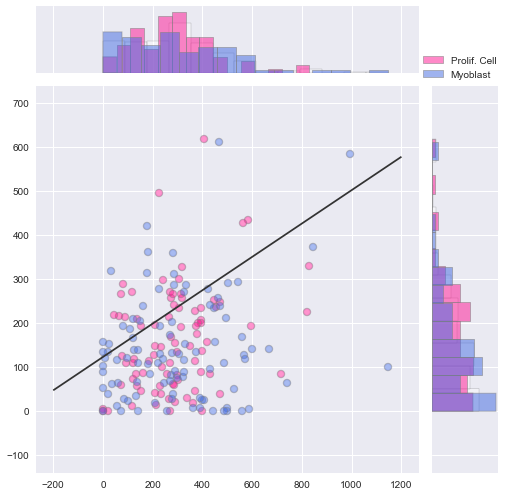

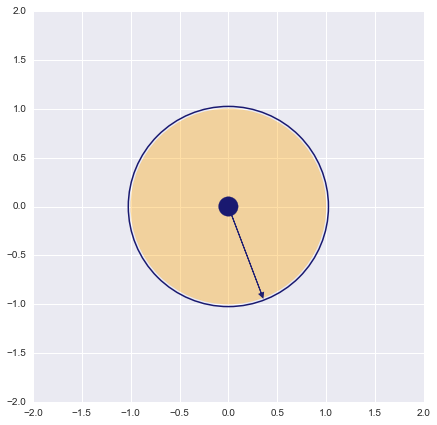

----------------------------------------------------------------
['GFRA1']


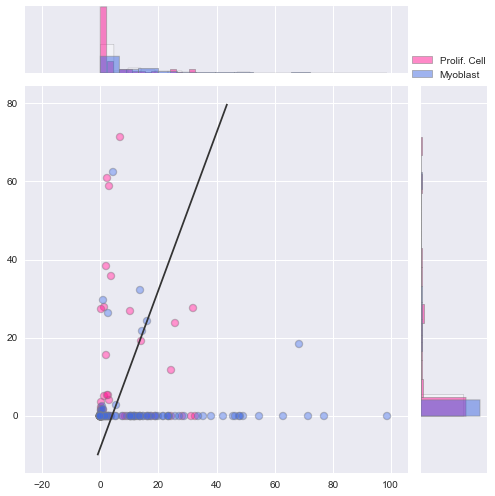

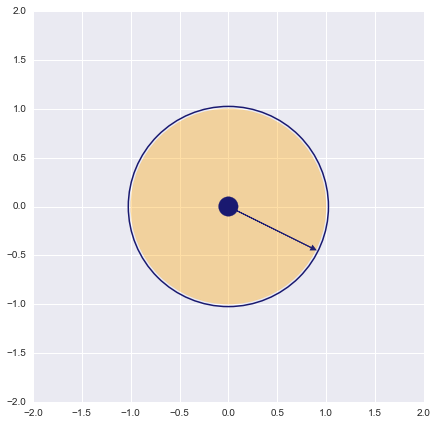

----------------------------------------------------------------
['ANAPC1']


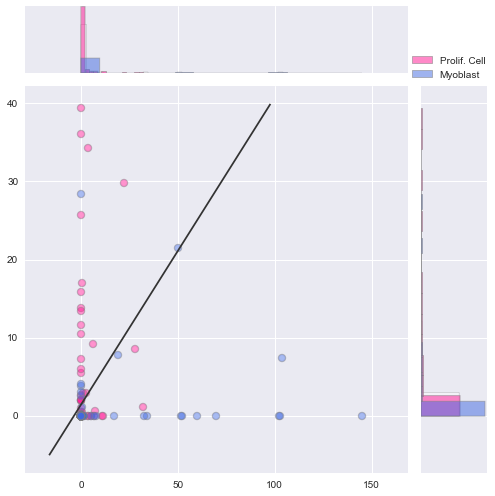

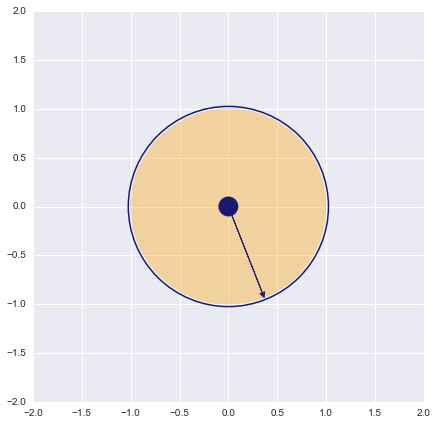

----------------------------------------------------------------
['NUDC']


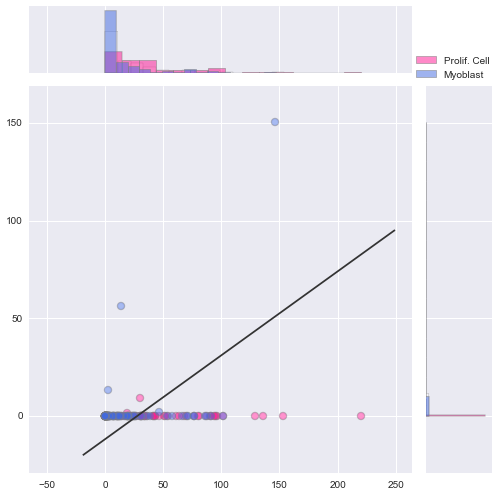

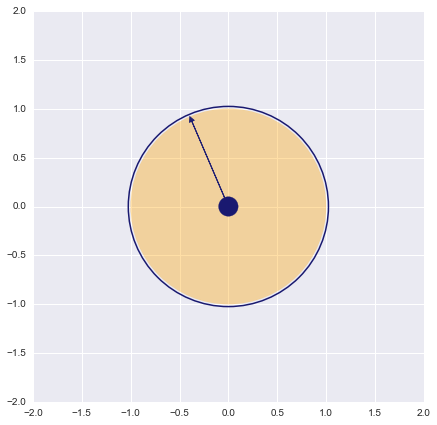

----------------------------------------------------------------
['POT1']


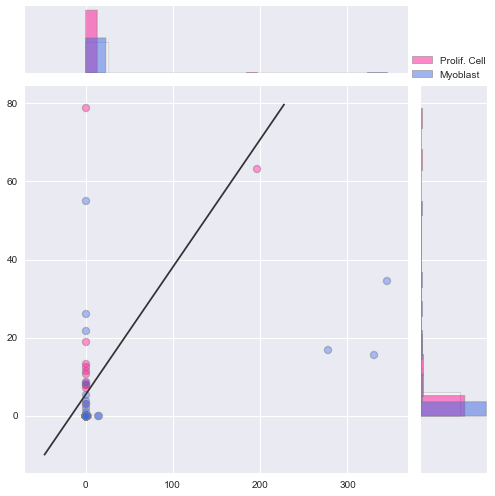

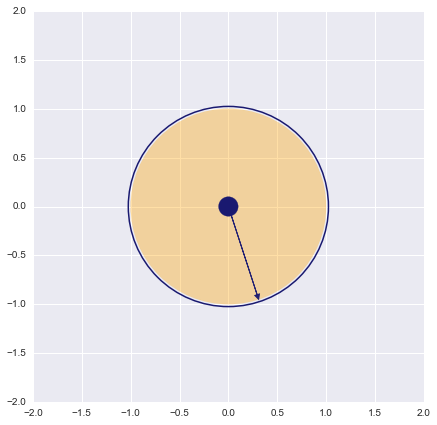

----------------------------------------------------------------
['CNOT10']


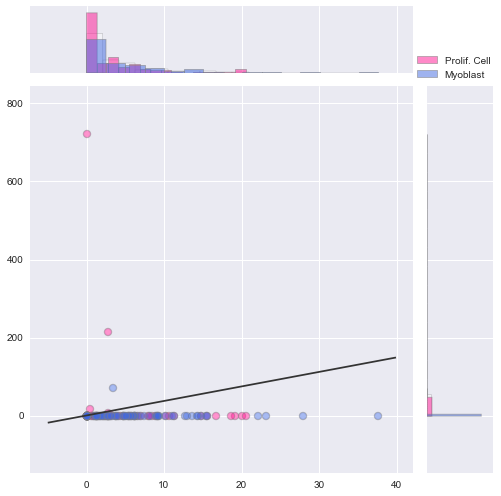

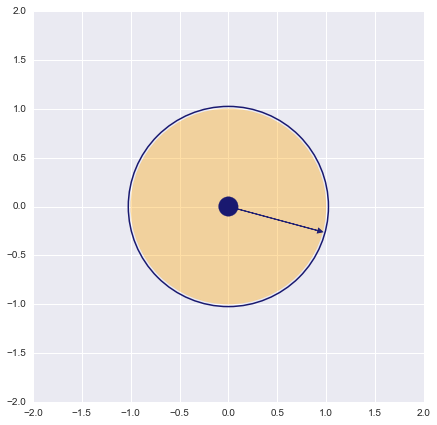

----------------------------------------------------------------
['AC012254.2']


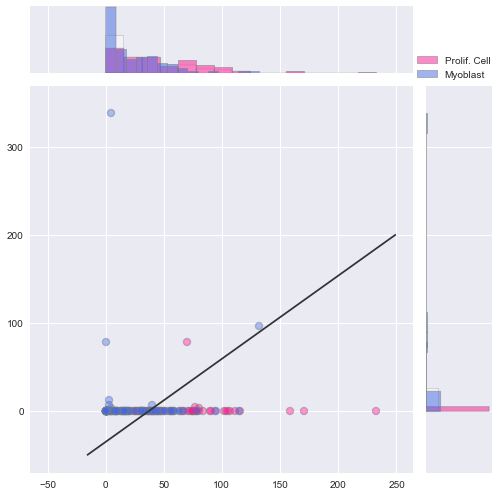

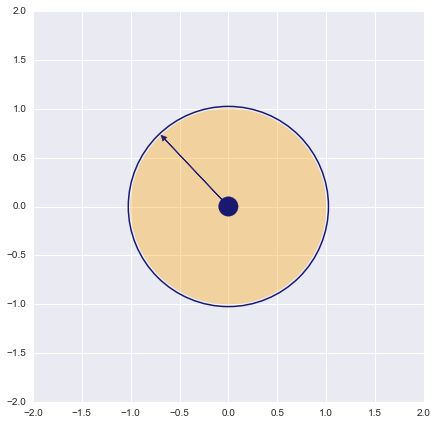

----------------------------------------------------------------
['HDLBP']


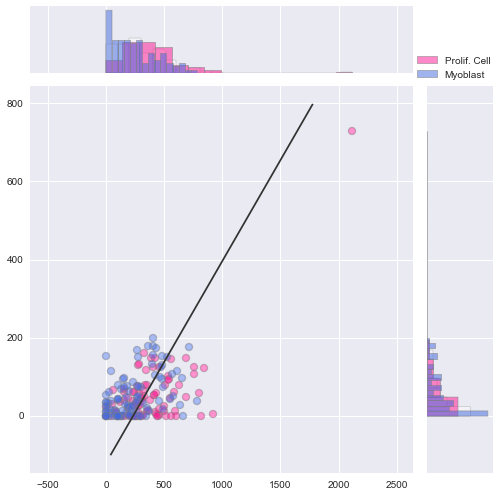

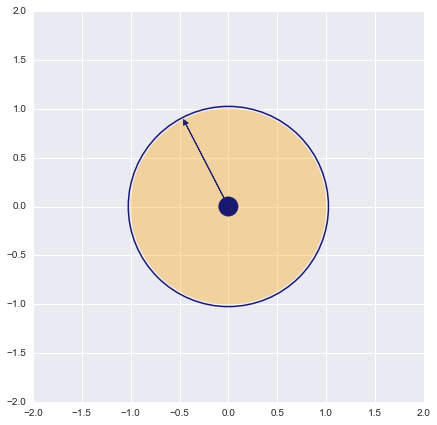

----------------------------------------------------------------
['RBMX']


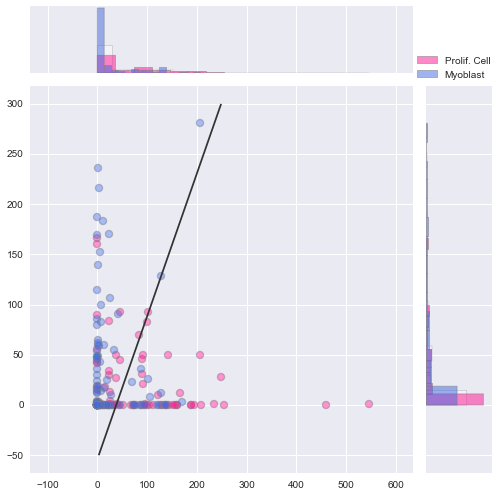

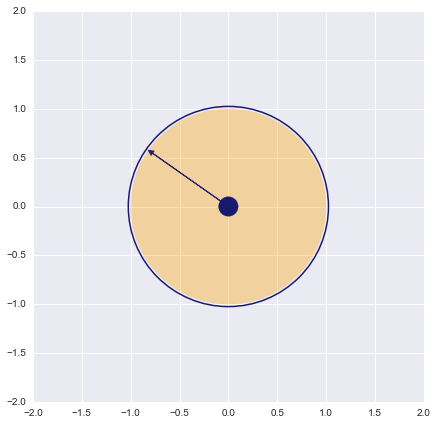

----------------------------------------------------------------
['ARPC1B']


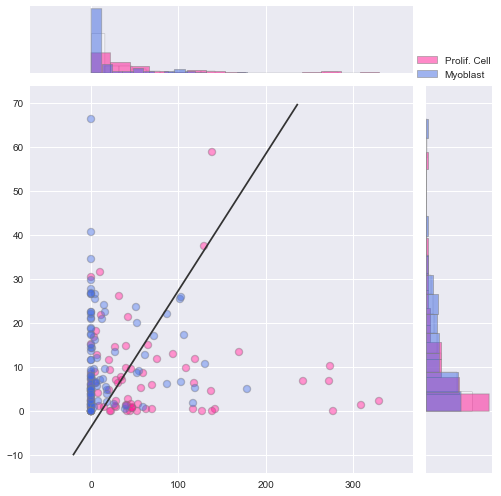

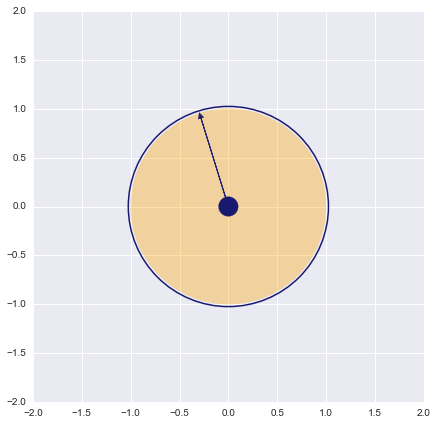

----------------------------------------------------------------
['ITM2B']


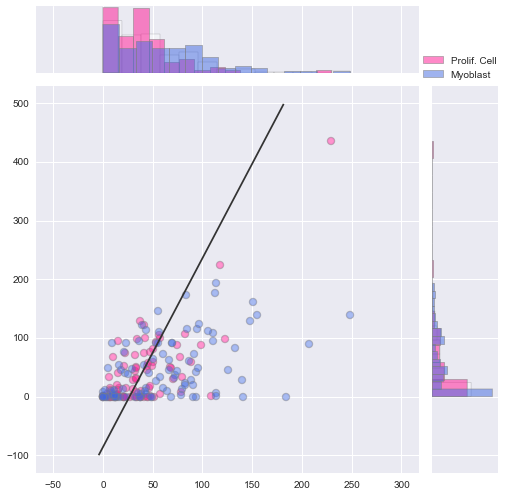

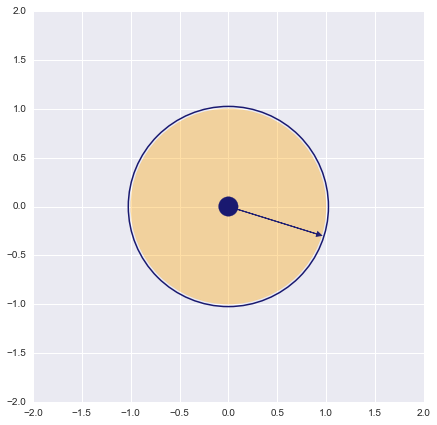

----------------------------------------------------------------
['TMEM138']


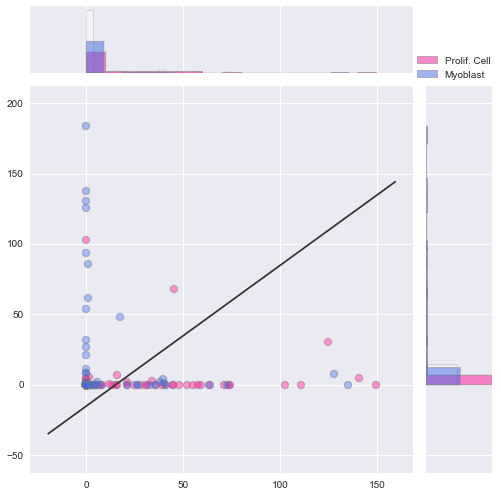

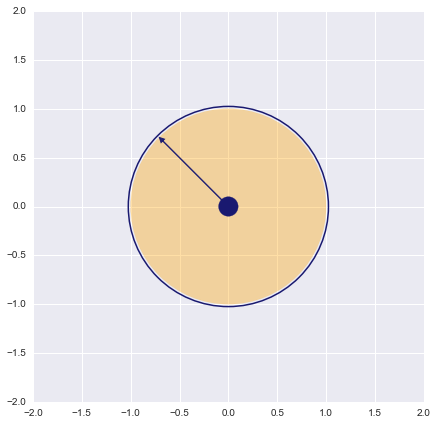

----------------------------------------------------------------
['CNN2']


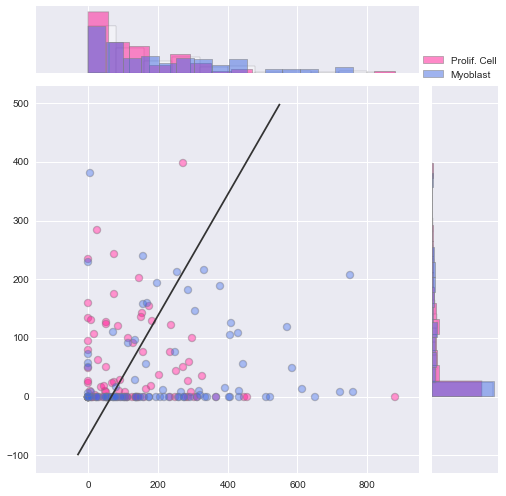

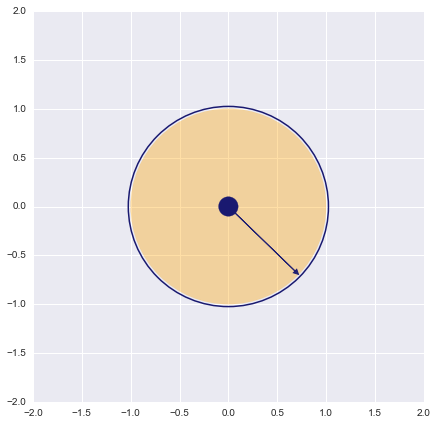

----------------------------------------------------------------
['NHP2']


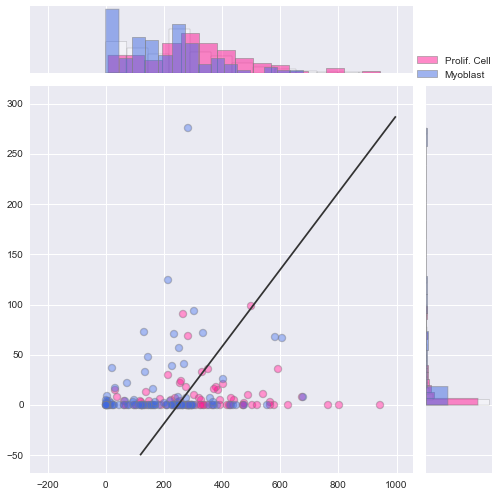

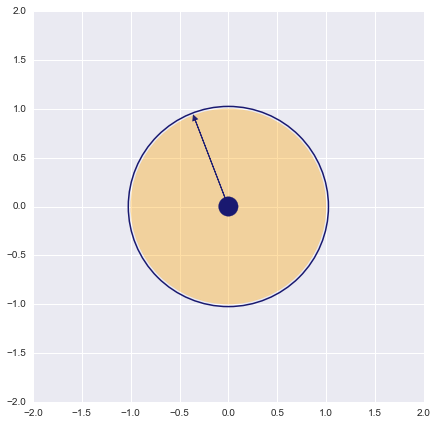

----------------------------------------------------------------
['SLIRP']


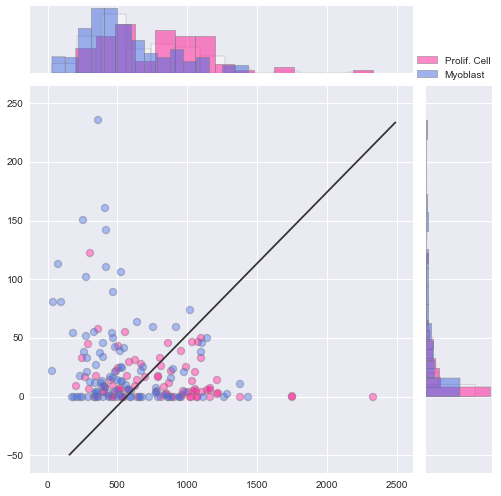

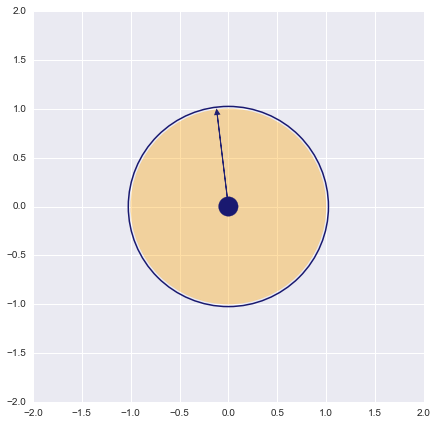

----------------------------------------------------------------
['REPS1']


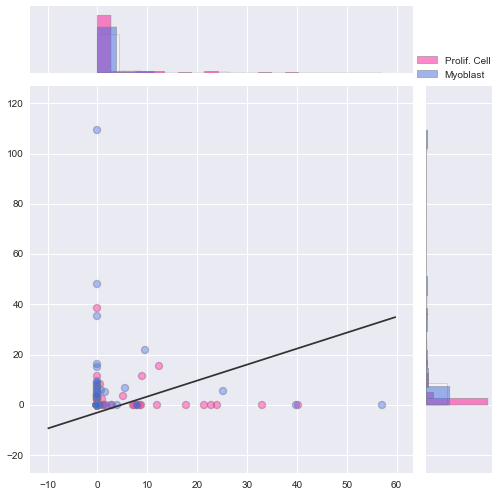

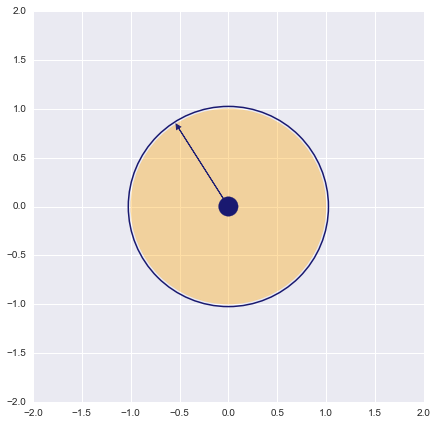

----------------------------------------------------------------
['RPL17']


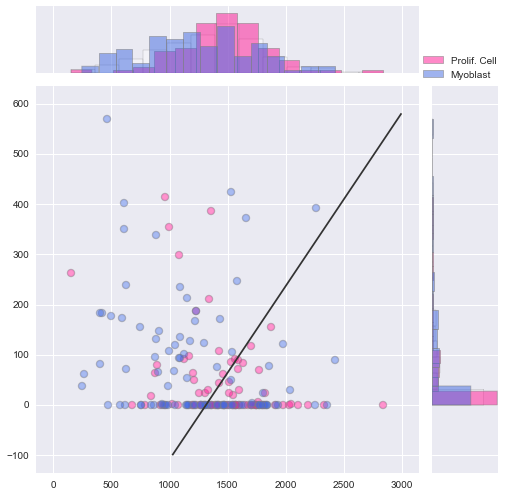

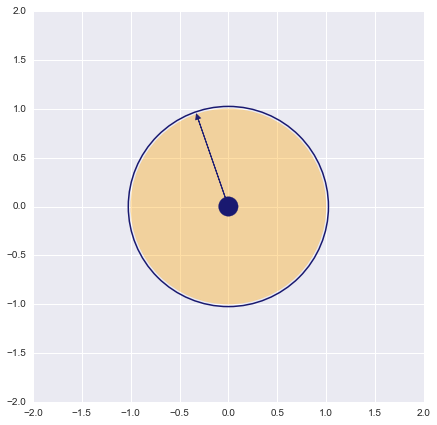

----------------------------------------------------------------
['SOD1']


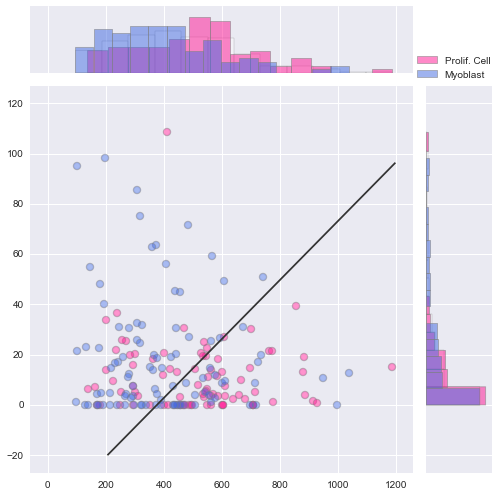

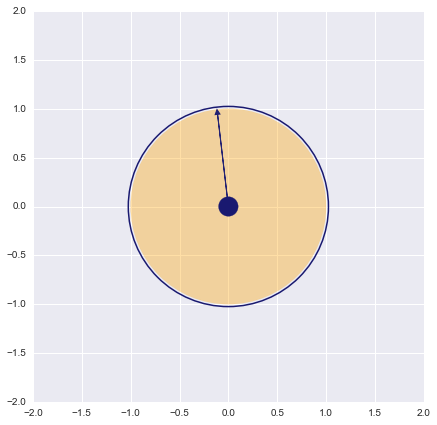

----------------------------------------------------------------
['ITGB3BP']


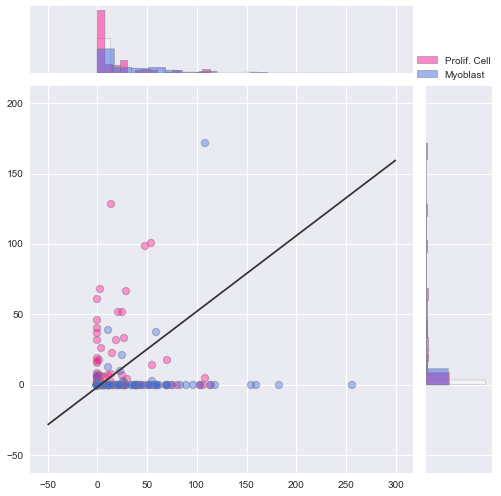

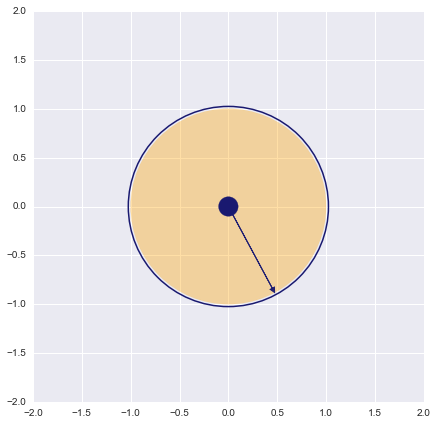

----------------------------------------------------------------
['MAGOH']


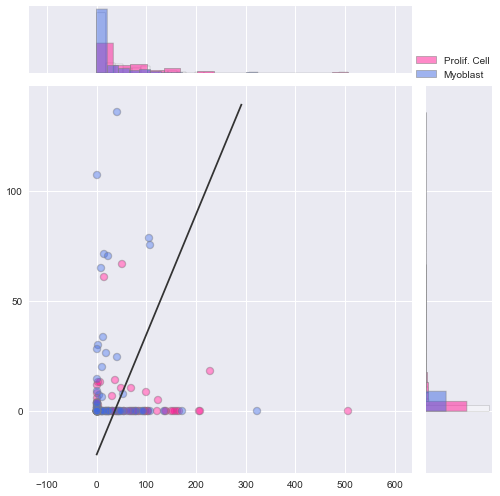

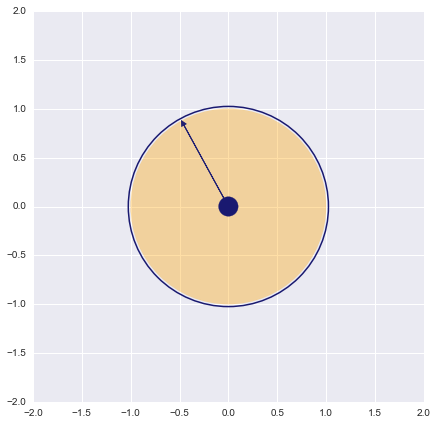

----------------------------------------------------------------
['NDUFC2']


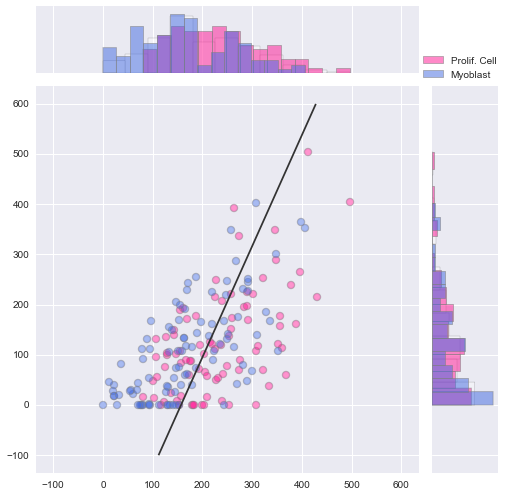

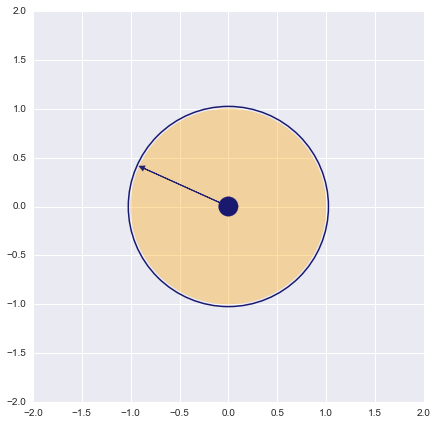

----------------------------------------------------------------
['RPL37']


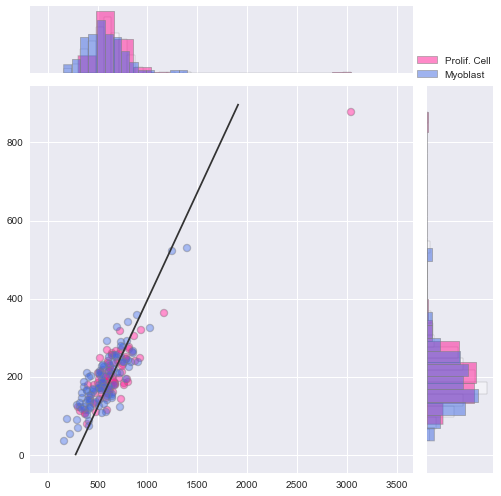

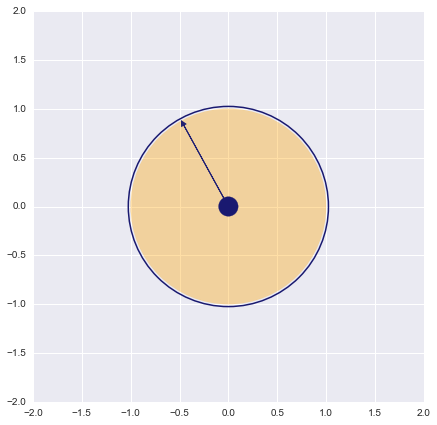

----------------------------------------------------------------
['ITGA7']


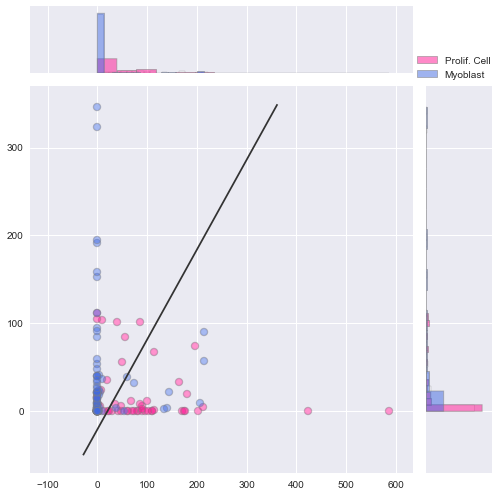

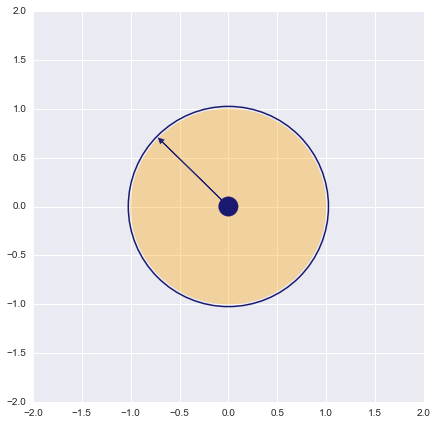

----------------------------------------------------------------
['SYCE2']


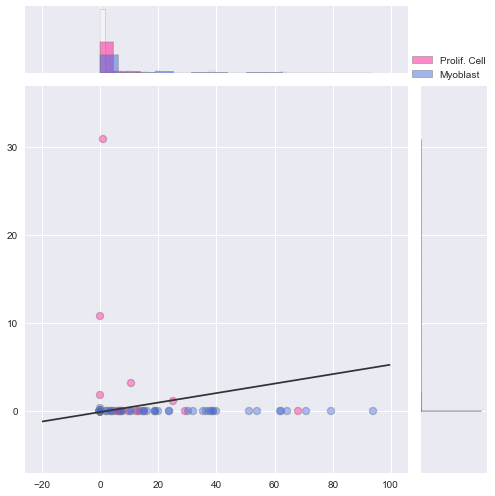

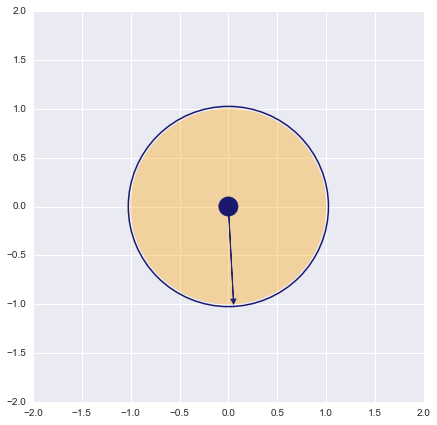

----------------------------------------------------------------
['TNS3']


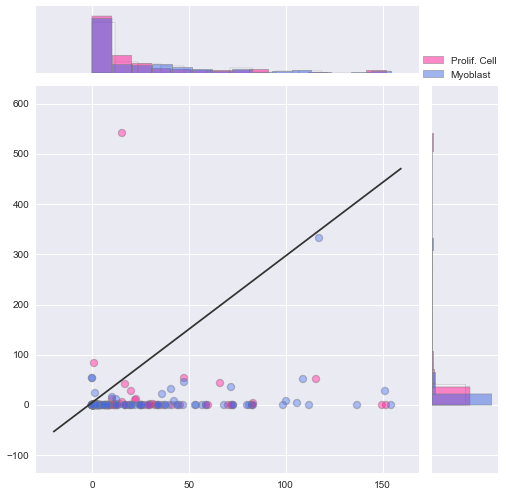

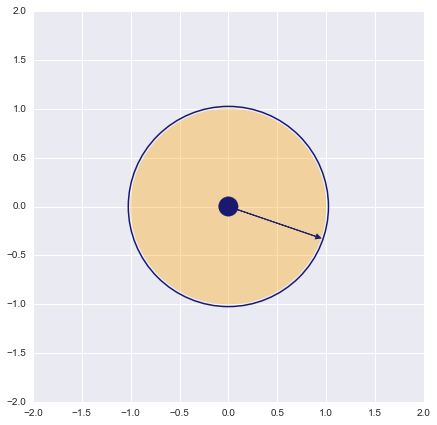

----------------------------------------------------------------
['RPL13A']


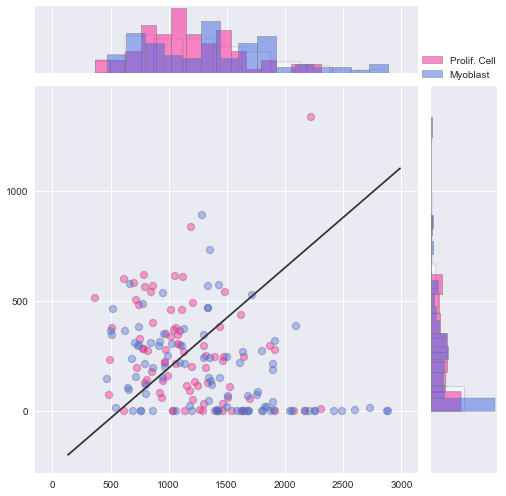

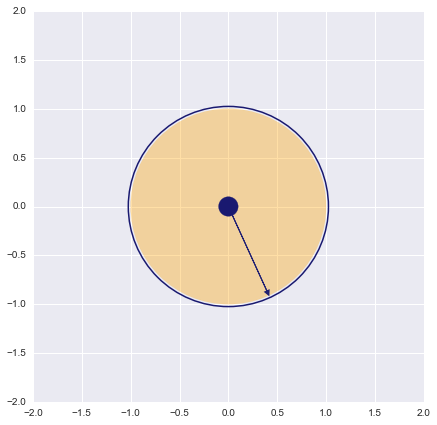

----------------------------------------------------------------
['COTL1']


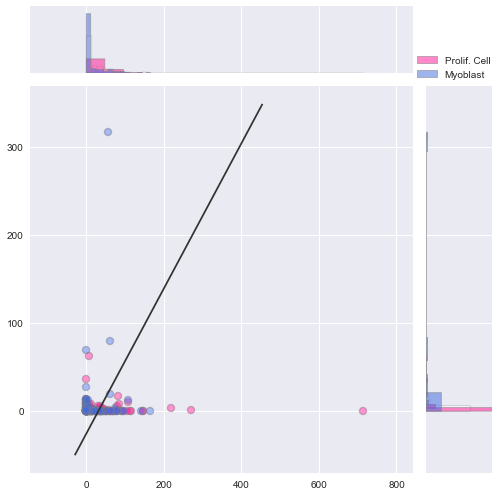

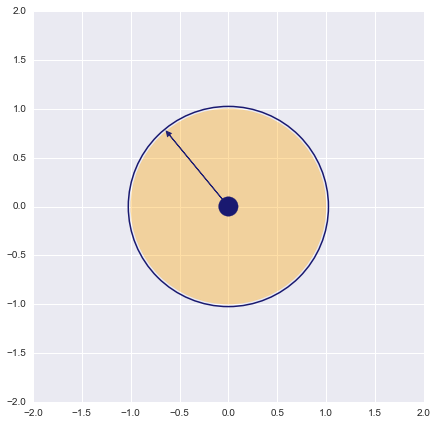

----------------------------------------------------------------
['KXD1']


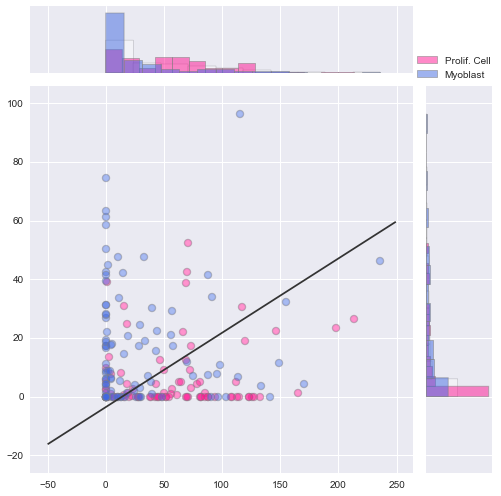

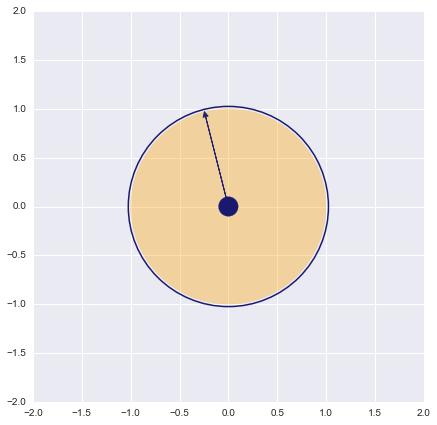

----------------------------------------------------------------
['HNRNPU']


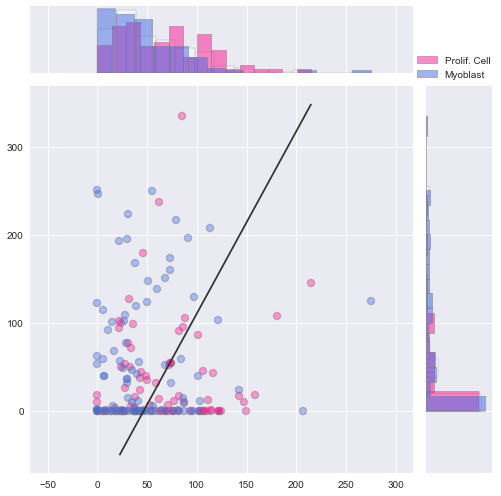

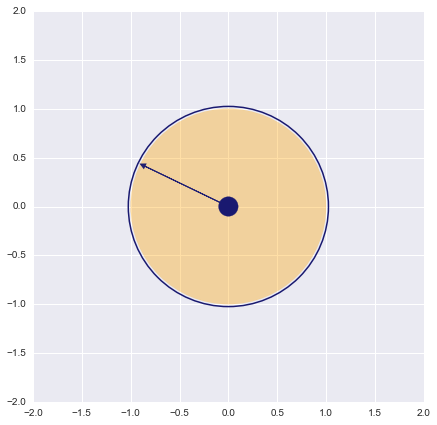

----------------------------------------------------------------
['NPHP1']


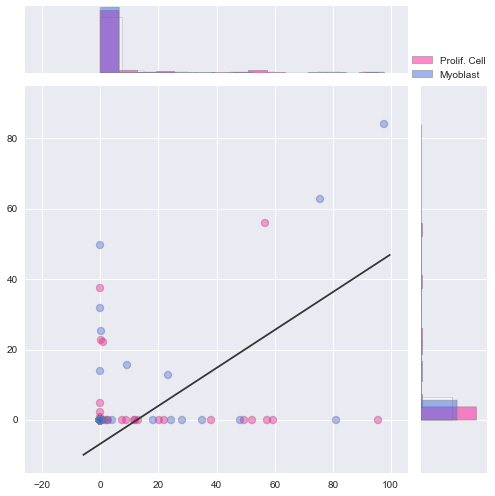

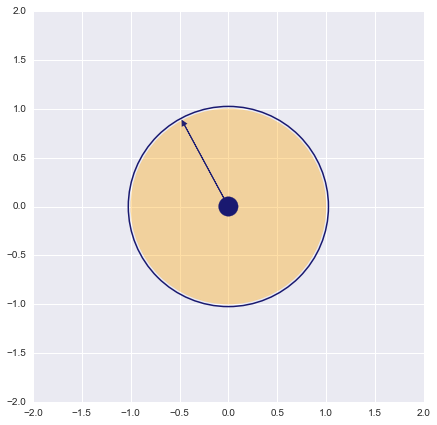

----------------------------------------------------------------
['PTS']


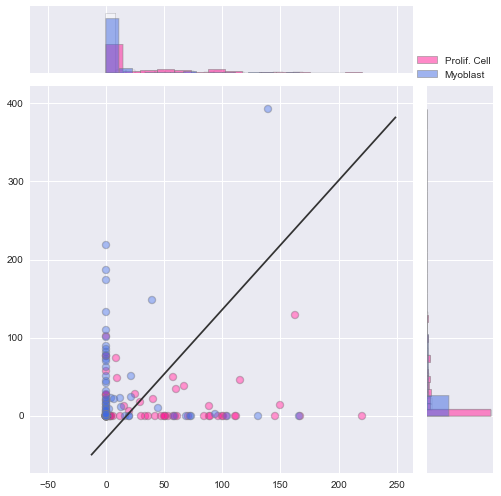

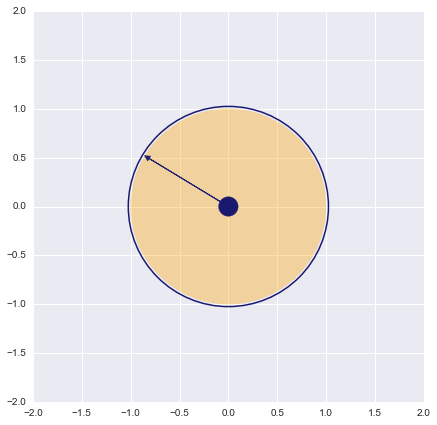

----------------------------------------------------------------
['ZNF605']


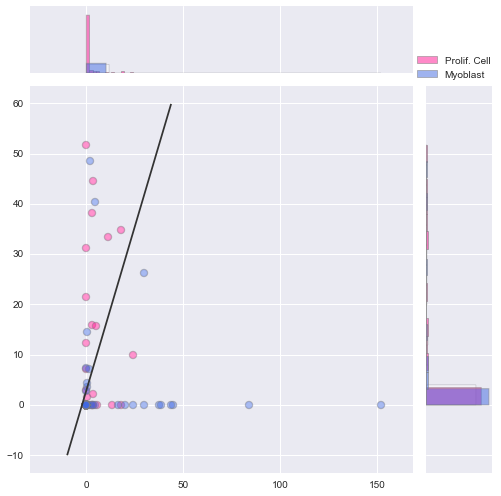

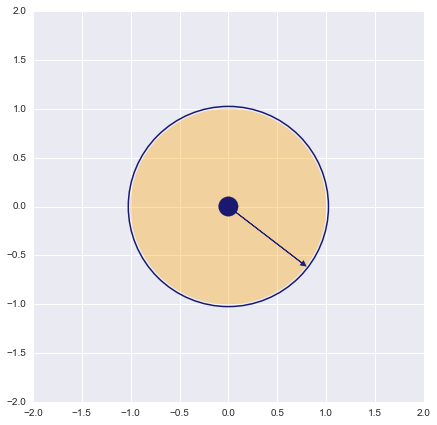

----------------------------------------------------------------
['YBX1']


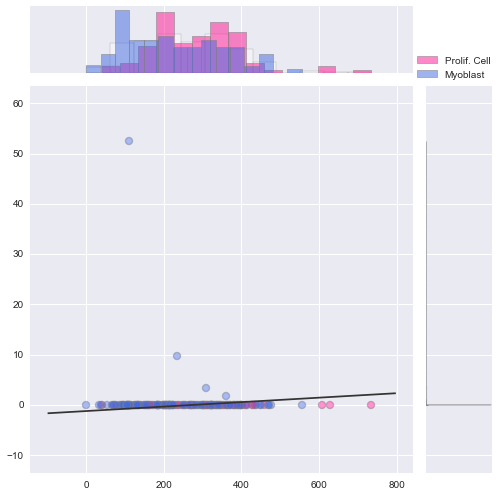

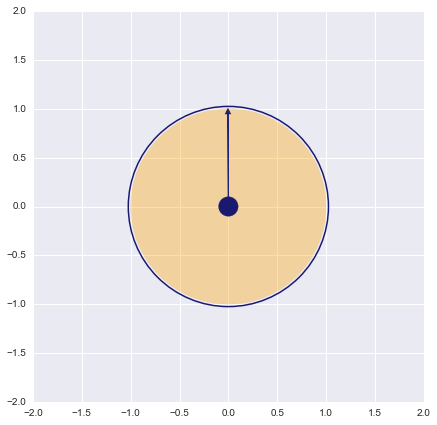

----------------------------------------------------------------
['LIPT1']


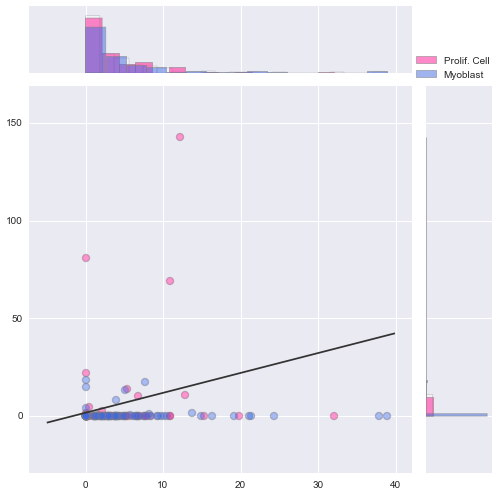

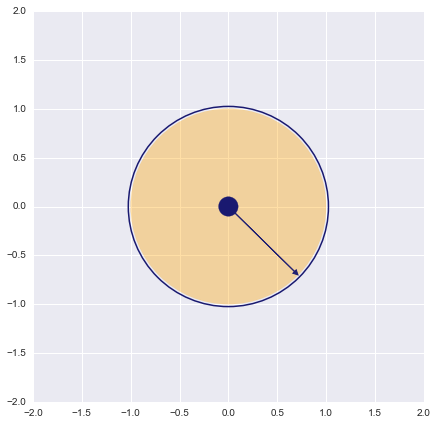

----------------------------------------------------------------
['ZNF724']


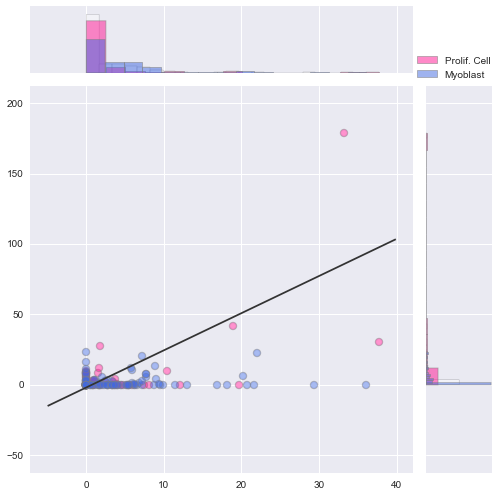

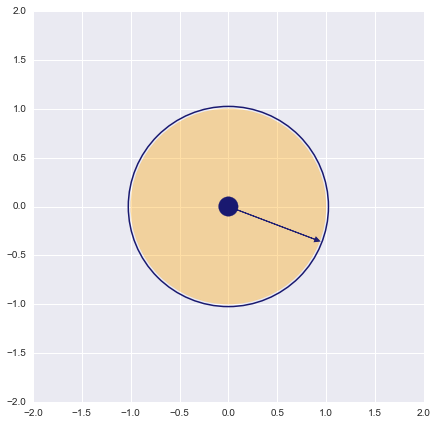

----------------------------------------------------------------
['BICD1']


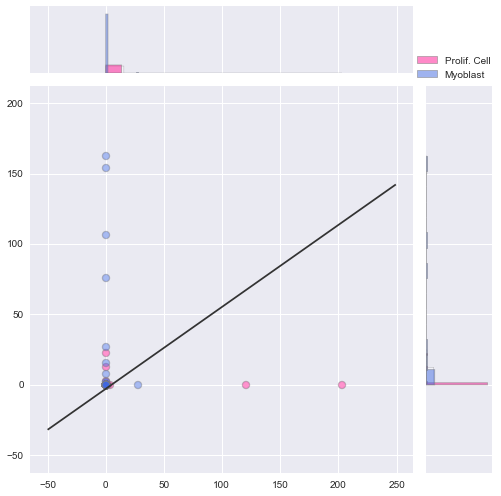

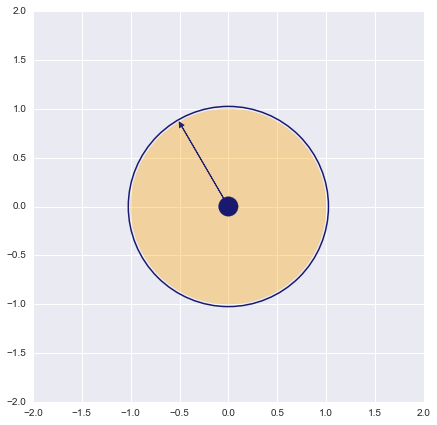

----------------------------------------------------------------
['ZC3H8']


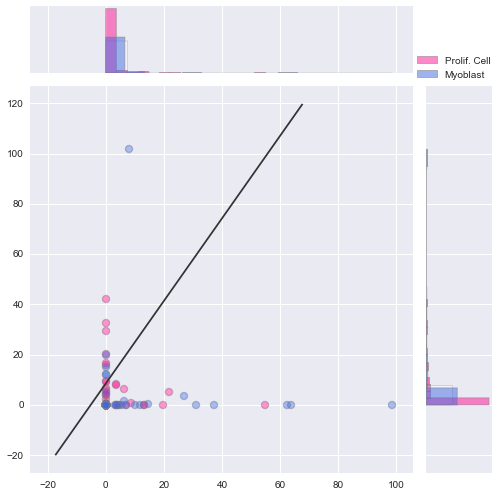

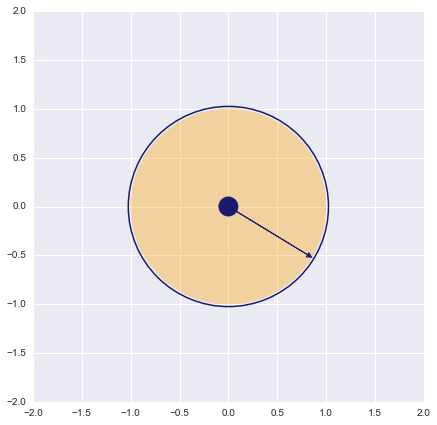

----------------------------------------------------------------
['ITGB1BP1']


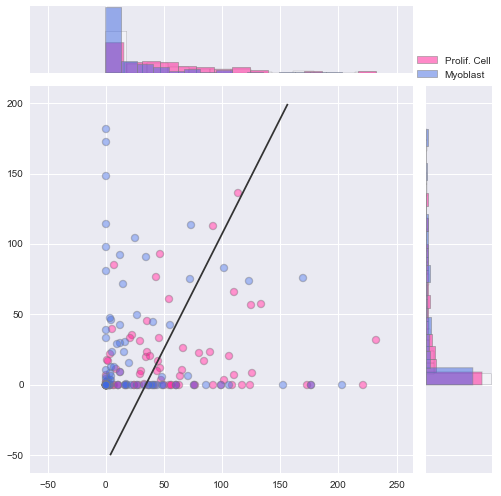

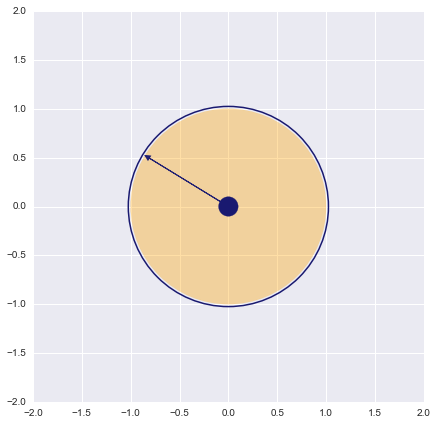

----------------------------------------------------------------
['DYSF']


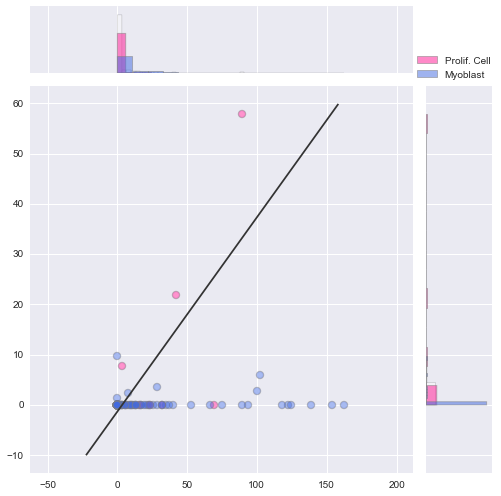

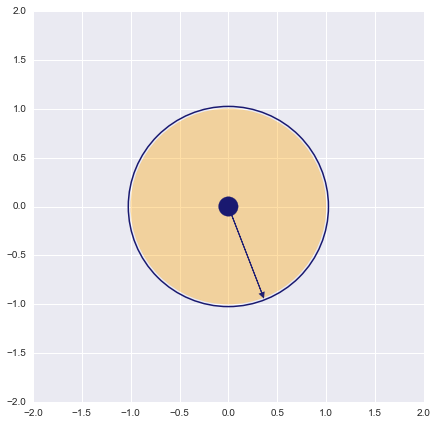

----------------------------------------------------------------
['COL1A1']


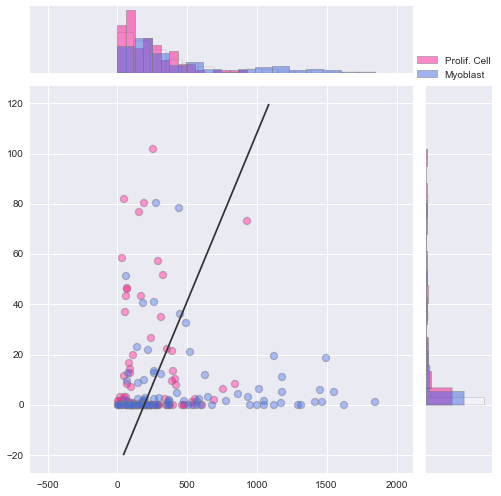

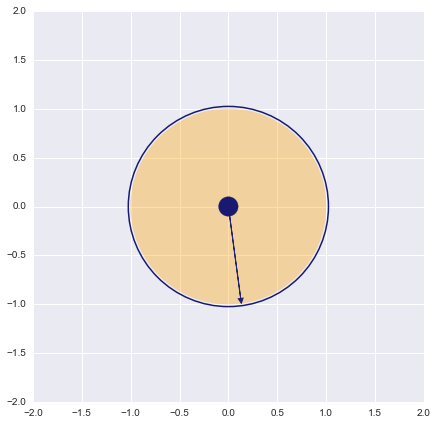

----------------------------------------------------------------
['FUT8']


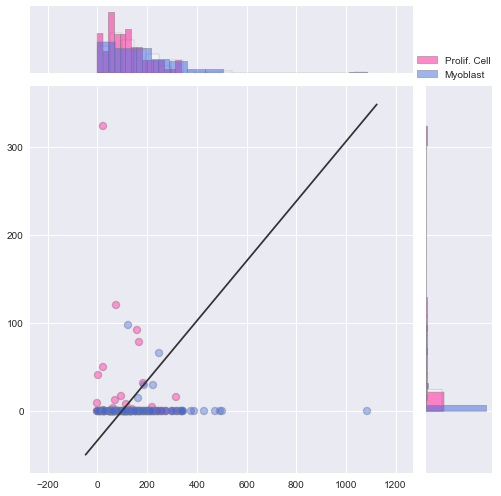

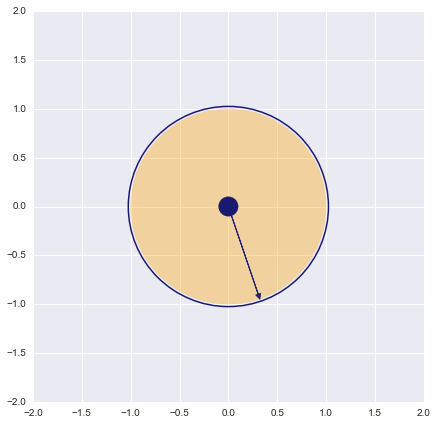

----------------------------------------------------------------
['FANCG']


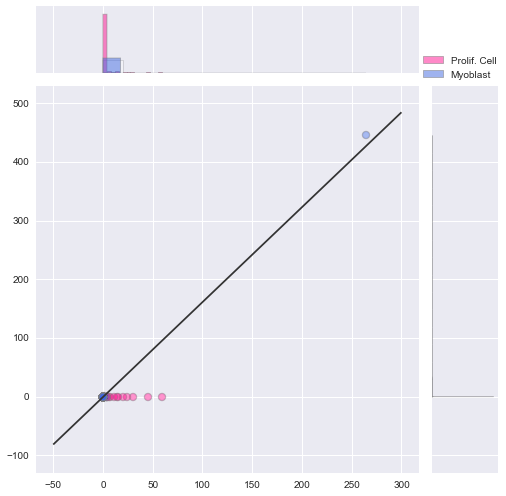

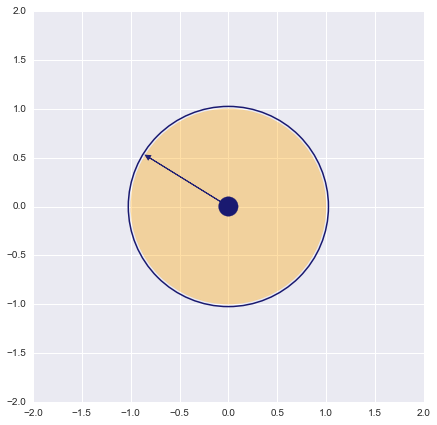

----------------------------------------------------------------
['SPSB1']


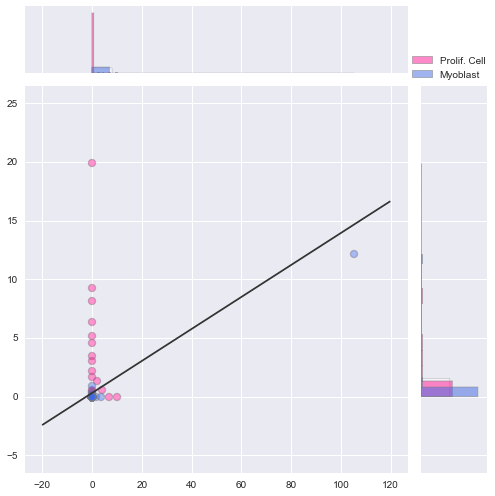

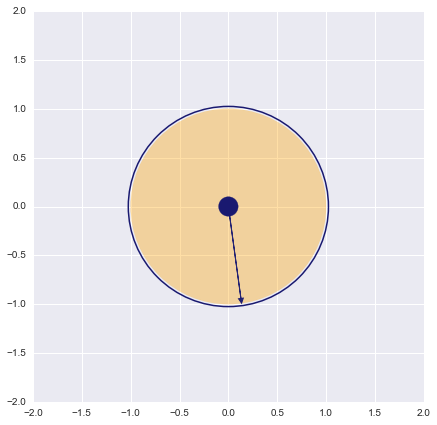

----------------------------------------------------------------
['MFN2']


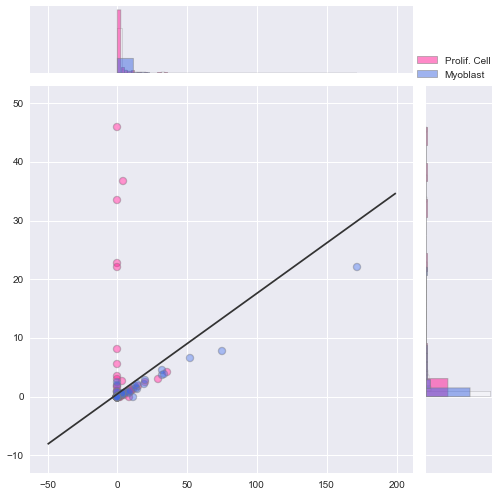

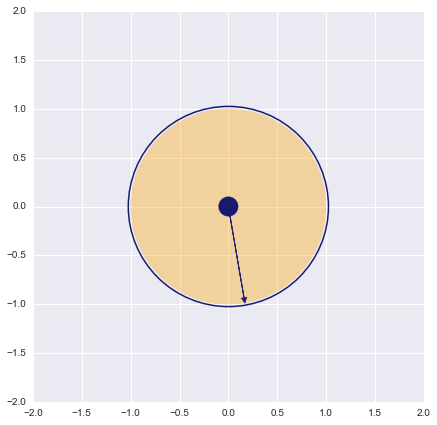

----------------------------------------------------------------
['LATS2']


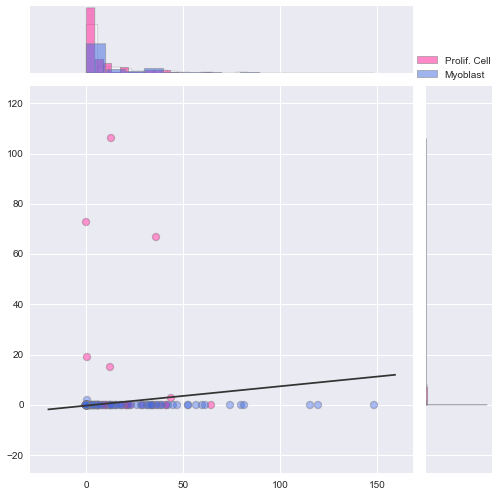

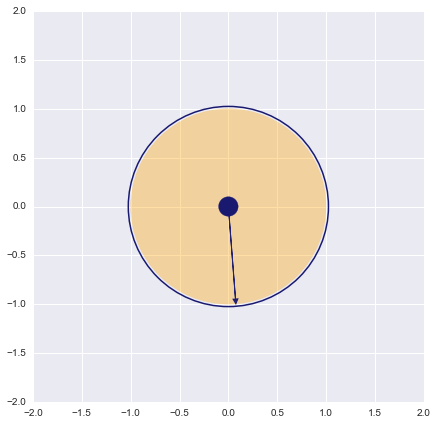

----------------------------------------------------------------
['HIST1H2BD']


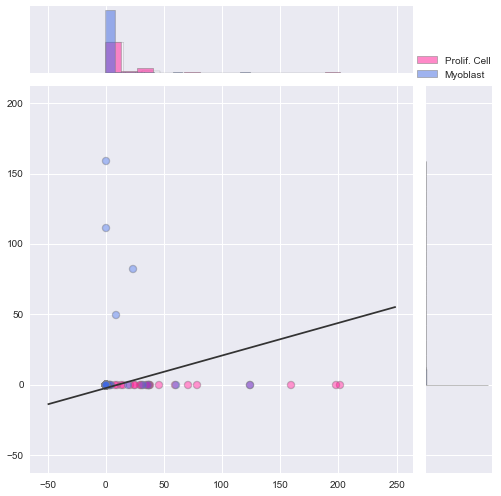

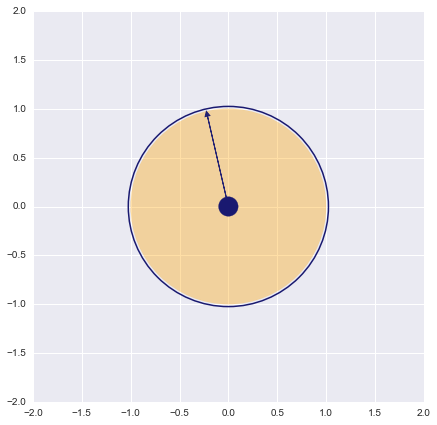

----------------------------------------------------------------
['SELENOT']


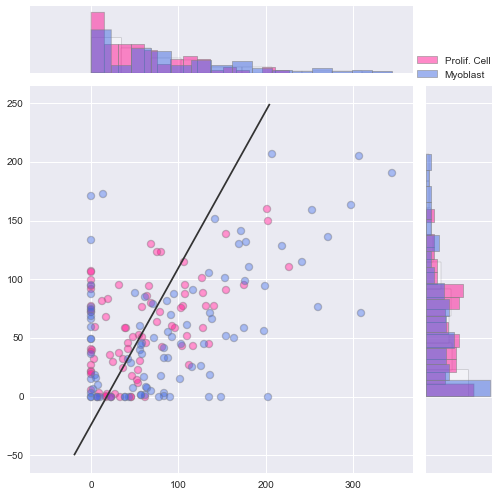

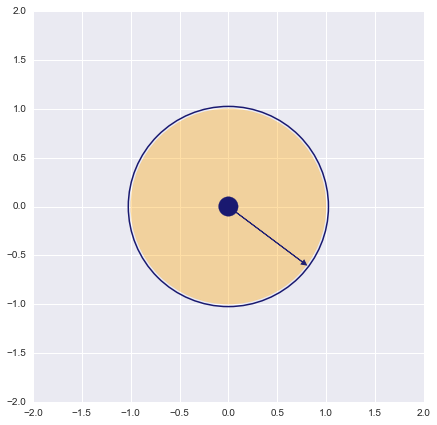

----------------------------------------------------------------
['RPS6KA5']


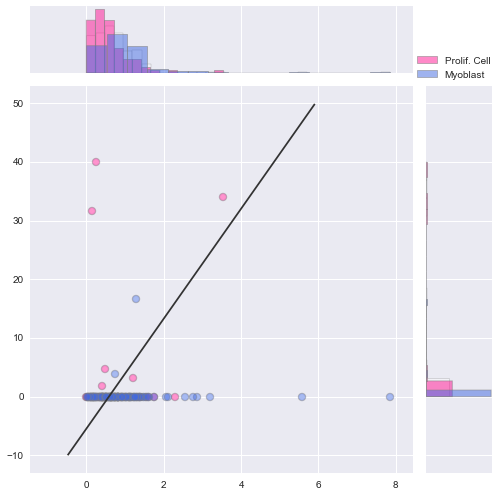

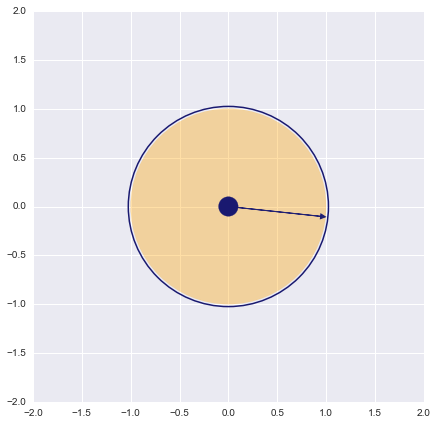

----------------------------------------------------------------
['TMPO']


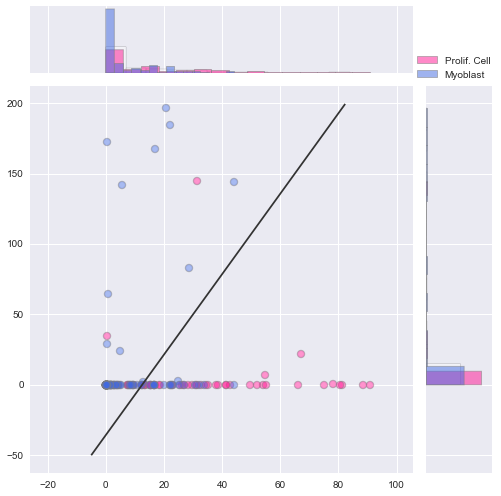

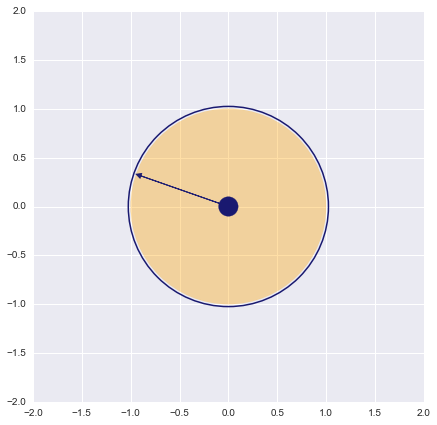

----------------------------------------------------------------
['KLF6']


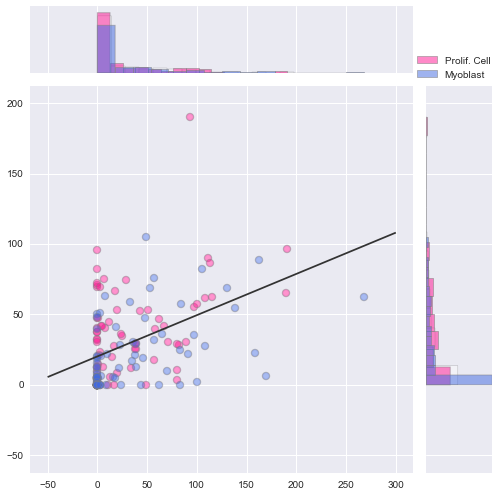

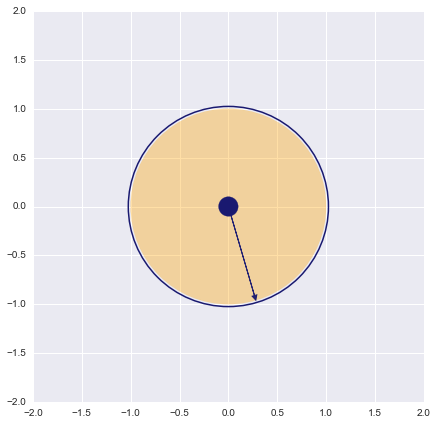

----------------------------------------------------------------
['SLIT3']


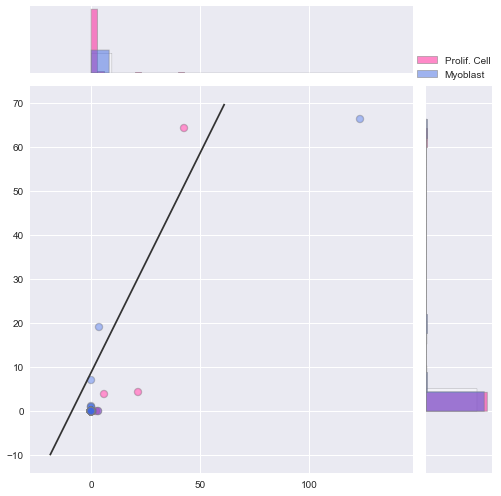

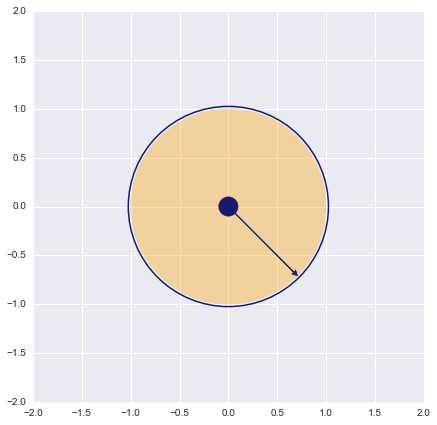

----------------------------------------------------------------
['EIF6']


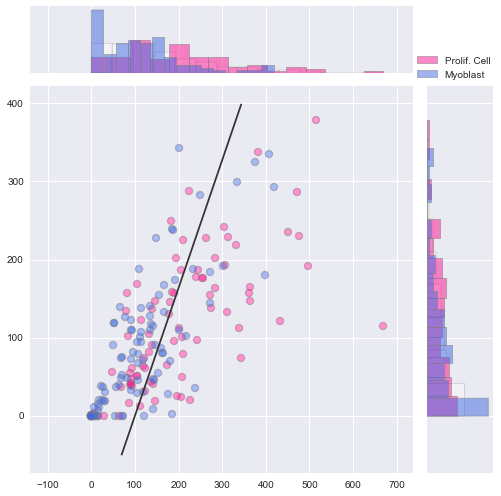

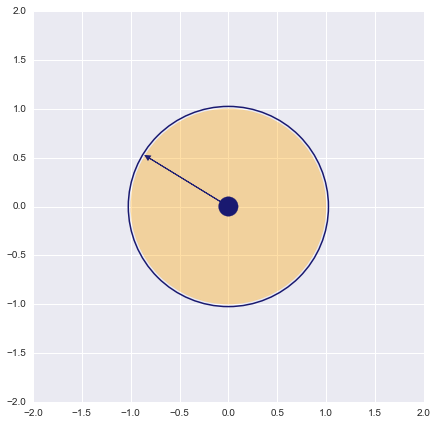

----------------------------------------------------------------
['MTBP']


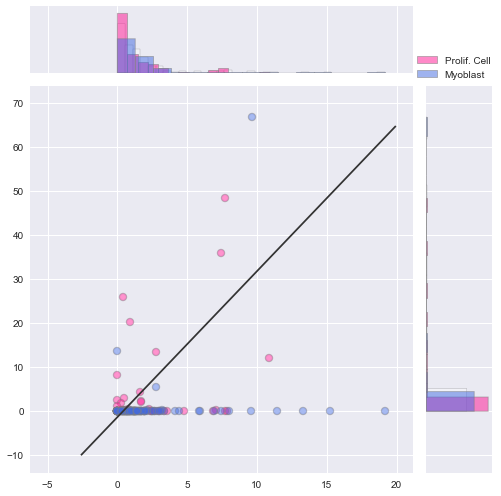

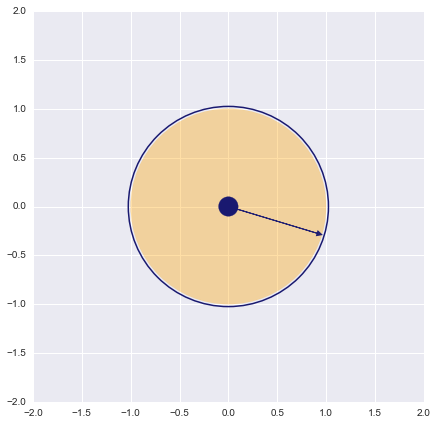

----------------------------------------------------------------
['PDE4DIP']


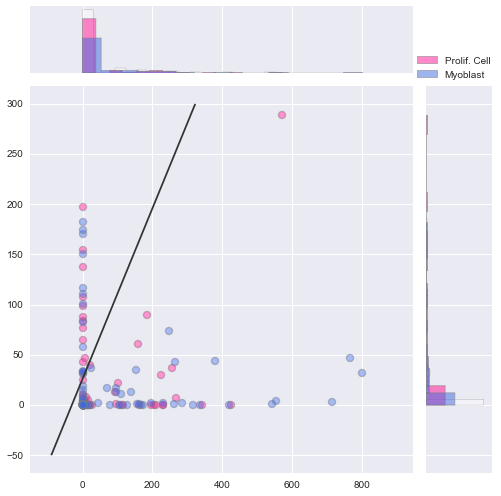

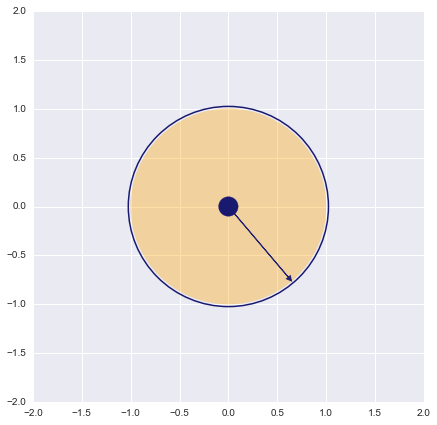

----------------------------------------------------------------
['DCBLD1']


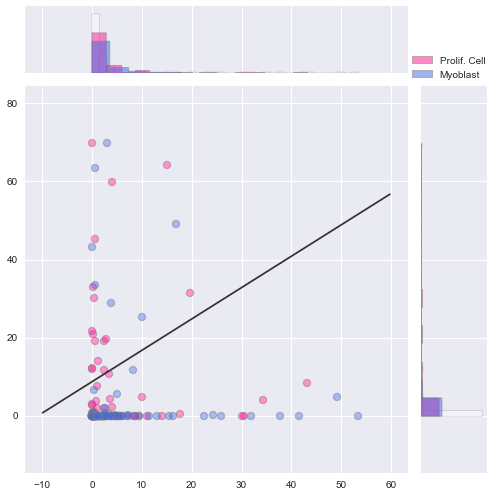

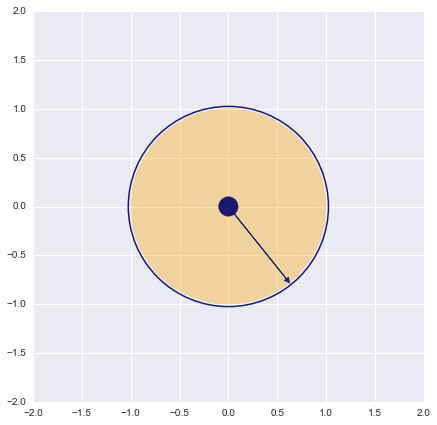

----------------------------------------------------------------
['FNDC3A']


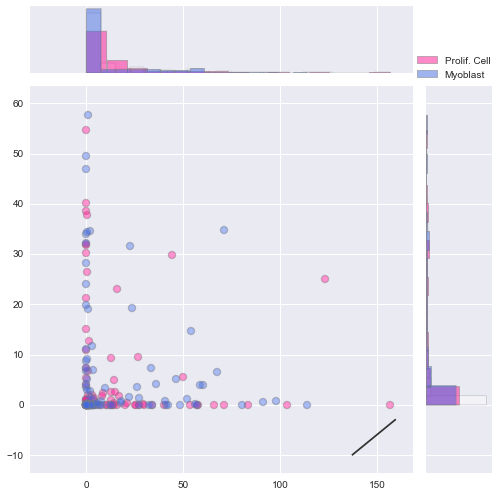

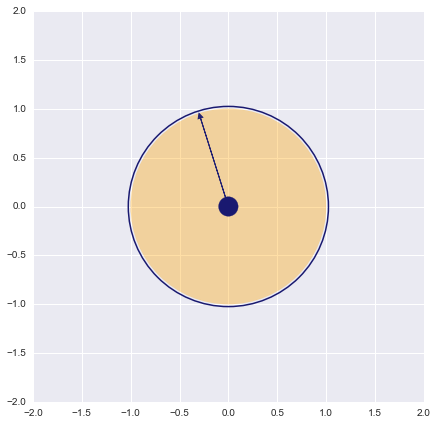

----------------------------------------------------------------
['ZMPSTE24']


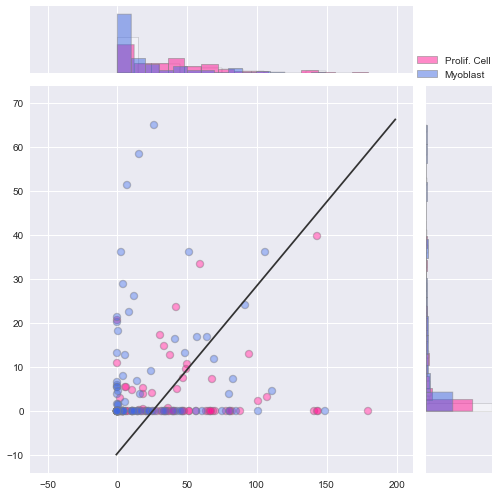

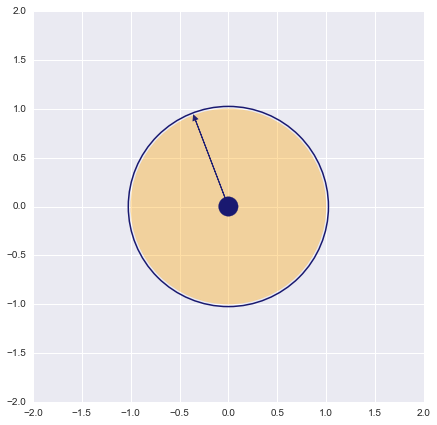

----------------------------------------------------------------
['ZHX3']


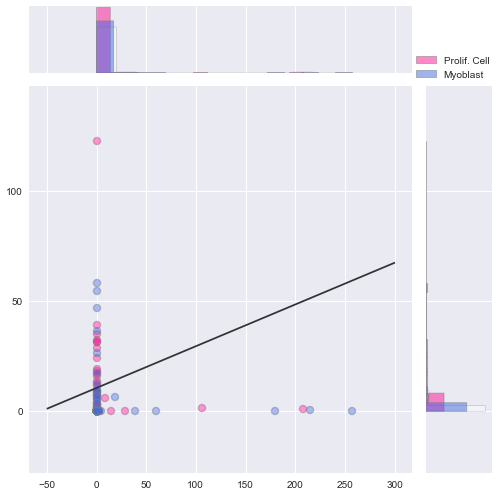

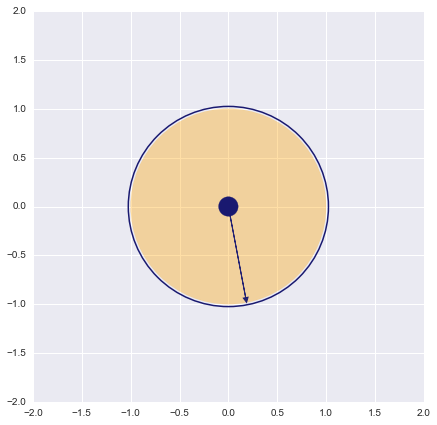

----------------------------------------------------------------
['TMEM189']


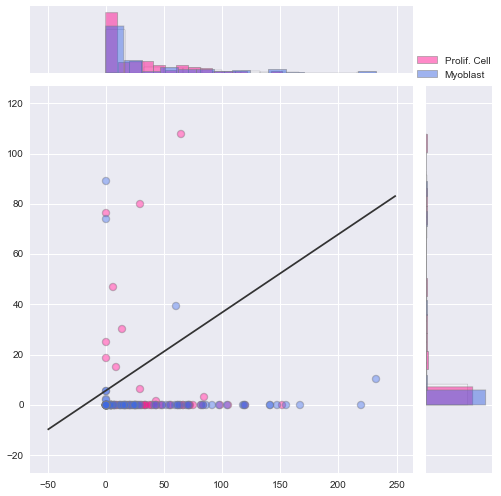

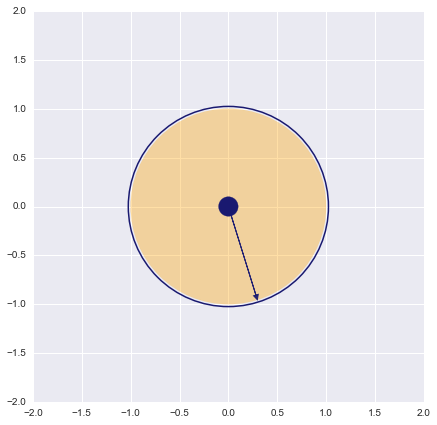

----------------------------------------------------------------
['TALDO1']


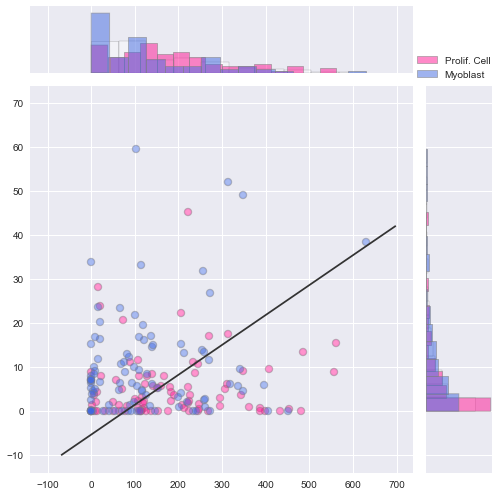

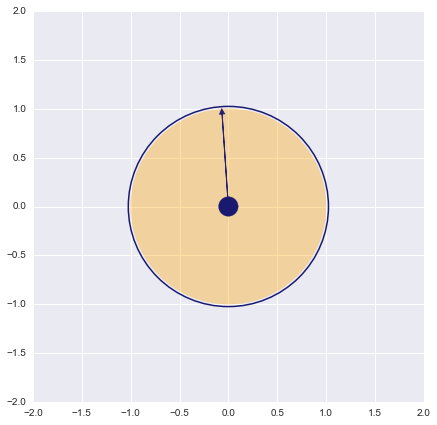

----------------------------------------------------------------
['TRIM7']


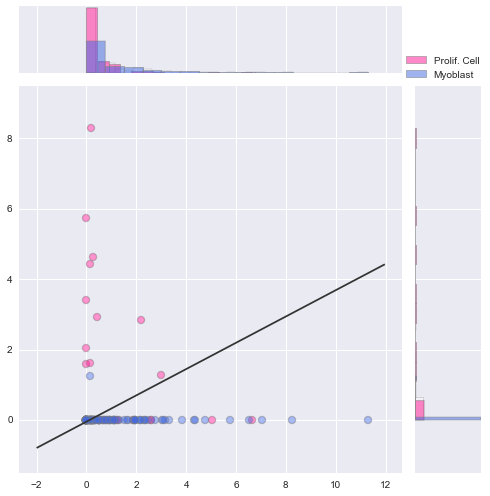

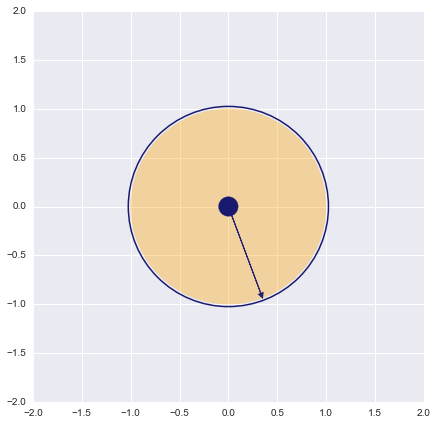

----------------------------------------------------------------
['SNAP29']


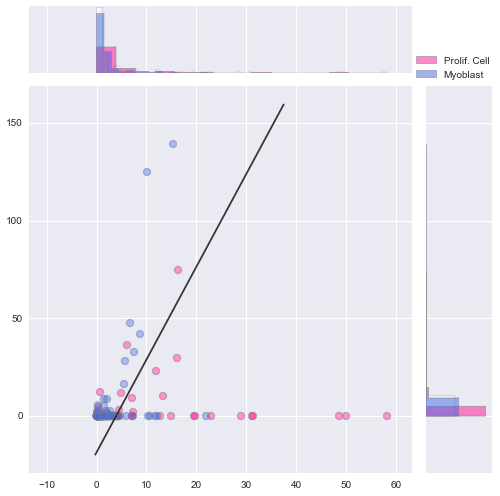

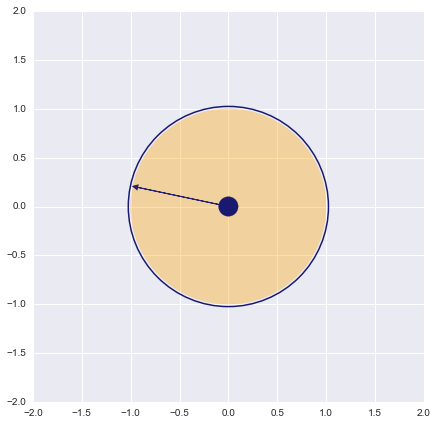

----------------------------------------------------------------
['POLR3K']


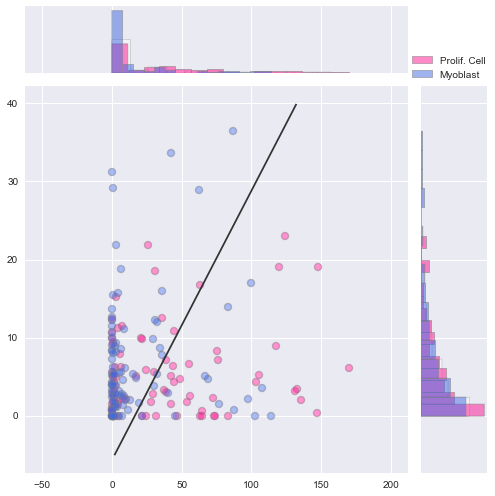

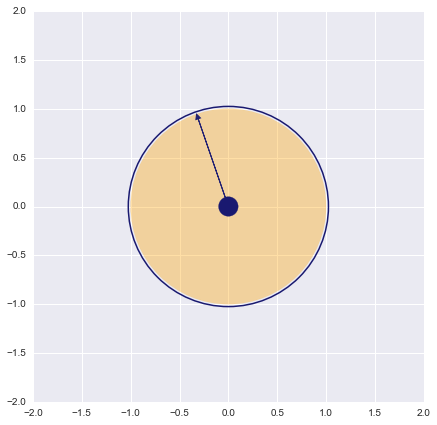

----------------------------------------------------------------
['KIAA0586']


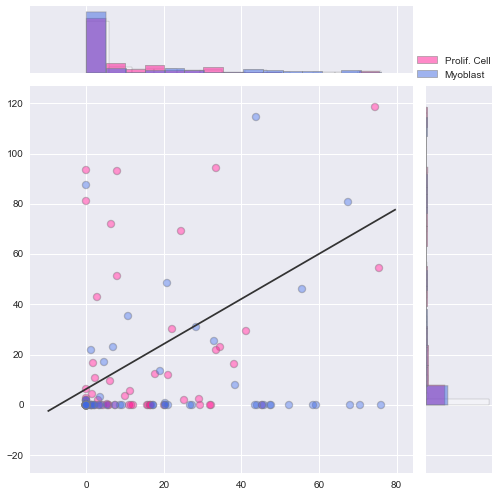

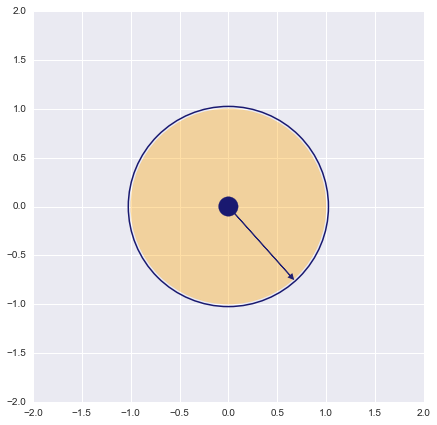

----------------------------------------------------------------
['MRPL51']


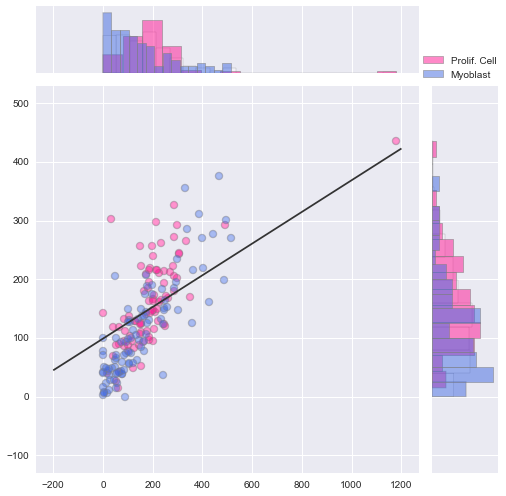

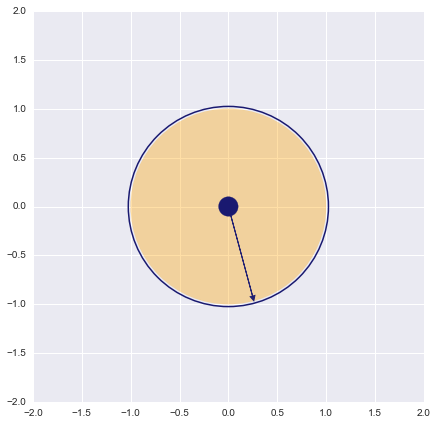

----------------------------------------------------------------
['C20orf24']


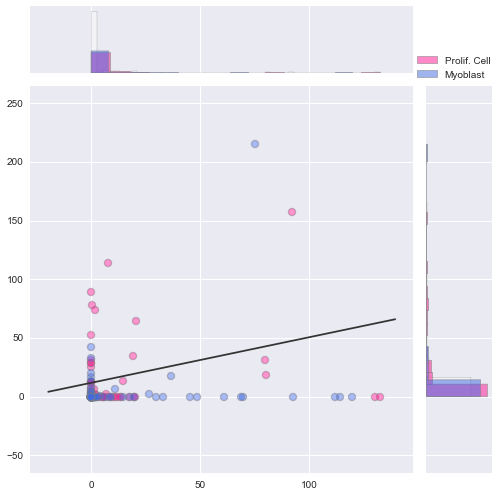

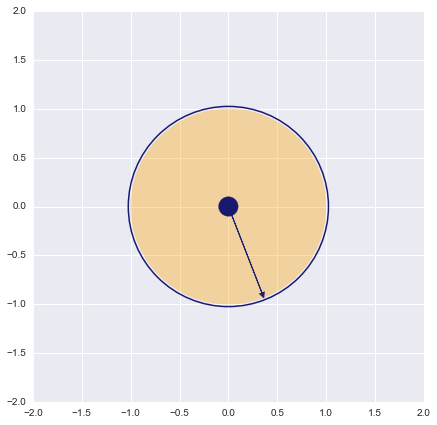

----------------------------------------------------------------
['ANKFY1']


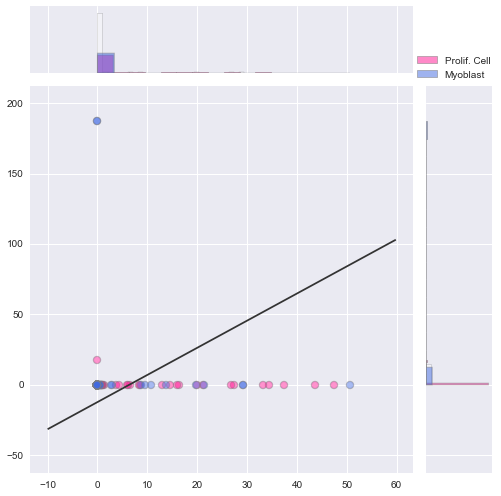

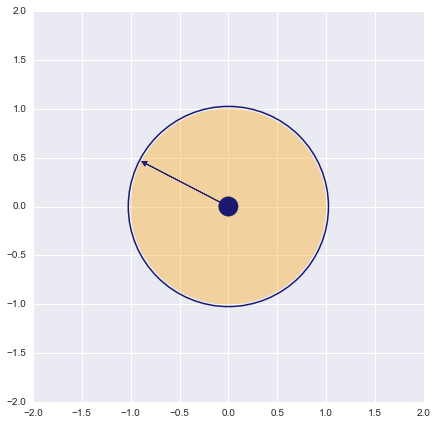

----------------------------------------------------------------
['ZNF131']


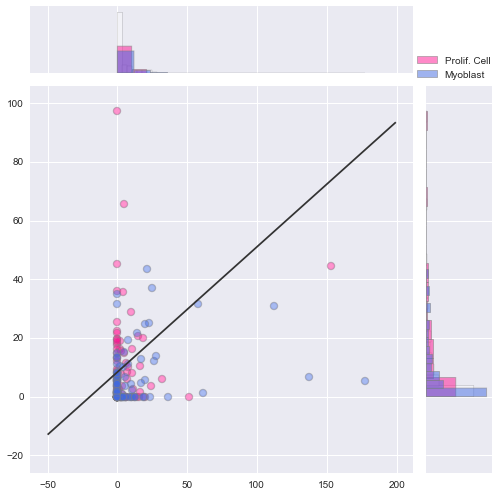

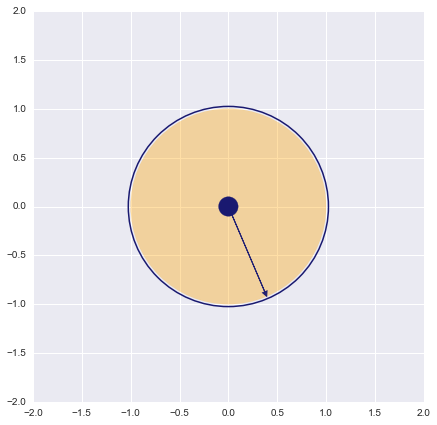

----------------------------------------------------------------
['ATP6V0A2']


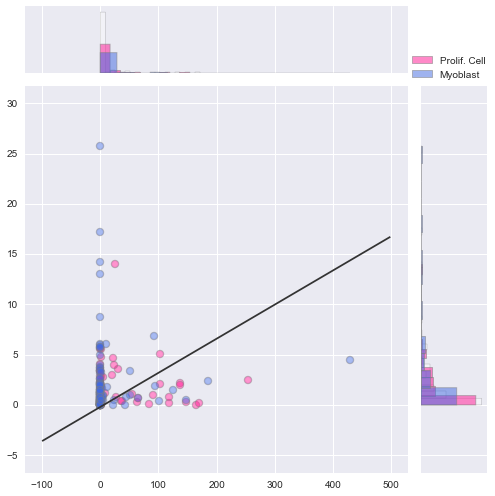

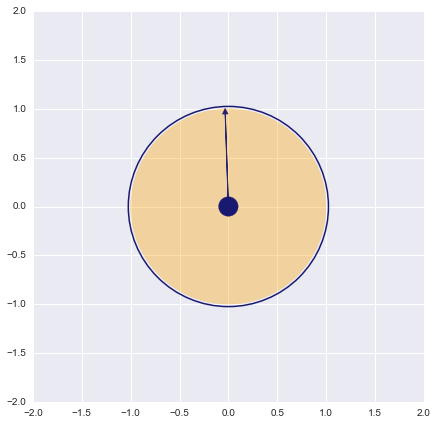

----------------------------------------------------------------


In [34]:
for ensg in alt_gn:
    print  all_gene_id_to_names[ensg]
    if len(ENSG_isoforms[ensg])>1:
        total_exp=X[:,gene_to_iso_IDX(ensg)].sum(axis=0)
    #     total_exp=np.std(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)/np.mean(X[:,gene_to_iso_IDX(all_gene_names_to_id[gn][0])],axis=0)

        argsrt=np.argsort(total_exp)
        idx=gene_to_iso_IDX(ensg)[argsrt][::-1][:2]
        k=2
        c1=X1[:,idx]
        c2=X2[:,idx]
        c=np.concatenate([c1,c2])
        
#         if np.any(np.mean(c,axis=0)==0):
#             c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
#             c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
#         else:
#             c=c-np.mean(c,axis=0)
#             c=c/np.std(c,axis=0)

    else:
        idx=gene_to_iso_IDX(ensg)
        k=2
        c1=np.concatenate((X1[:,idx],np.zeros((N1,1))),axis=1)
        c2=np.concatenate((X2[:,idx],np.zeros((N2,1))),axis=1)
        c=np.concatenate([c1,c2])
#         c[:,0]=c[:,0]-np.mean(c[:,0],axis=0)
#         c[:,0]=c[:,0]/np.std(c[:,0],axis=0)
#         print "ONE"

#     c=np.concatenate([c1,c2])
    # c=c-np.mean(c,axis=0)
#     print c.shape
#     print np.mean(c)
    labels = np.concatenate((np.ones(N1),np.zeros(N2)),axis=0)

    logr = LogisticRegression()
    logr.fit(c,labels)
    pred=np.array(logr.predict_proba(c)[:,1])
    gene_score=log_loss(labels,pred)

    llf=-gene_score*(N1+N2)
    p_of_1=N1/float(N1+N2)
    llnull=(N1+N2)*(p_of_1*np.log(p_of_1) + (1-p_of_1)*np.log(1-p_of_1))
    llr=llf-llnull
    llr_pval = 1-stats.chi2.cdf(2*llr,k)

    w=logr.coef_[0]
    w0=logr.intercept_[0]
#     print "score",gene_score
#     print "llf",llf
#     print "llnull",llnull
#     print "LLR",llr
#     print "p-val",llr_pval

    a=sns.jointplot(x=c[:,0], y=c[:,1], color='white',size=7,marginal_kws=dict(norm_hist=True),stat_func=None,label='_nolegend_');

    a.ax_joint.scatter(c[:N1,0],c[:N1,1],color='deeppink',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Prolif. Cell')
    a.ax_marg_x.hist(c[:N1,0],bins=15,normed=1,alpha=0.5,color='deeppink',edgecolor="gray", linewidth=1,)
    a.ax_marg_y.hist(c[:N1,1],bins=15,normed=1,alpha=0.5,color='deeppink',orientation='horizontal',edgecolor="gray", linewidth=1,label='Prolif. Cell')

    a.ax_joint.scatter(c[N1:,0],c[N1:,1],color='royalblue',alpha=0.4595135,s=55,edgecolor="gray", linewidth=1,label='Myoblast')
    a.ax_marg_x.hist(c[N1:,0],bins=15,normed=1,alpha=0.5,color='royalblue',edgecolor="gray", linewidth=1,)
    a.ax_marg_y.hist(c[N1:,1],bins=15,normed=1,alpha=0.5,color='royalblue',orientation='horizontal',edgecolor="gray", linewidth=1,label='Myoblast')

    plt.legend(bbox_to_anchor=(0.1, 1, 1., .102))
    # a.ax_joint.set_xlim([-40,40])
    # a.ax_joint.set_ylim([-40,40])
    ylim=a.ax_joint.get_ylim()
    xlim=a.ax_joint.get_xlim()
    xx, yy = np.mgrid[xlim[0]:xlim[1]:(xlim[1]-xlim[0])/500., ylim[0]:ylim[1]:(ylim[1]-ylim[0])/500.]
    grid = np.c_[xx.ravel(), yy.ravel()]
    probs = logr.predict_proba(grid)[:, 1].reshape(xx.shape)
    a.ax_joint.contour(xx, yy, probs, levels=[.5], cmap="Greys", vmin=0, vmax=.6)
    plt.show()
    sns.set_style("darkgrid")    

    plt.figure(figsize=(7,7))
    x0, y0 = 0, 0
    radius = 1
    # Draw circle
    circle1 = plt.Circle((x0,y0), radius, color='orange', fill=True,alpha=0.35)
    circle2 = plt.Circle((x0,y0), radius+0.025, color='midnightblue', fill=False,linewidth=1.5)

    fig = plt.gcf()
    fig.gca().add_artist(circle1)
    fig.gca().add_artist(circle2)
    head_length=0.05
    vec=-w/np.linalg.norm(w)
    plt.arrow(x0, y0,
                 (radius - head_length) * vec[0],
                 (radius - head_length) * vec[1],
                 head_width=0.05, head_length=head_length, fc='midnightblue', ec='midnightblue',alpha=0.95,linewidth=1)
    plt.xlim([-2,2])
    plt.ylim([-2,2])

    circleC = plt.Circle((x0,y0), 0.1, color='midnightblue', fill=True,alpha=1)
    fig.gca().add_artist(circleC)
    plt.show()
    print '----------------------------------------------------------------'